# PyOAE - Sensitivity of CO2 flux and ηmax to the biological component of pCO2 in the global oceans and response to OAE

by Greg Pelletier, 08-Apr-2025

#### *Sensitivity of CO2 flux and ηmax to biological pCO2*

We evaluated the following two hypothetical scenarios in order to explore the sensitivity of the CO2 flux, ηmax, and selected carbonate system variables (CO3--, Ωara, and pH) to perturbations of the biological component of pCO2: 

- Scenario 1: assume that the monthly anomalies of pCO2_bio in each grid cell are 0.5 times the observed monthly anomalies
- Scenario 2: assume that the monthly anomalies of pCO2_bio in each grid cell are 2 times the observed monthly anomalies

We solved for the hypothetical pCO2 that would be present in each scenario with the following equations:

- pCO2_scen1 = pCO2_bio_scen1 + pCO2_atm + pCO2_T - pCO2_mean     (eqn 1)
- pCO2_scen2 = pCO2_bio_scen2 + pCO2_atm + pCO2_T - pCO2_mean     (eqn 2)
- pCO2_bio_scen1 = pCO2_bio_average + 0.5 * pCO2_bio_anom     (eqn 3)
- pCO2_bio_scen2 = pCO2_bio_average + 2 * pCO2_bio_anom     (eqn 4)
- pCO2_bio_anom = pCO2_bio - pCO2_bio_average     (eqn 5)

where

- pCO2_scen1 = hypothetical surface ocean pCO2 under Scenario 1
- pCO2_scen2 = hypothetical surface ocean pCO2 under Scenario 2
- pCO2_bio = biogeochemical/physical (aka "biological") component of pCO2 (explained below)
- pCO2_bio_average = arithmetic mean over time of pCO2_bio in each grid cell
- pCO2_bio_anom = monthly anomaly of pCO2_bio relative to pCO2_bio_average
- pCO2_atm = atmospheric pCO2 (estimated from SeaFlux)

Equations 1 and 2 are based on equation 14 below.

For both Scenario 1 and 2 we calculated the resulting values of the sea-air CO2 flux, ηmax, and selected carbonate system variables (CO3--, Ωara, and pH) using either pCO2_scen1 or pCO2_scen2, combined with assuming that the TA, silicate, phospate, temperature, and salinity were equal to the observed values from OceanSODA-ETHZ.

The sea-air CO2 flux (FCO2) was estimated using the following equation with K0 (sol), kw, and ice from SeaFlux v2023 (Gregor, 2023):

FCO2 = K0 * kw * (pCO2_sea - pCO2_atm) * (1 - ice) * 1000 * 24 / 100     (eqn 6)

where 

- FCO2 = sea-air CO2 flux (mmol/m^2/day
- K0 (sol) = solubility of CO2 (mol/m^3/uatm)
- kw = gas transfer velocity (ERA5 wind) (cm/hr)
- pCO2_sea = seawater pCO2 (uatm)
- pCO2_atm = atmosphereic pCO2 (uatm)
- ice = fraction of water surface covered by ice (fraction)

#### *Response to OAE*

We evaluated the observed condtions and each of the two scenarios under the following two condtions of added total alkalinity (TA):

- "Control" conditions  without OAE addition of TA
- "Treatment" conditions with continuous OAE addition of 100 umol/kg of TA as NaOH

#### *Thermal and non-thermal components of pCO2*

Variations in temperature can have a significant effect on pCO2 in seawater (Sarmiento and Gruber, 2006). Therefore, methods have been developed to separate the thermal and non-thermal components of the observed pCO2 (e.g. Takahashi et al 2002; Fassbender et al 2022).

In this notebook, we present a method to separate the non-thermal component of the pCO2 into atmospheric and biogeochemical/physical components. We will refer to the biogeoechemical/physical component as "biological" for simplicity. 

**Fassbender's method of estimating non-thermal and thermal components of pCO2**

We use the PyOAE function "pco2_fass" to apply Fassbender's method as described in Rodgers et al (2022). The first step is to calculate the long-term average pCO2 (pCO2_mean) using a carbonate system calculator (e.g. PyCO2SYS) using inputs of the long-term averages of alkalinity (TA_mean), dissolved inorganic carbon (DIC_mean), total silicate (SIO4_mean), total phosphate (PO4_mean), temperature (temp_mean), and salinity (sal_mean), as follows:

pCO2_mean = f(temp_mean, sal_mean, TA_mean, DIC_mean, SIO4_mean, PO4_mean)   (eqn 7)

where "f" is the carbonate system calculation function (e.g. PyCO2SYS).

The thermally-driven component of pCO2 (pCO2_T) is calculated using the time-varying temperature observations (temp_obs), combined with the long-term averages of the other inputs to PyCO2SYS as follows:

pCO2_T = f(temp_obs, sal_mean, TA_mean, DIC_mean, SIO4_mean, PO4_mean)   (eqn 8)

The thermal pCO2 component seasonal cycle anomaly (pCO2_Tanom) is estimated from the following equation:

pCO2_Tanom = pCO2_T - pCO2_mean     (eqn 9)

Finally, the non-thermal component of pCO2 (pCO2_NT) is estimated with the following equation:

pCO2_NT = pCO2_obs - pCO2_Tanom     (eqn 10)

Fassbender's method decomposes the observed pCO2 into the thermal and non-thermal components such that the following equation is applicable:

pCO2_obs = pCO2_NT + pCO2_T - pCO2_mean          (eqn 11)

#### *Biological and atmospheric components of pCO2*

The non-thermal component of the pCO2 of a given water mass is affected by air–sea gas exchange, and biogeochemical/physical processes, such as production/consumption of organic matter and mixing (analogous to the processes affecting the "biological" component of DIC described by Clargo et al 2015 and Burt et al, 2016). To isolate the biological (biogeochemical/physical) component of pCO2 (pCO2_bio), the atmospheric pCO2 (pCO2_atm) is removed from the non-thermal component of pCO2 (pCO2_NT) as follows: 

pCO2_bio = pCO2_NT – pCO2_atm				(eqn 12)

where 

- pCO2_NT = non-thermal component of pCO2 (OceanSODA-ETHZ using Fassbender's method)
- pCO2_atm = atmospheric pCO2 (SeaFlux)

Equation 12 is also equivalent to the following equation:

pCO2_NT = pCO2_bio + pCO2_atm				(eqn 13)

Substituting equation 13 into equation 11 results in the following equation for the decomposition of the surface ocean pCO2 into separate biogeochemical/physical ("biological"), atmospheric, and thermal components:

pCO2_obs = pCO2_bio + pCO2_atm + pCO2_T - pCO2_mean          (eqn 14)

In this notebook, we use the pCO2_NT calculated using Fassbender's method (Rodgers et al 2022), using 1982-2022 monthly observed surface ocean carbonate system variables and temperatures in the OceanSODA-ETHZ data set in each month at each grid
cell. We use the 1982-2022 monthly atmospheric pCO2_atm estimated from the SeaFlux atmospheric fCO2 data (adjusted by the fugacity factor using the PyOAE function fCO2_to_pCO2). Finally, we
calculated the 1982-2022 monthly values of "pCO2_bio" using eqn 12.

#### *OceanSODA-ETHZ and SeaFlux data used in this notebook*

In this example we use two netcdf files that we need to do the analysis, OceanSODA_ETHZ_for_PyOAE.nc and SeaFlux_for_PyOAE.nc, available to download at the following link:

https://drive.google.com/drive/folders/1BGgVRk2Gf6mxNnX1Fxg0Q4GtZSAYMzef?usp=sharing

#### *PyOAE functons pco2_fass, fCO2_to_pCO2, and etamax*

PyOAE includes functions to calculate thermal and non-thermal components of pCO2 using Takahashi's method (function pco2_tnorm), and using Fassbender's method (function pco2_fass). We convert the SeaFlux atmospheric fCO2 data to pCO2 using the fugacity estimated by the PyOAE fCO2_to_pCO2 function. We calcuated ηmax using the etamax function of PyOAE.

#### *References*

- Takahasi et al 2002 (http://dx.doi.org/10.1016/S0967-0645(02)00003-6)
- Rodgers et al 2022 (https://doi.org/10.1029/2023GB007798)
- Clargo et al 2015 (https://doi.org/10.1016/j.marchem.2015.08.010)
- Burt et al 2016 (https://doi.org/10.1002/lno.10243):
- Gregor 2023 (https://doi.org/10.5194/essd-13-4693-2021):


**Install or upgrade PyOAE**

Run one of the next commands if needed to either install PyOAE for the first time, or upgrade PyOAE to the latest version

In [1]:
# # Run the following command to install PyOAE for the first time
# !pip install git+https://github.com/gjpelletier/PyOAE.git

# # Run the following command to upgrade PyOAE to the latest version
# !pip install git+https://github.com/gjpelletier/PyOAE.git --upgrade

**Import the packages that are needed and read the data that will be used in this example, and make a matlab-style timer to measure how long it takes to perform calculations**

In [2]:
from PyOAE import pco2_fass, pco2_tnorm, nnn, sine_fit, etamax, fCO2_to_pCO2
import PyCO2SYS as pyco2
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import time
import scipy.io
import multiprocessing

**Read OceanSODA-ETHZ data**

In [3]:
# read netcdf file of OceanSODA-ETHZ data
ds1 = xr.open_dataset("OceanSODA_ETHZ_for_PyOAE.nc",chunks={"lon":60})
# Convert ds1 to dictionary of numpy arrays for computations
ds_dict = {var: ds1[var].values for var in ds1.data_vars}
# append yearfrac,lon,lat,time,pco2atm,fco2atm to ds_dict
ds_dict["yearfrac"] = ds1.yearfrac.values
ds_dict["x"] = ds1.x.values
ds_dict["y"] = ds1.y.values
ds_dict["time"] = ds1.time.values
ds_dict["talk_obs"] = ds1.talk.values
ds_dict["dic_obs"] = ds1.dic.values
# extract the dims
NT,NY,NX = ds_dict["talk"].shape

**Read SeaFlux data**

In [10]:
# read netcdf file of SeaFlux atmospheric pCO2
ds2 = xr.open_dataset("SeaFlux_for_PyOAE.nc",chunks={"lon":60})
ds_dict["fco2atm"] = ds2.fco2atm.values
ds_dict["sol"] = ds2.sol.values
ds_dict["kw"] = ds2.kw.values
ds_dict["ice"] = ds2.ice.values

**Define a matlab-style tic toc timer to measure how long the computations take**

In [4]:
# matlab-style tic toc timer
def TicTocGenerator():
    # Generator that returns time differences
    ti = 0           # initial time
    tf = time.time() # final time
    while True:
        ti = tf
        tf = time.time()
        yield tf-ti # returns the time difference

TicToc = TicTocGenerator() # create an instance of the TicTocGen generator

# This will be the main function through which we define both tic() and toc()
def toc(tempBool=True):
    # Prints the time difference yielded by generator instance TicToc
    tempTimeInterval = next(TicToc)
    if tempBool:
        print( "Elapsed time: %f seconds.\n" %tempTimeInterval )
    return

def tic():
    # Records a time in TicToc, marks the beginning of a time interval
    toc(False)

# Fassbender's method

**Transpose and combine x and y into 1d for multiprocessing**

In [12]:
# transpose and reshape arrays
ds_dict_T = {}
ds_dict_T["yearfrac"] = ds1.yearfrac.values
ds_dict_T["talk_obs"] = np.transpose(ds_dict['talk_obs'],(2,1,0)).reshape(NX*NY,NT)
ds_dict_T["dic_obs"] = np.transpose(ds_dict['dic_obs'],(2,1,0)).reshape(NX*NY,NT)
ds_dict_T["temperature"] = np.transpose(ds_dict['temperature'],(2,1,0)).reshape(NX*NY,NT)
ds_dict_T["salinity"] = np.transpose(ds_dict['salinity'],(2,1,0)).reshape(NX*NY,NT)
ds_dict_T["sio3"] = np.transpose(ds_dict['sio3'],(2,1,0)).reshape(NX*NY,NT)
ds_dict_T["po4"] = np.transpose(ds_dict['po4'],(2,1,0)).reshape(NX*NY,NT)
# ds_dict_T["ph_total"] = np.transpose(ds_dict['ph_total'],(2,1,0)).reshape(NX*NY,NT)
# ds_dict_T["pco2atm"] = np.transpose(ds_dict['pco2atm'],(2,1,0)).reshape(NX*NY,NT)
ds_dict_T["fco2atm"] = np.transpose(ds_dict['fco2atm'],(2,1,0)).reshape(NX*NY,NT)
# initialize new output arrays
ds_dict_T["pco2_obs"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["pco2_T_fass"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["pco2_Tanom_fass"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["pco2_NT_fass"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["pco2_mean_fass"] = np.full((NX*NY), np.nan)

**Define the function that will calculate pCO2_T, pCO2_NT, and pCO2_Tanom during the multiprocessing loop**

In [13]:
# define the function to find the root in each grid cell i
def find_fass(i):
    kwargs = {
        'alkalinity': ds_dict_T["talk_obs"][i,:],
        'dic': ds_dict_T["dic_obs"][i,:],
        'total_silicate': ds_dict_T["sio3"][i,:],
        'total_phosphate': ds_dict_T["po4"][i,:],
        'temperature': ds_dict_T["temperature"][i,:],
        'salinity': ds_dict_T["salinity"][i,:],
        'total_pressure': 0,
        'opt_pH_scale': 1,  # pH scale (1= total scale)
        'opt_k_carbonic': 10,  # Choice of H2CO3 and HCO3- K1 and K2 (10= Lueker et al 2000)
        'opt_k_bisulfate': 1,  # Choice of HSO4- dissociation constant KSO4 (1= Dickson)
        'opt_total_borate': 1,  # Choice for boron:sal 
        'opt_k_fluoride': 1   # Choice for fluoride
        }
    # nnn = number of non-nan values for each input variable to dic_bio         
    nnn_talk = np.count_nonzero(~np.isnan(kwargs["alkalinity"]))  # number of non-nan
    nnn_dic = np.count_nonzero(~np.isnan(kwargs["dic"]))  # number of non-nan
    nnn_sio3 = np.count_nonzero(~np.isnan(kwargs["total_silicate"]))  # number of non-nan
    nnn_po4 = np.count_nonzero(~np.isnan(kwargs["total_phosphate"]))  # number of non-nan
    nnn_temp = np.count_nonzero(~np.isnan(kwargs["temperature"]))  # number of non-nan
    nnn_sal = np.count_nonzero(~np.isnan(kwargs["salinity"]))  # number of non-nan
    if (nnn_talk==nnn_dic and nnn_talk==nnn_sio3 and 
        nnn_talk==nnn_po4 and nnn_talk==nnn_temp and nnn_talk==nnn_sal and nnn_talk > 0):
        # solve for dic_bio = dic_obs - dic_atm
        result = pco2_fass(**kwargs)
        output = {
            'i': i,
            'result': result
            }
        return output

**The next step uses multiprocessing and takes about half an hour to loop through all grid cells to calculate the thermal and non-thermal components of pCO2 using Fassbender's method**

In [14]:
# parallel processing loop through all grid cells
print('Computing pCO2_T, pCO2_NT, and pCO2_Tanom, please wait ...')
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_fass, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["pco2_obs"][i,:]= result['result']["pCO2_obs"]
            ds_dict_T["pco2_mean_fass"][i]= result['result']["pCO2_mean"]
            ds_dict_T["pco2_T_fass"][i,:]= result['result']["pCO2_T"]
            ds_dict_T["pco2_Tanom_fass"][i,:]= result['result']["pCO2_Tanom"]
            ds_dict_T["pco2_NT_fass"][i,:]= result['result']["pCO2_NT"]
            # print("i in loop: ",i) 
print('Done')
toc()

Computing pCO2_T, pCO2_NT, and pCO2_Tanom, please wait ...
Done
Elapsed time: 1786.878572 seconds.



**Reshape and transpose outputs back to original shape of inputs**

In [15]:
ds_dict["pco2_obs"] = np.reshape(ds_dict_T['pco2_obs'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_T_fass"] = np.reshape(ds_dict_T['pco2_T_fass'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_Tanom_fass"] = np.reshape(ds_dict_T['pco2_Tanom_fass'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_NT_fass"] = np.reshape(ds_dict_T['pco2_NT_fass'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_mean_fass"] = np.reshape(ds_dict_T['pco2_mean_fass'],(NX,NY)).transpose(1,0)

# Estimating the biogeochemical/physical component of pCO2

Next, we estimate the biogeochemical/physical component of pCO2 using the the following equation:

pCO2_bio = pCO2_NT - pCO2_atm

**Convert atmospheric fCO2 from SeaFlux into atmospheric pCO2**

In [16]:
ds_dict['pco2_atm'] = fCO2_to_pCO2(ds_dict['fco2atm'],ds_dict['temperature'])

**Check the atmospheric pCO2 calculated from fCO2 in SeaFlux v2023 compared with the atmospheric pCO2 in SeaFlux v2021**

An older version of SeaFlux (v2021) provides data for atmospheric pCO2 from 1982-2020. In the next step we compare the estimated atmospheric pCO2 converted from the fCO2 provided in SeaFlux_v2023 with the atmospheric pCO2 provided in SeaFlux_v2021. We find that the relative percent difference between these two estimates of atmospheric pCO2 is <0.2%. Therefore we confirm that the estimated atmospheric pCO2 that we converted from atmpospheric fCO2 in SeaFlux_v2023 is reasonably accurate.  

In [17]:
# normalized root mean squared difference between v2021 pCO2_atm vs pCO2_atm converted from v2023 fCO2_atm
ds_dict["pco2_atm_SeaFlux_v2021"] = ds2.pco2atm.values
dif_pco2 = ds_dict['pco2_atm'] - ds_dict['pco2_atm_SeaFlux_v2021']
nrmse_pco2 = np.sqrt(np.nanmean(dif_pco2 ** 2)) / np.nanmean(ds_dict["pco2_atm_SeaFlux_v2021"]) * 100
print("NRMSD comparing SeaFlux_v2021 pCO2_atm vs pCO2_atm converted from SeaFlux_v2023 fCO2_atm: ",round(nrmse_pco2,2),"%")

NRMSD comparing SeaFlux_v2021 pCO2_atm vs pCO2_atm converted from SeaFlux_v2023 fCO2_atm:  0.17 %


**Calculate pCO2_bio**

Next we will calculate the biogeochemical/physical component of pCO2 (pCO2_bio) using equation 12 described above.

In [19]:
ds_dict['pco2_bio_fass'] = ds_dict['pco2_NT_fass'] - ds_dict["pco2_atm"]

# Calculate the hypothetical pCO2 for Scenario 1 and 2

We evaluated the following two hypothetical scenarios in order to explore the sensitivity of the CO2 flux and $\eta$max to perturbations of the biological component of pCO2: 

- Scenario 1: assume that the monthly anomalies of pCO2_bio in each grid cell are 0.5 times the observed monthly anomalies
- Scenario 2: assume that the monthly anomalies of pCO2_bio in each grid cell are 2 times the observed monthly anomalies

We solved for the hypothetical pCO2 that would be present in each scenario with the following equations:

- pCO2_scen1 = pCO2_bio_scen1 + pCO2_atm + pCO2_T - pCO2_mean     (eqn 1)
- pCO2_scen2 = pCO2_bio_scen2 + pCO2_atm + pCO2_T - pCO2_mean     (eqn 2)
- pCO2_bio_scen1 = pCO2_bio_average + 0.5 * pCO2_bio_anom     (eqn 3)
- pCO2_bio_scen2 = pCO2_bio_average + 2 * pCO2_bio_anom     (eqn 4)
- pCO2_bio_anom = pCO2_bio - pCO2_bio_average     (eqn 5)

where

- pCO2_scen1 = hypothetical surface ocean pCO2 under Scenario 1
- pCO2_scen2 = hypothetical surface ocean pCO2 under Scenario 2
- pCO2_bio = biogeochemical/physical (aka "biological") component of pCO2 (explained below)
- pCO2_bio_average = arithmetic mean over time of pCO2_bio in each grid cell
- pCO2_bio_anom = monthly anomaly of pCO2_bio relative to pCO2_bio_average
- pCO2_atm = atmospheric pCO2 (estimated from SeaFlux)

For both Scenario 1 and 2 we calculated the resulting values of the sea-air CO2 flux and $\eta$max using either pCO2_scen1 or pCO2_scen2, combined with assuming that the TA, silicate, phospate, temperature, and salinity were equal to the observed values from OceanSODA-ETHZ.


**Calculate the arithmetic mean (average) and monthly anomalies of pCO2_bio** 

In [20]:
ds_dict["pco2_bio_average"] = np.mean(ds_dict["pco2_bio_fass"], axis=0)
ds_dict["pco2_bio_anom"] = ds_dict["pco2_bio_fass"] - ds_dict["pco2_bio_average"]

**Calculate pCO2_bio and pCO2 for scenario 1 and 2 using the scaled monthly anomalies of pCO2_bio**

In [21]:
# pCO2_bio for scenario half and double pCO2_bio anomaly
ds_dict["pco2_bio_scen1"] = ds_dict["pco2_bio_average"] + 0.5 * ds_dict["pco2_bio_anom"]
ds_dict["pco2_bio_scen2"] = ds_dict["pco2_bio_average"] + 2 * ds_dict["pco2_bio_anom"]

# pCO2 for scenario half and double pCO2_bio anomaly
ds_dict["pco2_scen1"] = (ds_dict["pco2_T_fass"] 
                         + ds_dict["pco2_atm"] 
                         + ds_dict["pco2_bio_scen1"]
                         - ds_dict["pco2_mean_fass"])
ds_dict["pco2_scen2"] = (ds_dict["pco2_T_fass"] 
                         + ds_dict["pco2_atm"] 
                         + ds_dict["pco2_bio_scen2"] 
                         - ds_dict["pco2_mean_fass"])

# exclude scenario values with impossibly low pCO2
ds_dict["pco2_scen1"][ds_dict["pco2_scen1"]<10] = np.nan
ds_dict["pco2_scen2"][ds_dict["pco2_scen2"]<10] = np.nan

# Save ds_dict and ds_dict_T as mat files

Next we will save the results so far in a mat file. This will allow us to begin from this step to continue the analysis if it is necessary to restart the analysis

In [22]:
import scipy.io

# Save the results in ds_dict to a mat file 
# scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_v07.mat', ds_dict)
# scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_T_v07.mat', ds_dict_T)

# load previously saved mat file into ds_dict
# ds_dict = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_v07.mat')
# ds_dict_T = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_T_v07.mat')

# Solve for the ηmax and CO2 system variables

Next we will solve for the maximum theoretical OAE efficiency (ηmax) for the following scenarios:

- Observed condtions (represented by observed pCO2, TA, silicate, phosphate, temperature, and salinity)
- Scenario 1 (use pCO2_scen1 assuming 0.5 times the anomaly of pCO2_bio)
- Scenario 2 (use pCO2_scen2 assuming 2 times the anomaly of pCO2_bio)

In addition to solving for the ηmax, we will also solve for the Ωara, CO3--, and pH under each scenario and for unperturbed observed conditions.

**Transpose and reshape pCO2_scen1 and pCO2_scen2 for use in multiprocessing to solve for the CO2 system**

In [23]:
ds_dict_T["pco2_scen1"] = np.transpose(ds_dict['pco2_scen1'],(2,1,0)).reshape(NX*NY,NT)
ds_dict_T["pco2_scen2"] = np.transpose(ds_dict['pco2_scen2'],(2,1,0)).reshape(NX*NY,NT)
# initialize new output arrays
ds_dict_T["dic_scen1"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["dic_scen2"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["etamax_obs"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["etamax_scen1"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["etamax_scen2"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["phtot_obs"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["phtot_scen1"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["phtot_scen2"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["omara_obs"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["omara_scen1"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["omara_scen2"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["co3_obs"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["co3_scen1"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["co3_scen2"] = np.full((NX*NY,NT), np.nan)

**Define the function that will solve for the DIC for scenario 1 and 2 using PyCO2SYS**

In [26]:
# define the function to solve for DIC
def find_dic(i):
    if WhichScenario == 'scenario_1':
        pCO2 = ds_dict_T["pco2_scen1"][i,:]
    elif WhichScenario == 'scenario_2':
        pCO2 = ds_dict_T["pco2_scen2"][i,:]
    elif WhichScenario == 'observed':
        pCO2 = ds_dict_T["pco2_obs"][i,:]
    kwargs = dict(
        par1_type = 1,  # The first parameter supplied is of type "1", which means "alkalinity"
        par1 = ds_dict_T["talk_obs"][i,:],  # value of the first parameter
        par2_type = 4,  # The second parameter 2=DIC, 4=pCO2, 5=fCO2
        par2 = pCO2,  # value of the second parameter
        total_silicate = ds_dict_T["sio3"][i,:],  # Concentration of silicate  in the sample (in umol/kg)
        total_phosphate = ds_dict_T["po4"][i,:],  # Concentration of phosphate in the sample (in umol/kg)
        temperature = ds_dict_T["temperature"][i,:],  # Temperature at input conditions
        salinity = ds_dict_T["salinity"][i,:],  # Salinity of the sample
        pressure = np.zeros((NT)),  # Pressure    at input conditions
        opt_pH_scale = 1,  # Choice of pH scale
        opt_k_carbonic = 10,  # Choice of H2CO3 and HCO3- dissociation constants
        opt_k_bisulfate = 1,  # Choice of HSO4- dissociation constant KSO4
        opt_total_borate = 1,  # Choice of boron:sal
        opt_k_fluoride = 1   # Choice of hydrogen fluoride dissociation constant
        )
    # nnn = number of non-nan values for each input variable to dic_bio         
    nnn_talk = np.count_nonzero(~np.isnan(kwargs["par1"]))  # number of non-nan
    nnn_pco2 = np.count_nonzero(~np.isnan(kwargs["par2"]))  # number of non-nan
    nnn_sio3 = np.count_nonzero(~np.isnan(kwargs["total_silicate"]))  # number of non-nan
    nnn_po4 = np.count_nonzero(~np.isnan(kwargs["total_phosphate"]))  # number of non-nan
    nnn_temp = np.count_nonzero(~np.isnan(kwargs["temperature"]))  # number of non-nan
    nnn_sal = np.count_nonzero(~np.isnan(kwargs["salinity"]))  # number of non-nan
    # print("i in f: ",i) 
    if (nnn_talk==nnn_pco2 and nnn_talk==nnn_sio3 and 
        nnn_talk==nnn_po4 and nnn_talk==nnn_temp and nnn_talk==nnn_sal and nnn_talk > 0):
        # solve for dic
        results = pyco2.sys(**kwargs)
        dic = results['dic']
        output = {
            'i': i,
            'dic': dic
            }       
        return output

**Multiprocessing loop to calculate the DIC for scenario 1 and 2**

In [27]:
print('Computing DIC for scenario 1, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_1'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_dic, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["dic_scen1"][i,:]= result["dic"]
            # print(i,result) 
print('Done')
toc()

print('Computing DIC for scenario 2, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_2'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_dic, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["dic_scen2"][i,:]= result["dic"]
            # print(i,result) 
print('Done')
toc()

Computing DIC for scenario 1, please wait ...
Done
Elapsed time: 615.451155 seconds.

Computing DIC for scenario 2, please wait ...
Done
Elapsed time: 653.409870 seconds.



In [28]:
# save interim results in case we need to start again from this step
# scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_T_v07.mat', ds_dict_T)

**Define the function that will solve for ηmax and the carbonate system at each time step**

In [29]:
# define the function to find the root in each grid cell i
def find_etamax(i):
    dTA_etamax = 1
    if WhichScenario == 'observed':
        DIC_ctl = ds_dict_T["dic_obs"][i,:]
    elif WhichScenario == 'scenario_1':
        DIC_ctl = ds_dict_T["dic_scen1"][i,:]
    elif WhichScenario == 'scenario_2':
        DIC_ctl = ds_dict_T["dic_scen2"][i,:]
    kwargs = {
        'DIC_ctl': DIC_ctl, 
        'TA_ctl': ds_dict_T["talk_obs"][i,:], 
        'SiO3_ctl': ds_dict_T["sio3"][i,:], 
        'PO4_ctl': ds_dict_T["po4"][i,:], 
        'Temp_ctl': ds_dict_T["temperature"][i,:], 
        'Sal_ctl': ds_dict_T["salinity"][i,:], 
        'Pres_ctl': np.zeros((NT))
        }
        # nnn = number of non-nan values for each input variable to dic_bio         
    nnn_talk = np.count_nonzero(~np.isnan(kwargs["TA_ctl"]))  # number of non-nan
    nnn_dic = np.count_nonzero(~np.isnan(kwargs["DIC_ctl"]))  # number of non-nan
    nnn_sio3 = np.count_nonzero(~np.isnan(kwargs["SiO3_ctl"]))  # number of non-nan
    nnn_po4 = np.count_nonzero(~np.isnan(kwargs["PO4_ctl"]))  # number of non-nan
    nnn_temp = np.count_nonzero(~np.isnan(kwargs["Temp_ctl"]))  # number of non-nan
    nnn_sal = np.count_nonzero(~np.isnan(kwargs["Sal_ctl"]))  # number of non-nan
    # print("i in f: ",i) 
    if (nnn_talk==nnn_dic and nnn_talk==nnn_sio3 and 
        nnn_talk==nnn_po4 and nnn_talk==nnn_temp and nnn_talk==nnn_sal and nnn_talk > 0):
        # solve for dic_bio = dic_obs - dic_atm
        result = etamax(dTA_etamax, **kwargs)
        output = {
            'i': i,
            'result': result
            }       
        return output

**Compute ηmax and other carbonate system variables for Observed conditions, Scenario 1, and Scenario 2**

Next we will compute the ηmax and other carbonate system variables for the observed conditions, Scenario 1, and Scenario 2. These computations take about 20 minutes for each scenario using multiprocessing with 6 CPUs, for a total of about one hour for the next block of code.

In [30]:
print('Computing etamax for observed conditions, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'observed'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_etamax, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["etamax_obs"][i,:]= result["result"]["etamax"]
            # ds_dict_T["pco2_obs"][i,:]= result["result"]["pCO2_ctl"]
            ds_dict_T["phtot_obs"][i,:]= result["result"]["pHtotal_ctl"]
            ds_dict_T["omara_obs"][i,:]= result["result"]["OmegaAra_ctl"]
            ds_dict_T["co3_obs"][i,:]= result["result"]["CO3_ctl"]
            # print(i,result) 
print('Done')
toc()

print('Computing etamax for scenario 1, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_1'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_etamax, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["etamax_scen1"][i,:]= result["result"]["etamax"]
            # ds_dict_T["pco2_scen1"][i,:]= result["result"]["pCO2_ctl"]
            ds_dict_T["phtot_scen1"][i,:]= result["result"]["pHtotal_ctl"]
            ds_dict_T["omara_scen1"][i,:]= result["result"]["OmegaAra_ctl"]
            ds_dict_T["co3_scen1"][i,:]= result["result"]["CO3_ctl"]
            # print(i,result) 
print('Done')
toc()

print('Computing etamax for scenario 2, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_2'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_etamax, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["etamax_scen2"][i,:]= result["result"]["etamax"]
            # ds_dict_T["pco2_scen2"][i,:]= result["result"]["pCO2_ctl"]
            ds_dict_T["phtot_scen2"][i,:]= result["result"]["pHtotal_ctl"]
            ds_dict_T["omara_scen2"][i,:]= result["result"]["OmegaAra_ctl"]
            ds_dict_T["co3_scen2"][i,:]= result["result"]["CO3_ctl"]
            # print(i,result) 
print('Done')
toc()

Computing etamax for observed conditions, please wait ...
Done
Elapsed time: 1208.543511 seconds.

Computing etamax for scenario 1, please wait ...
Done
Elapsed time: 1204.404807 seconds.

Computing etamax for scenario 2, please wait ...
Done
Elapsed time: 1222.674944 seconds.



In [31]:
# save the interim results in case it is necessary to restart from this step
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_T_v07.mat', ds_dict_T)

# Calculate CO2 flux sensitivity to pCO2_bio

**Define a function to calculate CO2 flux between air and water**

In [128]:
def CO2_flux(pCO2_sea, pCO2_atm, K0, kw, ice):
    """
    CO2 flux using inputs of K0 (sol), kw, and ice from SeaFlux v2023 
    INPUT
    pCO2_sea = seawater pCO2 (uatm)
    pCO2_atm = atmospheric pCO2 (uatm)
    K0 = solubility of CO2 (mol/m3/uatm)
    kw = gas transfer velocity (cm/hr) (use average of ERA5, JRA55, and NCEP1)
    ice = fraction of water surface covered by ice
    OUTPUT
    FCO2 = CO2 flux between air and water (mmol/m2/day)
    """
    FCO2 = K0 * kw * (pCO2_sea - pCO2_atm) * (1 - ice) * 1000 * 24 / 100    
    return FCO2

**Reshape and transpose outputs**

In [33]:
# reshape and transpose outputs into the original ds_dict shapes
ds_dict["dic_scen1"] = np.reshape(ds_dict_T['dic_scen1'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["dic_scen2"] = np.reshape(ds_dict_T['dic_scen2'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["etamax_obs"] = np.reshape(ds_dict_T['etamax_obs'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["etamax_scen1"] = np.reshape(ds_dict_T['etamax_scen1'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["etamax_scen2"] =np.reshape(ds_dict_T['etamax_scen2'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["phtot_obs"] = np.reshape(ds_dict_T['phtot_obs'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["phtot_scen1"] = np.reshape(ds_dict_T['phtot_scen1'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["phtot_scen2"] = np.reshape(ds_dict_T['phtot_scen2'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["omara_obs"] = np.reshape(ds_dict_T['omara_obs'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["omara_scen1"] = np.reshape(ds_dict_T['omara_scen1'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["omara_scen2"] = np.reshape(ds_dict_T['omara_scen2'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["co3_obs"] = np.reshape(ds_dict_T['co3_obs'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["co3_scen1"] = np.reshape(ds_dict_T['co3_scen1'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["co3_scen2"] = np.reshape(ds_dict_T['co3_scen2'],(NX,NY,NT)).transpose(2,1,0)

**Calculate CO2 fluxes**

We will use the kw based on ERA5 wind reanalysis

In [34]:
tic()
# obs
ds_dict["FCO2_obs"] = CO2_flux(
    ds_dict["pco2_obs"], 
    ds_dict["pco2_atm"],
    ds_dict["sol"],
    ds_dict['kw'][0,:,:,:],
    ds_dict["ice"]
    )
# scenario 1
ds_dict["FCO2_scen1"] = CO2_flux(
    ds_dict["pco2_scen1"], 
    ds_dict["pco2_atm"],
    ds_dict["sol"],
    ds_dict['kw'][0,:,:,:],
    ds_dict["ice"]
    )
# scenario 2
ds_dict["FCO2_scen2"] = CO2_flux(
    ds_dict["pco2_scen2"], 
    ds_dict["pco2_atm"],
    ds_dict["sol"],
    ds_dict['kw'][0,:,:,:],
    ds_dict["ice"]
    )
toc()    

Elapsed time: 1.246912 seconds.



**Save outputs as mat files, or load previously saved outputs**

In [35]:
# save the interim results so far in case it is necessary to restart from this step
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_v07.mat', ds_dict)
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_T_v07.mat', ds_dict_T)

# load previously saved mat file into ds_dict
# ds_dict = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_v07.mat')
# ds_dict_T = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_T_v07.mat')

# Response to OAE - Unequilibrated (constant DIC)

Next we will evaluate the "unequilibrated" observed condtions and each of the two scenarios with perturbation with a hypothetical OAE addition of TA of 100 umol/kg. The "unequilibrated" analysis assumes that the DIC will be the same for the perturbed observed conditions compared with the unperturbed observed DIC in OceanSODA-ETHZ.

In [5]:
ds_dict = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_v07.mat')
ds_dict_T = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat')

In [6]:
# find the TA and DIC for unequilibrated observed condtions with OAE

# Specify the amount of continuous addition TA for OAE (umol/kg)
dTA_oae = 100
# Calculate the perturbed observed TA and assume the observed DIC with OAE is same as without OAE (unequilibrated)
ds_dict_T["talk_obs_oae_uneq"] = ds_dict_T["talk_obs"] + dTA_oae
ds_dict_T["dic_obs_oae_uneq"] = ds_dict_T["dic_obs"].copy()

# reshape and transpose
ds_dict["talk_obs_oae_uneq"] = np.reshape(ds_dict_T["talk_obs_oae_uneq"],(NX,NY,NT)).transpose(2,1,0)
ds_dict["dic_obs_oae_uneq"] = np.reshape(ds_dict_T["dic_obs_oae_uneq"],(NX,NY,NT)).transpose(2,1,0)

In [55]:
# find the pCO2 for unequilibrated observed condtions with OAE

# initialize new output array
ds_dict_T["pco2_obs_oae_uneq"] = np.full((NX*NY,NT), np.nan)

# define the function to find pco2 in each grid cell i
def find_pco2_oae_uneq(i):
    kwargs = dict(
        par1_type = 1,  # The first parameter supplied is of type "1", which means "alkalinity"
        par1 = ds_dict_T["talk_obs_oae_uneq"][i,:],  # value of the first parameter
        par2_type = 2,  # The second parameter 2=DIC, 4=pCO2, 5=fCO2
        par2 = ds_dict_T["dic_obs_oae_uneq"][i,:],  # value of the second parameter
        total_silicate = ds_dict_T["sio3"][i,:],  # Concentration of silicate  in the sample (in umol/kg)
        total_phosphate = ds_dict_T["po4"][i,:],  # Concentration of phosphate in the sample (in umol/kg)
        temperature = ds_dict_T["temperature"][i,:],  # Temperature at input conditions
        salinity = ds_dict_T["salinity"][i,:],  # Salinity of the sample
        pressure = np.zeros((NT)),  # Pressure    at input conditions
        opt_pH_scale = 1,  # Choice of pH scale
        opt_k_carbonic = 10,  # Choice of H2CO3 and HCO3- dissociation constants
        opt_k_bisulfate = 1,  # Choice of HSO4- dissociation constant KSO4
        opt_total_borate = 1,  # Choice of boron:sal
        opt_k_fluoride = 1   # Choice of hydrogen fluoride dissociation constant
        )
    # nnn = number of non-nan values for each input variable to dic_bio         
    nnn_talk = np.count_nonzero(~np.isnan(kwargs["par1"]))  # number of non-nan
    nnn_dic = np.count_nonzero(~np.isnan(kwargs["par2"]))  # number of non-nan
    nnn_sio3 = np.count_nonzero(~np.isnan(kwargs["total_silicate"]))  # number of non-nan
    nnn_po4 = np.count_nonzero(~np.isnan(kwargs["total_phosphate"]))  # number of non-nan
    nnn_temp = np.count_nonzero(~np.isnan(kwargs["temperature"]))  # number of non-nan
    nnn_sal = np.count_nonzero(~np.isnan(kwargs["salinity"]))  # number of non-nan
    # print("i in f: ",i) 
    if (nnn_talk==nnn_dic and nnn_talk==nnn_sio3 and 
        nnn_talk==nnn_po4 and nnn_talk==nnn_temp and nnn_talk==nnn_sal and nnn_talk > 0):
        # solve for dic
        results = pyco2.sys(**kwargs)
        pCO2 = results['pCO2']
        output = {
            'i': i,
            'pCO2': pCO2
            }       
        return output

print('Computing pCO2 for observations with OAE, please wait ...')
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_pco2_oae_uneq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["pco2_obs_oae_uneq"][i,:]= result["pCO2"]
            # print(i,result) 
print('Done')
toc()

# reshape and transpose
ds_dict["pco2_obs_oae_uneq"] = np.reshape(ds_dict_T['pco2_obs_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)

Computing pCO2 for observations with OAE, please wait ...
Done
Elapsed time: 636.891903 seconds.



/tmp/ipykernel_36656/3186919566.py:9: RuntimeWarning: Mean of empty slice
  Z = np.nanmean(Z,0)


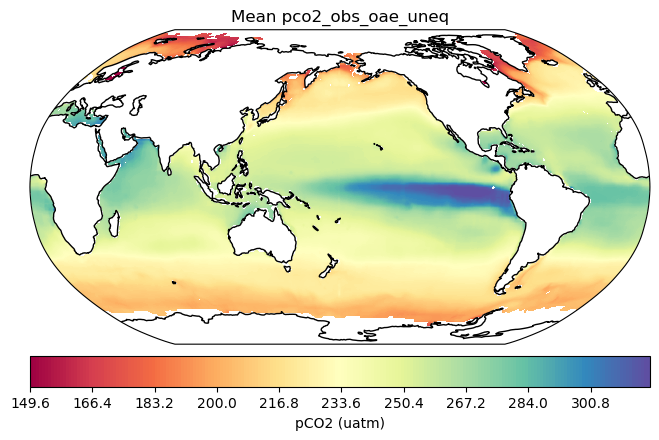

In [115]:
# QA check plot of the mean pCO2 of obs

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = np.reshape(ds_dict_T['pco2_obs_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
Z = np.nanmean(Z,0)
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title(r'Mean pco2_obs_oae_uneq')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
elif vmin<((vmin + vmax) / 2) and ((vmin + vmax) / 2)<vmax:
    vcenter = (vmin + vmax) / 2
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

# plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$pCO2 (uatm)');
plt.colorbar(orientation="horizontal", pad=0.03,label=r'pCO2 (uatm)');

plt.savefig('Mean_pco2_obs_oae_uneq.png', format='png', dpi=300)
plt.show()

In [57]:
# find pCO2_T, pCO2_NT, and pCO2_Tanom

# initialize new output arrays
ds_dict_T["pco2_obs_oae_uneq_check"] = np.full((NX*NY,NT), np.nan)   # check calc of previously calculated pCO2
ds_dict_T["pco2_T_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["pco2_Tanom_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["pco2_NT_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["pco2_mean_oae_uneq"] = np.full((NX*NY), np.nan)

# define the function to find the root in each grid cell i
def find_fass_oae_uneq(i):
    kwargs = {
        'alkalinity': ds_dict_T["talk_obs_oae_uneq"][i,:],
        'dic': ds_dict_T["dic_obs_oae_uneq"][i,:],
        'total_silicate': ds_dict_T["sio3"][i,:],
        'total_phosphate': ds_dict_T["po4"][i,:],
        'temperature': ds_dict_T["temperature"][i,:],
        'salinity': ds_dict_T["salinity"][i,:],
        'total_pressure': 0,
        'opt_pH_scale': 1,  # pH scale (1= total scale)
        'opt_k_carbonic': 10,  # Choice of H2CO3 and HCO3- K1 and K2 (10= Lueker et al 2000)
        'opt_k_bisulfate': 1,  # Choice of HSO4- dissociation constant KSO4 (1= Dickson)
        'opt_total_borate': 1,  # Choice for boron:sal 
        'opt_k_fluoride': 1   # Choice for fluoride
        }
    # nnn = number of non-nan values for each input variable to dic_bio         
    nnn_talk = np.count_nonzero(~np.isnan(kwargs["alkalinity"]))  # number of non-nan
    nnn_dic = np.count_nonzero(~np.isnan(kwargs["dic"]))  # number of non-nan
    nnn_sio3 = np.count_nonzero(~np.isnan(kwargs["total_silicate"]))  # number of non-nan
    nnn_po4 = np.count_nonzero(~np.isnan(kwargs["total_phosphate"]))  # number of non-nan
    nnn_temp = np.count_nonzero(~np.isnan(kwargs["temperature"]))  # number of non-nan
    nnn_sal = np.count_nonzero(~np.isnan(kwargs["salinity"]))  # number of non-nan
    if (nnn_talk==nnn_dic and nnn_talk==nnn_sio3 and 
        nnn_talk==nnn_po4 and nnn_talk==nnn_temp and nnn_talk==nnn_sal and nnn_talk > 0):
        # solve for dic_bio = dic_obs - dic_atm
        result = pco2_fass(**kwargs)
        output = {
            'i': i,
            'result': result
            }
        return output

# parallel processing loop through all grid cells
print('Computing pCO2_T, pCO2_NT, and pCO2_Tanom with OAE, please wait ...')
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_fass_oae_uneq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["pco2_obs_oae_uneq_check"][i,:]= result['result']["pCO2_obs"]
            ds_dict_T["pco2_mean_oae_uneq"][i]= result['result']["pCO2_mean"]
            ds_dict_T["pco2_T_oae_uneq"][i,:]= result['result']["pCO2_T"]
            ds_dict_T["pco2_Tanom_oae_uneq"][i,:]= result['result']["pCO2_Tanom"]
            ds_dict_T["pco2_NT_oae_uneq"][i,:]= result['result']["pCO2_NT"]
            # print("i in loop: ",i) 
print('Done')
toc()

# reshape and transpose
ds_dict["pco2_obs_oae_uneq_check"] = np.reshape(ds_dict_T['pco2_obs_oae_uneq_check'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_T_oae_uneq"] = np.reshape(ds_dict_T['pco2_T_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_Tanom_oae_uneq"] = np.reshape(ds_dict_T['pco2_Tanom_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_NT_oae_uneq"] = np.reshape(ds_dict_T['pco2_NT_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_mean_oae_uneq"] = np.reshape(ds_dict_T['pco2_mean_oae_uneq'],(NX,NY)).transpose(1,0)

Computing pCO2_T, pCO2_NT, and pCO2_Tanom with OAE, please wait ...
Done
Elapsed time: 1904.811536 seconds.



In [58]:
# save or load the interim results in case it is necessary to restart from this step
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_v07.mat', ds_dict)
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat', ds_dict_T)
# ds_dict = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_v07.mat')
# ds_dict_T = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat')

/tmp/ipykernel_36656/383336542.py:11: RuntimeWarning: Mean of empty slice
  Z1 = np.nanmean(Z1,0)
/tmp/ipykernel_36656/383336542.py:12: RuntimeWarning: Mean of empty slice
  Z2 = np.nanmean(Z2,0)


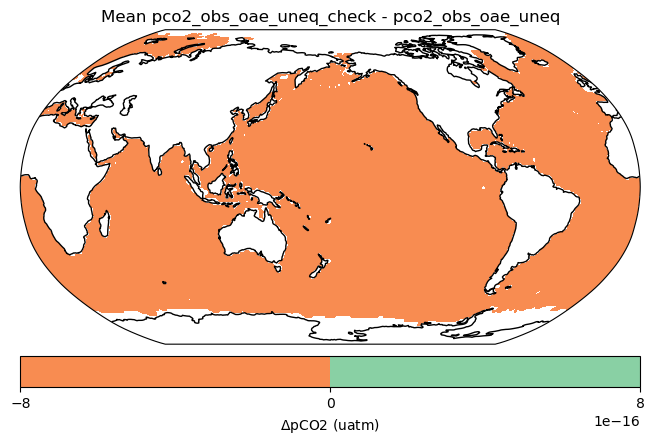

In [16]:
# QA check plot Mean pco2_obs_oae_uneq_check - pco2_obs_oae_uneq (should equal zero)

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])

Z1 = np.reshape(ds_dict_T['pco2_obs_oae_uneq_check'],(NX,NY,NT)).transpose(2,1,0)
Z2 = np.reshape(ds_dict_T['pco2_obs_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
Z1 = np.nanmean(Z1,0)
Z2 = np.nanmean(Z2,0)
Z = Z1 - Z2
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title(r'Mean pco2_obs_oae_uneq_check - pco2_obs_oae_uneq')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
elif vmin<((vmin + vmax) / 2) and ((vmin + vmax) / 2)<vmax:
    vcenter = (vmin + vmax) / 2
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$pCO2 (uatm)');
# plt.colorbar(orientation="horizontal", pad=0.03,label=r'pCO2 (uatm)');

# plt.savefig('Mean pco2_obs_oae_uneq_check - pco2_obs_oae_uneq.png', format='png', dpi=300)
plt.show()

In [62]:
# calculate pCO2_bio and pCO2 for scenario 1 and 2

# calculate pCO2_bio
ds_dict['pco2_bio_oae_uneq'] = ds_dict['pco2_NT_oae_uneq'] - ds_dict["pco2_atm"]

# calculate pCO2_bio anomaly
ds_dict["pco2_bio_average_oae_uneq"] = np.mean(ds_dict["pco2_bio_oae_uneq"], axis=0)
ds_dict["pco2_bio_anom_oae_uneq"] = ds_dict["pco2_bio_oae_uneq"] - ds_dict["pco2_bio_average_oae_uneq"]

# pCO2_bio for scenario half and double pCO2_bio anomaly
ds_dict["pco2_bio_scen1_oae_uneq"] = ds_dict["pco2_bio_average_oae_uneq"] + 0.5 * ds_dict["pco2_bio_anom_oae_uneq"]
ds_dict["pco2_bio_scen2_oae_uneq"] = ds_dict["pco2_bio_average_oae_uneq"] + 2 * ds_dict["pco2_bio_anom_oae_uneq"]

# pCO2 for scenario half and double pCO2_bio anomaly
ds_dict["pco2_scen1_oae_uneq"] = (ds_dict["pco2_T_oae_uneq"] 
                         + ds_dict["pco2_atm"] 
                         + ds_dict["pco2_bio_scen1_oae_uneq"]
                         - ds_dict["pco2_mean_oae_uneq"])
ds_dict["pco2_scen2_oae_uneq"] = (ds_dict["pco2_T_oae_uneq"] 
                         + ds_dict["pco2_atm"] 
                         + ds_dict["pco2_bio_scen2_oae_uneq"] 
                         - ds_dict["pco2_mean_oae_uneq"])

# exclude scenario values with impossibly low pCO2
ds_dict["pco2_scen1_oae_uneq"][ds_dict["pco2_scen1_oae_uneq"]<10] = np.nan
ds_dict["pco2_scen2_oae_uneq"][ds_dict["pco2_scen2_oae_uneq"]<10] = np.nan

# transpose and reshape
ds_dict_T["pco2_scen1_oae_uneq"] = np.transpose(ds_dict['pco2_scen1_oae_uneq'],(2,1,0)).reshape(NX*NY,NT)
ds_dict_T["pco2_scen2_oae_uneq"] = np.transpose(ds_dict['pco2_scen2_oae_uneq'],(2,1,0)).reshape(NX*NY,NT)

In [66]:
# calculate DIC for observed, scenario 1, and scenario 2

# initialize new output arrays
ds_dict_T["dic_obs_oae_uneq_check"] = np.full((NX*NY,NT), np.nan)   # check calc for DIC
ds_dict_T["dic_scen1_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["dic_scen2_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["etamax_obs_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["etamax_scen1_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["etamax_scen2_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["phtot_obs_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["phtot_scen1_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["phtot_scen2_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["omara_obs_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["omara_scen1_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["omara_scen2_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["co3_obs_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["co3_scen1_oae_uneq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["co3_scen2_oae_uneq"] = np.full((NX*NY,NT), np.nan)

# define the function to find dic in each grid cell i
def find_dic_oae_uneq(i):
    if WhichScenario == 'scenario_1':
        pCO2 = ds_dict_T["pco2_scen1_oae_uneq"][i,:]
    elif WhichScenario == 'scenario_2':
        pCO2 = ds_dict_T["pco2_scen2_oae_uneq"][i,:]
    elif WhichScenario == 'observed':
        pCO2 = ds_dict_T["pco2_obs_oae_uneq"][i,:]
    kwargs = dict(
        par1_type = 1,  # The first parameter supplied is of type "1", which means "alkalinity"
        par1 = ds_dict_T["talk_obs_oae_uneq"][i,:],  # value of the first parameter
        par2_type = 4,  # The second parameter 2=DIC, 4=pCO2, 5=fCO2
        par2 = pCO2,  # value of the second parameter
        total_silicate = ds_dict_T["sio3"][i,:],  # Concentration of silicate  in the sample (in umol/kg)
        total_phosphate = ds_dict_T["po4"][i,:],  # Concentration of phosphate in the sample (in umol/kg)
        temperature = ds_dict_T["temperature"][i,:],  # Temperature at input conditions
        salinity = ds_dict_T["salinity"][i,:],  # Salinity of the sample
        pressure = np.zeros((NT)),  # Pressure    at input conditions
        opt_pH_scale = 1,  # Choice of pH scale
        opt_k_carbonic = 10,  # Choice of H2CO3 and HCO3- dissociation constants
        opt_k_bisulfate = 1,  # Choice of HSO4- dissociation constant KSO4
        opt_total_borate = 1,  # Choice of boron:sal
        opt_k_fluoride = 1   # Choice of hydrogen fluoride dissociation constant
        )
    # nnn = number of non-nan values for each input variable to dic_bio         
    nnn_talk = np.count_nonzero(~np.isnan(kwargs["par1"]))  # number of non-nan
    nnn_pco2 = np.count_nonzero(~np.isnan(kwargs["par2"]))  # number of non-nan
    nnn_sio3 = np.count_nonzero(~np.isnan(kwargs["total_silicate"]))  # number of non-nan
    nnn_po4 = np.count_nonzero(~np.isnan(kwargs["total_phosphate"]))  # number of non-nan
    nnn_temp = np.count_nonzero(~np.isnan(kwargs["temperature"]))  # number of non-nan
    nnn_sal = np.count_nonzero(~np.isnan(kwargs["salinity"]))  # number of non-nan
    # print("i in f: ",i) 
    if (nnn_talk==nnn_pco2 and nnn_talk==nnn_sio3 and 
        nnn_talk==nnn_po4 and nnn_talk==nnn_temp and nnn_talk==nnn_sal and nnn_talk > 0):
        # solve for dic
        results = pyco2.sys(**kwargs)
        dic = results['dic']
        output = {
            'i': i,
            'dic': dic
            }       
        return output

print('Computing DIC for observations with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'observed'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_dic_oae_uneq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["dic_obs_oae_uneq_check"][i,:]= result["dic"]
            # print(i,result) 
print('Done')
toc()

print('Computing DIC for scenario 1 with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_1'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_dic_oae_uneq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["dic_scen1_oae_uneq"][i,:]= result["dic"]
            # print(i,result) 
print('Done')
toc()

print('Computing DIC for scenario 2 with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_2'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_dic_oae_uneq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["dic_scen2_oae_uneq"][i,:]= result["dic"]
            # print(i,result) 
print('Done')
toc()

# reshape and transpose outputs into the original ds_dict shapes
# ds_dict["dic_obs_oae_uneq"] = np.reshape(ds_dict_T['dic_obs_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["dic_obs_oae_uneq_check"] = np.reshape(ds_dict_T['dic_obs_oae_uneq_check'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["dic_scen1_oae_uneq"] = np.reshape(ds_dict_T['dic_scen1_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["dic_scen2_oae_uneq"] = np.reshape(ds_dict_T['dic_scen2_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)

Computing DIC for observations with OAE, please wait ...
Done
Elapsed time: 650.595228 seconds.

Computing DIC for scenario 1 with OAE, please wait ...
Done
Elapsed time: 650.520213 seconds.

Computing DIC for scenario 2 with OAE, please wait ...
Done
Elapsed time: 638.914138 seconds.



/tmp/ipykernel_36656/1931814839.py:11: RuntimeWarning: Mean of empty slice
  Z1 = np.nanmean(Z1,0)
/tmp/ipykernel_36656/1931814839.py:12: RuntimeWarning: Mean of empty slice
  Z2 = np.nanmean(Z2,0)


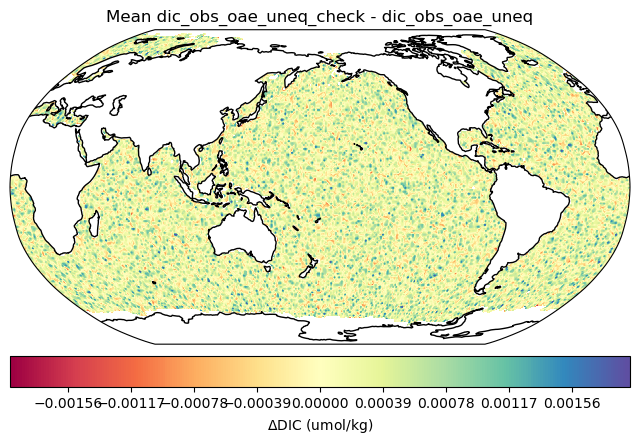

In [20]:
# QA check plot Mean dic_obs_oae_uneq_check - dic_obs_oae_uneq (should be practically zero)

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])

Z1 = np.reshape(ds_dict_T['dic_obs_oae_uneq_check'],(NX,NY,NT)).transpose(2,1,0)
Z2 = np.reshape(ds_dict_T['dic_obs_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
Z1 = np.nanmean(Z1,0)
Z2 = np.nanmean(Z2,0)
Z = Z1 - Z2
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title(r'Mean dic_obs_oae_uneq_check - dic_obs_oae_uneq')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
elif vmin<((vmin + vmax) / 2) and ((vmin + vmax) / 2)<vmax:
    vcenter = (vmin + vmax) / 2
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$DIC (umol/kg)');
# plt.colorbar(orientation="horizontal", pad=0.03,label=r'pCO2 (uatm)');

# plt.savefig('Fig14c_map_of_pCO2_meandiff_obs_vs_obs_oae_v06.png', format='png', dpi=300)
plt.show()

In [14]:
# save or load the interim results in case it is necessary to restart from this step
# scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_v07.mat', ds_dict)
# scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat', ds_dict_T)
# ds_dict = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_v07.mat')
# ds_dict_T = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat')

In [70]:
# find etamax

# define the function to find etamax in each grid cell i
def find_etamax_oae_uneq(i):
    dTA_etamax = 1
    if WhichScenario == 'observed':
        DIC_ctl = ds_dict_T["dic_obs_oae_uneq"][i,:]
    elif WhichScenario == 'scenario_1':
        DIC_ctl = ds_dict_T["dic_scen1_oae_uneq"][i,:]
    elif WhichScenario == 'scenario_2':
        DIC_ctl = ds_dict_T["dic_scen2_oae_uneq"][i,:]
    kwargs = {
        'DIC_ctl': DIC_ctl, 
        'TA_ctl': ds_dict_T["talk_obs_oae_uneq"][i,:], 
        'SiO3_ctl': ds_dict_T["sio3"][i,:], 
        'PO4_ctl': ds_dict_T["po4"][i,:], 
        'Temp_ctl': ds_dict_T["temperature"][i,:], 
        'Sal_ctl': ds_dict_T["salinity"][i,:], 
        'Pres_ctl': np.zeros((NT))
        }
        # nnn = number of non-nan values for each input variable to dic_bio         
    nnn_talk = np.count_nonzero(~np.isnan(kwargs["TA_ctl"]))  # number of non-nan
    nnn_dic = np.count_nonzero(~np.isnan(kwargs["DIC_ctl"]))  # number of non-nan
    nnn_sio3 = np.count_nonzero(~np.isnan(kwargs["SiO3_ctl"]))  # number of non-nan
    nnn_po4 = np.count_nonzero(~np.isnan(kwargs["PO4_ctl"]))  # number of non-nan
    nnn_temp = np.count_nonzero(~np.isnan(kwargs["Temp_ctl"]))  # number of non-nan
    nnn_sal = np.count_nonzero(~np.isnan(kwargs["Sal_ctl"]))  # number of non-nan
    # print("i in f: ",i) 
    if (nnn_talk==nnn_dic and nnn_talk==nnn_sio3 and 
        nnn_talk==nnn_po4 and nnn_talk==nnn_temp and nnn_talk==nnn_sal and nnn_talk > 0):
        # solve for dic_bio = dic_obs - dic_atm
        result = etamax(dTA_etamax, **kwargs)
        output = {
            'i': i,
            'result': result
            }       
        return output

print('Computing etamax for observed conditions with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'observed'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_etamax_oae_uneq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["etamax_obs_oae_uneq"][i,:]= result["result"]["etamax"]
            ds_dict_T["phtot_obs_oae_uneq"][i,:]= result["result"]["pHtotal_ctl"]
            ds_dict_T["omara_obs_oae_uneq"][i,:]= result["result"]["OmegaAra_ctl"]
            ds_dict_T["co3_obs_oae_uneq"][i,:]= result["result"]["CO3_ctl"]
            # print(i,result) 
print('Done')
toc()

print('Computing etamax for scenario 1 with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_1'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_etamax_oae_uneq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["etamax_scen1_oae_uneq"][i,:]= result["result"]["etamax"]
            ds_dict_T["phtot_scen1_oae_uneq"][i,:]= result["result"]["pHtotal_ctl"]
            ds_dict_T["omara_scen1_oae_uneq"][i,:]= result["result"]["OmegaAra_ctl"]
            ds_dict_T["co3_scen1_oae_uneq"][i,:]= result["result"]["CO3_ctl"]
            # print(i,result) 
print('Done')
toc()

print('Computing etamax for scenario 2 with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_2'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_etamax_oae_uneq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["etamax_scen2_oae_uneq"][i,:]= result["result"]["etamax"]
            ds_dict_T["phtot_scen2_oae_uneq"][i,:]= result["result"]["pHtotal_ctl"]
            ds_dict_T["omara_scen2_oae_uneq"][i,:]= result["result"]["OmegaAra_ctl"]
            ds_dict_T["co3_scen2_oae_uneq"][i,:]= result["result"]["CO3_ctl"]
            # print(i,result) 
print('Done')
toc()

# reshape and transpose outputs into the original ds_dict shapes
ds_dict["etamax_obs_oae_uneq"] = np.reshape(ds_dict_T['etamax_obs_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["etamax_scen1_oae_uneq"] = np.reshape(ds_dict_T['etamax_scen1_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["etamax_scen2_oae_uneq"] =np.reshape(ds_dict_T['etamax_scen2_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["phtot_obs_oae_uneq"] = np.reshape(ds_dict_T['phtot_obs_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["phtot_scen1_oae_uneq"] = np.reshape(ds_dict_T['phtot_scen1_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["phtot_scen2_oae_uneq"] = np.reshape(ds_dict_T['phtot_scen2_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["omara_obs_oae_uneq"] = np.reshape(ds_dict_T['omara_obs_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["omara_scen1_oae_uneq"] = np.reshape(ds_dict_T['omara_scen1_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["omara_scen2_oae_uneq"] = np.reshape(ds_dict_T['omara_scen2_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["co3_obs_oae_uneq"] = np.reshape(ds_dict_T['co3_obs_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["co3_scen1_oae_uneq"] = np.reshape(ds_dict_T['co3_scen1_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["co3_scen2_oae_uneq"] = np.reshape(ds_dict_T['co3_scen2_oae_uneq'],(NX,NY,NT)).transpose(2,1,0)

Computing etamax for observed conditions with OAE, please wait ...
Done
Elapsed time: 1372.635049 seconds.

Computing etamax for scenario 1 with OAE, please wait ...
Done
Elapsed time: 1386.735504 seconds.

Computing etamax for scenario 2 with OAE, please wait ...
Done
Elapsed time: 1374.934214 seconds.



In [74]:
# Calculate CO2 fluxes
tic()
# obs
ds_dict["FCO2_obs_oae_uneq"] = CO2_flux(
    ds_dict["pco2_obs_oae_uneq"], 
    ds_dict["pco2_atm"],
    ds_dict["sol"],
    ds_dict['kw'][0,:,:,:],
    ds_dict["ice"]
    )
# scenario 1
ds_dict["FCO2_scen1_oae_uneq"] = CO2_flux(
    ds_dict["pco2_scen1_oae_uneq"], 
    ds_dict["pco2_atm"],
    ds_dict["sol"],
    ds_dict['kw'][0,:,:,:],
    ds_dict["ice"]
    )
# scenario 2
ds_dict["FCO2_scen2_oae_uneq"] = CO2_flux(
    ds_dict["pco2_scen2_oae_uneq"], 
    ds_dict["pco2_atm"],
    ds_dict["sol"],
    ds_dict['kw'][0,:,:,:],
    ds_dict["ice"]
    )
toc()   

Elapsed time: 1.418927 seconds.



In [75]:
# save or load the interim results in case it is necessary to restart from this step
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_v07.mat', ds_dict)
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat', ds_dict_T)
# ds_dict = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_v07.mat')
# ds_dict_T = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat')

# Response to OAE - Equilibrated (constant pCO2)

Next we will evaluate the "equilibrated" observed condtions and each of the two scenarios with perturbation with a hypothetical OAE addition of TA of 100 umol/kg. The "equilibrated" analysis assumes that the pCO2 will be the same for the perturbed observed conditions compared with the unperturbed observed pCO2 in OceanSODA-ETHZ.

In [116]:
# find the TA and pCO2 for equilibrated observed condtions with OAE

# Specify the amount of continuous addition TA for OAE (umol/kg)
dTA_oae = 100
# Calculate the perturbed observed TA and assume the observed DIC with OAE is same as without OAE (unequilibrated)
ds_dict_T["talk_obs_oae_eq"] = ds_dict_T["talk_obs"] + dTA_oae
ds_dict_T["pco2_obs_oae_eq"] = ds_dict_T["pco2_obs"].copy()

# reshape and transpose
ds_dict["talk_obs_oae_eq"] = np.reshape(ds_dict_T["talk_obs_oae_eq"],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_obs_oae_eq"] = np.reshape(ds_dict_T["pco2_obs_oae_eq"],(NX,NY,NT)).transpose(2,1,0)

In [117]:
# find the DIC for equilibrated observed condtions with OAE

# initialize new output array
ds_dict_T["dic_obs_oae_eq"] = np.full((NX*NY,NT), np.nan)

# define the function to find dic in each grid cell i
def find_dic_oae_eq(i):
    kwargs = dict(
        par1_type = 1,  # The first parameter supplied is of type "1", which means "alkalinity"
        par1 = ds_dict_T["talk_obs_oae_eq"][i,:],  # value of the first parameter
        par2_type = 4,  # The second parameter 2=DIC, 4=pCO2, 5=fCO2
        par2 = ds_dict_T["pco2_obs_oae_eq"][i,:],  # value of the second parameter
        total_silicate = ds_dict_T["sio3"][i,:],  # Concentration of silicate  in the sample (in umol/kg)
        total_phosphate = ds_dict_T["po4"][i,:],  # Concentration of phosphate in the sample (in umol/kg)
        temperature = ds_dict_T["temperature"][i,:],  # Temperature at input conditions
        salinity = ds_dict_T["salinity"][i,:],  # Salinity of the sample
        pressure = np.zeros((NT)),  # Pressure    at input conditions
        opt_pH_scale = 1,  # Choice of pH scale
        opt_k_carbonic = 10,  # Choice of H2CO3 and HCO3- dissociation constants
        opt_k_bisulfate = 1,  # Choice of HSO4- dissociation constant KSO4
        opt_total_borate = 1,  # Choice of boron:sal
        opt_k_fluoride = 1   # Choice of hydrogen fluoride dissociation constant
        )
    # nnn = number of non-nan values for each input variable to dic_bio         
    nnn_talk = np.count_nonzero(~np.isnan(kwargs["par1"]))  # number of non-nan
    nnn_par2 = np.count_nonzero(~np.isnan(kwargs["par2"]))  # number of non-nan
    nnn_sio3 = np.count_nonzero(~np.isnan(kwargs["total_silicate"]))  # number of non-nan
    nnn_po4 = np.count_nonzero(~np.isnan(kwargs["total_phosphate"]))  # number of non-nan
    nnn_temp = np.count_nonzero(~np.isnan(kwargs["temperature"]))  # number of non-nan
    nnn_sal = np.count_nonzero(~np.isnan(kwargs["salinity"]))  # number of non-nan
    # print("i in f: ",i) 
    if (nnn_talk==nnn_par2 and nnn_talk==nnn_sio3 and 
        nnn_talk==nnn_po4 and nnn_talk==nnn_temp and nnn_talk==nnn_sal and nnn_talk > 0):
        # solve for dic
        results = pyco2.sys(**kwargs)
        dic = results['dic']
        output = {
            'i': i,
            'dic': dic
            }       
        return output

print('Computing DIC for observations with OAE, please wait ...')
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_dic_oae_eq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["dic_obs_oae_eq"][i,:]= result["dic"]
            # print(i,result) 
print('Done')
toc()

# reshape and transpose
ds_dict["dic_obs_oae_eq"] = np.reshape(ds_dict_T['dic_obs_oae_eq'],(NX,NY,NT)).transpose(2,1,0)

Computing DIC for observations with OAE, please wait ...
Done
Elapsed time: 755.075384 seconds.



/tmp/ipykernel_36656/2362096863.py:9: RuntimeWarning: Mean of empty slice
  Z = np.nanmean(Z,0)


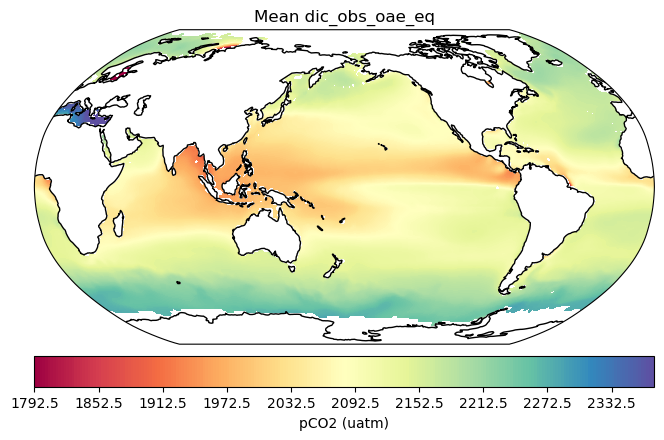

In [118]:
# QA check plot mean DIC of obs

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = np.reshape(ds_dict_T['dic_obs_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
Z = np.nanmean(Z,0)
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title(r'Mean dic_obs_oae_eq')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
elif vmin<((vmin + vmax) / 2) and ((vmin + vmax) / 2)<vmax:
    vcenter = (vmin + vmax) / 2
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

# plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$pCO2 (uatm)');
plt.colorbar(orientation="horizontal", pad=0.03,label=r'pCO2 (uatm)');

plt.savefig('Mean_dic_obs_oae_eq.png', format='png', dpi=300)
plt.show()

In [119]:
# find pCO2_T, pCO2_NT, and pCO2_Tanom

# initialize new output arrays
ds_dict_T["pco2_obs_oae_eq_check"] = np.full((NX*NY,NT), np.nan)   # check calc of previously calculated pCO2
ds_dict_T["pco2_T_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["pco2_Tanom_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["pco2_NT_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["pco2_mean_oae_eq"] = np.full((NX*NY), np.nan)

# define the function to find the root in each grid cell i
def find_fass_oae_eq(i):
    kwargs = {
        'alkalinity': ds_dict_T["talk_obs_oae_eq"][i,:],
        'dic': ds_dict_T["dic_obs_oae_eq"][i,:],
        'total_silicate': ds_dict_T["sio3"][i,:],
        'total_phosphate': ds_dict_T["po4"][i,:],
        'temperature': ds_dict_T["temperature"][i,:],
        'salinity': ds_dict_T["salinity"][i,:],
        'total_pressure': 0,
        'opt_pH_scale': 1,  # pH scale (1= total scale)
        'opt_k_carbonic': 10,  # Choice of H2CO3 and HCO3- K1 and K2 (10= Lueker et al 2000)
        'opt_k_bisulfate': 1,  # Choice of HSO4- dissociation constant KSO4 (1= Dickson)
        'opt_total_borate': 1,  # Choice for boron:sal 
        'opt_k_fluoride': 1   # Choice for fluoride
        }
    # nnn = number of non-nan values for each input variable to dic_bio         
    nnn_talk = np.count_nonzero(~np.isnan(kwargs["alkalinity"]))  # number of non-nan
    nnn_dic = np.count_nonzero(~np.isnan(kwargs["dic"]))  # number of non-nan
    nnn_sio3 = np.count_nonzero(~np.isnan(kwargs["total_silicate"]))  # number of non-nan
    nnn_po4 = np.count_nonzero(~np.isnan(kwargs["total_phosphate"]))  # number of non-nan
    nnn_temp = np.count_nonzero(~np.isnan(kwargs["temperature"]))  # number of non-nan
    nnn_sal = np.count_nonzero(~np.isnan(kwargs["salinity"]))  # number of non-nan
    if (nnn_talk==nnn_dic and nnn_talk==nnn_sio3 and 
        nnn_talk==nnn_po4 and nnn_talk==nnn_temp and nnn_talk==nnn_sal and nnn_talk > 0):
        # solve for dic_bio = dic_obs - dic_atm
        result = pco2_fass(**kwargs)
        output = {
            'i': i,
            'result': result
            }
        return output

# parallel processing loop through all grid cells
print('Computing pCO2_T, pCO2_NT, and pCO2_Tanom with OAE, please wait ...')
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_fass_oae_eq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["pco2_obs_oae_eq_check"][i,:]= result['result']["pCO2_obs"]
            ds_dict_T["pco2_mean_oae_eq"][i]= result['result']["pCO2_mean"]
            ds_dict_T["pco2_T_oae_eq"][i,:]= result['result']["pCO2_T"]
            ds_dict_T["pco2_Tanom_oae_eq"][i,:]= result['result']["pCO2_Tanom"]
            ds_dict_T["pco2_NT_oae_eq"][i,:]= result['result']["pCO2_NT"]
            # print("i in loop: ",i) 
print('Done')
toc()

# reshape and transpose
ds_dict["pco2_obs_oae_eq_check"] = np.reshape(ds_dict_T['pco2_obs_oae_eq_check'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_T_oae_eq"] = np.reshape(ds_dict_T['pco2_T_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_Tanom_oae_eq"] = np.reshape(ds_dict_T['pco2_Tanom_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_NT_oae_eq"] = np.reshape(ds_dict_T['pco2_NT_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["pco2_mean_oae_eq"] = np.reshape(ds_dict_T['pco2_mean_oae_eq'],(NX,NY)).transpose(1,0)

Computing pCO2_T, pCO2_NT, and pCO2_Tanom with OAE, please wait ...
Done
Elapsed time: 2157.061388 seconds.



In [120]:
# save or load the interim results in case it is necessary to restart from this step
tic()
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_v07.mat', ds_dict)
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat', ds_dict_T)
# ds_dict = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_v07.mat')
# ds_dict_T = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat')
toc()

Elapsed time: 230.758127 seconds.



/tmp/ipykernel_36656/831383598.py:12: RuntimeWarning: Mean of empty slice
  Z1 = np.nanmean(Z1,0)
/tmp/ipykernel_36656/831383598.py:13: RuntimeWarning: Mean of empty slice
  Z2 = np.nanmean(Z2,0)


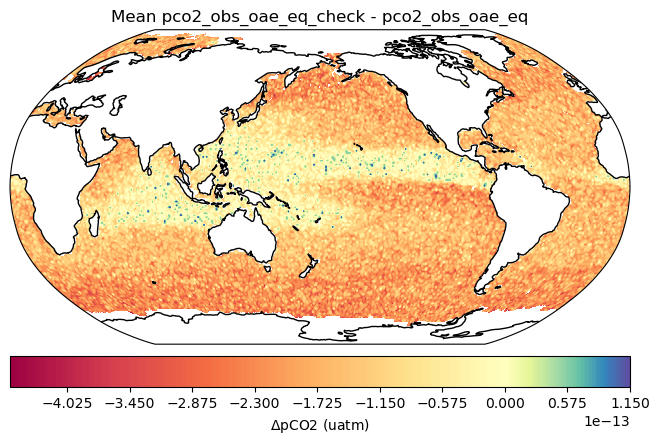

Elapsed time: 190.722207 seconds.



In [121]:
# QA check plot Mean pco2_obs_oae_eq_check - pco2_obs_oae_eq (should be practically zero)

tic()
import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])

Z1 = np.reshape(ds_dict_T['pco2_obs_oae_eq_check'],(NX,NY,NT)).transpose(2,1,0)
Z2 = np.reshape(ds_dict_T['pco2_obs_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
Z1 = np.nanmean(Z1,0)
Z2 = np.nanmean(Z2,0)
Z = Z1 - Z2
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title(r'Mean pco2_obs_oae_eq_check - pco2_obs_oae_eq')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
elif vmin<((vmin + vmax) / 2) and ((vmin + vmax) / 2)<vmax:
    vcenter = (vmin + vmax) / 2
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$pCO2 (uatm)');
# plt.colorbar(orientation="horizontal", pad=0.03,label=r'pCO2 (uatm)');

plt.savefig('Mean pco2_obs_oae_eq_check - pco2_obs_oae_eq.png', format='png', dpi=300)
plt.show()
toc()

In [122]:
# calculate pCO2_bio and pCO2 for scenario 1 and 2

# calculate pCO2_bio
ds_dict['pco2_bio_oae_eq'] = ds_dict['pco2_NT_oae_eq'] - ds_dict["pco2_atm"]

# calculate pCO2_bio anomaly
ds_dict["pco2_bio_average_oae_eq"] = np.mean(ds_dict["pco2_bio_oae_eq"], axis=0)
ds_dict["pco2_bio_anom_oae_eq"] = ds_dict["pco2_bio_oae_eq"] - ds_dict["pco2_bio_average_oae_eq"]

# pCO2_bio for scenario half and double pCO2_bio anomaly
ds_dict["pco2_bio_scen1_oae_eq"] = ds_dict["pco2_bio_average_oae_eq"] + 0.5 * ds_dict["pco2_bio_anom_oae_eq"]
ds_dict["pco2_bio_scen2_oae_eq"] = ds_dict["pco2_bio_average_oae_eq"] + 2 * ds_dict["pco2_bio_anom_oae_eq"]

# pCO2 for scenario half and double pCO2_bio anomaly
ds_dict["pco2_scen1_oae_eq"] = (ds_dict["pco2_T_oae_eq"] 
                         + ds_dict["pco2_atm"] 
                         + ds_dict["pco2_bio_scen1_oae_eq"]
                         - ds_dict["pco2_mean_oae_eq"])
ds_dict["pco2_scen2_oae_eq"] = (ds_dict["pco2_T_oae_eq"] 
                         + ds_dict["pco2_atm"] 
                         + ds_dict["pco2_bio_scen2_oae_eq"] 
                         - ds_dict["pco2_mean_oae_eq"])

# exclude scenario values with impossibly low pCO2
ds_dict["pco2_scen1_oae_eq"][ds_dict["pco2_scen1_oae_eq"]<10] = np.nan
ds_dict["pco2_scen2_oae_eq"][ds_dict["pco2_scen2_oae_eq"]<10] = np.nan

# transpose and reshape
ds_dict_T["pco2_scen1_oae_eq"] = np.transpose(ds_dict['pco2_scen1_oae_eq'],(2,1,0)).reshape(NX*NY,NT)
ds_dict_T["pco2_scen2_oae_eq"] = np.transpose(ds_dict['pco2_scen2_oae_eq'],(2,1,0)).reshape(NX*NY,NT)

In [123]:
# calculate DIC for observed, scenario 1, and scenario 2

# initialize new output arrays
ds_dict_T["dic_obs_oae_eq_check"] = np.full((NX*NY,NT), np.nan)   # check calc for DIC
ds_dict_T["dic_scen1_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["dic_scen2_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["etamax_obs_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["etamax_scen1_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["etamax_scen2_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["phtot_obs_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["phtot_scen1_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["phtot_scen2_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["omara_obs_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["omara_scen1_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["omara_scen2_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["co3_obs_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["co3_scen1_oae_eq"] = np.full((NX*NY,NT), np.nan)
ds_dict_T["co3_scen2_oae_eq"] = np.full((NX*NY,NT), np.nan)

# define the function to find dic in each grid cell i
def find_dic_oae_eq(i):
    if WhichScenario == 'scenario_1':
        pCO2 = ds_dict_T["pco2_scen1_oae_eq"][i,:]
    elif WhichScenario == 'scenario_2':
        pCO2 = ds_dict_T["pco2_scen2_oae_eq"][i,:]
    elif WhichScenario == 'observed':
        pCO2 = ds_dict_T["pco2_obs_oae_eq"][i,:]
    kwargs = dict(
        par1_type = 1,  # The first parameter supplied is of type "1", which means "alkalinity"
        par1 = ds_dict_T["talk_obs_oae_eq"][i,:],  # value of the first parameter
        par2_type = 4,  # The second parameter 2=DIC, 4=pCO2, 5=fCO2
        par2 = pCO2,  # value of the second parameter
        total_silicate = ds_dict_T["sio3"][i,:],  # Concentration of silicate  in the sample (in umol/kg)
        total_phosphate = ds_dict_T["po4"][i,:],  # Concentration of phosphate in the sample (in umol/kg)
        temperature = ds_dict_T["temperature"][i,:],  # Temperature at input conditions
        salinity = ds_dict_T["salinity"][i,:],  # Salinity of the sample
        pressure = np.zeros((NT)),  # Pressure    at input conditions
        opt_pH_scale = 1,  # Choice of pH scale
        opt_k_carbonic = 10,  # Choice of H2CO3 and HCO3- dissociation constants
        opt_k_bisulfate = 1,  # Choice of HSO4- dissociation constant KSO4
        opt_total_borate = 1,  # Choice of boron:sal
        opt_k_fluoride = 1   # Choice of hydrogen fluoride dissociation constant
        )
    # nnn = number of non-nan values for each input variable to dic_bio         
    nnn_talk = np.count_nonzero(~np.isnan(kwargs["par1"]))  # number of non-nan
    nnn_pco2 = np.count_nonzero(~np.isnan(kwargs["par2"]))  # number of non-nan
    nnn_sio3 = np.count_nonzero(~np.isnan(kwargs["total_silicate"]))  # number of non-nan
    nnn_po4 = np.count_nonzero(~np.isnan(kwargs["total_phosphate"]))  # number of non-nan
    nnn_temp = np.count_nonzero(~np.isnan(kwargs["temperature"]))  # number of non-nan
    nnn_sal = np.count_nonzero(~np.isnan(kwargs["salinity"]))  # number of non-nan
    # print("i in f: ",i) 
    if (nnn_talk==nnn_pco2 and nnn_talk==nnn_sio3 and 
        nnn_talk==nnn_po4 and nnn_talk==nnn_temp and nnn_talk==nnn_sal and nnn_talk > 0):
        # solve for dic
        results = pyco2.sys(**kwargs)
        dic = results['dic']
        output = {
            'i': i,
            'dic': dic
            }       
        return output

print('Computing DIC for observations with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'observed'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_dic_oae_eq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["dic_obs_oae_eq_check"][i,:]= result["dic"]
            # print(i,result) 
print('Done')
toc()

print('Computing DIC for scenario 1 with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_1'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_dic_oae_eq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["dic_scen1_oae_eq"][i,:]= result["dic"]
            # print(i,result) 
print('Done')
toc()

print('Computing DIC for scenario 2 with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_2'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_dic_oae_eq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["dic_scen2_oae_eq"][i,:]= result["dic"]
            # print(i,result) 
print('Done')
toc()

# reshape and transpose outputs into the original ds_dict shapes
# ds_dict["dic_obs_oae_eq"] = np.reshape(ds_dict_T['dic_obs_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["dic_obs_oae_eq_check"] = np.reshape(ds_dict_T['dic_obs_oae_eq_check'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["dic_scen1_oae_eq"] = np.reshape(ds_dict_T['dic_scen1_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["dic_scen2_oae_eq"] = np.reshape(ds_dict_T['dic_scen2_oae_eq'],(NX,NY,NT)).transpose(2,1,0)

Computing DIC for observations with OAE, please wait ...
Done
Elapsed time: 774.720211 seconds.

Computing DIC for scenario 1 with OAE, please wait ...
Done
Elapsed time: 757.107648 seconds.

Computing DIC for scenario 2 with OAE, please wait ...
Done
Elapsed time: 773.284852 seconds.



/tmp/ipykernel_36656/2428931247.py:12: RuntimeWarning: Mean of empty slice
  Z1 = np.nanmean(Z1,0)
/tmp/ipykernel_36656/2428931247.py:13: RuntimeWarning: Mean of empty slice
  Z2 = np.nanmean(Z2,0)


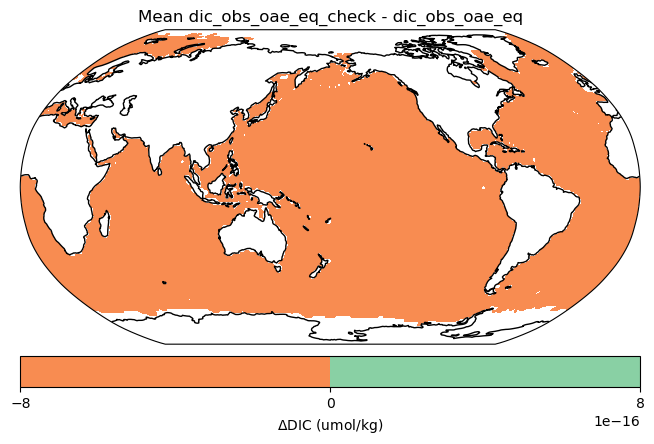

Elapsed time: 0.508660 seconds.



In [124]:
# QA check plot Mean dic_obs_oae_eq_check - dic_obs_oae_eq (should be zero)

tic()
import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])

Z1 = np.reshape(ds_dict_T['dic_obs_oae_eq_check'],(NX,NY,NT)).transpose(2,1,0)
Z2 = np.reshape(ds_dict_T['dic_obs_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
Z1 = np.nanmean(Z1,0)
Z2 = np.nanmean(Z2,0)
Z = Z1 - Z2
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Mean dic_obs_oae_eq_check - dic_obs_oae_eq')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
elif vmin<((vmin + vmax) / 2) and ((vmin + vmax) / 2)<vmax:
    vcenter = (vmin + vmax) / 2
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$DIC (umol/kg)');
# plt.colorbar(orientation="horizontal", pad=0.03,label=r'pCO2 (uatm)');

# plt.savefig('Mean dic_obs_oae_eq_check - dic_obs_oae_eq.png', format='png', dpi=300)
plt.show()
toc()

In [125]:
# save or load the interim results in case it is necessary to restart from this step
tic()
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_v07.mat', ds_dict)
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat', ds_dict_T)
# ds_dict = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_ds_dict_v07.mat')
# ds_dict_T = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat')
toc()

Elapsed time: 345.042024 seconds.



In [126]:
# find etamax

# define the function to find etamax in each grid cell i
def find_etamax_oae_eq(i):
    dTA_etamax = 1
    if WhichScenario == 'observed':
        DIC_ctl = ds_dict_T["dic_obs_oae_eq"][i,:]
    elif WhichScenario == 'scenario_1':
        DIC_ctl = ds_dict_T["dic_scen1_oae_eq"][i,:]
    elif WhichScenario == 'scenario_2':
        DIC_ctl = ds_dict_T["dic_scen2_oae_eq"][i,:]
    kwargs = {
        'DIC_ctl': DIC_ctl, 
        'TA_ctl': ds_dict_T["talk_obs_oae_eq"][i,:], 
        'SiO3_ctl': ds_dict_T["sio3"][i,:], 
        'PO4_ctl': ds_dict_T["po4"][i,:], 
        'Temp_ctl': ds_dict_T["temperature"][i,:], 
        'Sal_ctl': ds_dict_T["salinity"][i,:], 
        'Pres_ctl': np.zeros((NT))
        }
        # nnn = number of non-nan values for each input variable to dic_bio         
    nnn_talk = np.count_nonzero(~np.isnan(kwargs["TA_ctl"]))  # number of non-nan
    nnn_dic = np.count_nonzero(~np.isnan(kwargs["DIC_ctl"]))  # number of non-nan
    nnn_sio3 = np.count_nonzero(~np.isnan(kwargs["SiO3_ctl"]))  # number of non-nan
    nnn_po4 = np.count_nonzero(~np.isnan(kwargs["PO4_ctl"]))  # number of non-nan
    nnn_temp = np.count_nonzero(~np.isnan(kwargs["Temp_ctl"]))  # number of non-nan
    nnn_sal = np.count_nonzero(~np.isnan(kwargs["Sal_ctl"]))  # number of non-nan
    # print("i in f: ",i) 
    if (nnn_talk==nnn_dic and nnn_talk==nnn_sio3 and 
        nnn_talk==nnn_po4 and nnn_talk==nnn_temp and nnn_talk==nnn_sal and nnn_talk > 0):
        # solve for dic_bio = dic_obs - dic_atm
        result = etamax(dTA_etamax, **kwargs)
        output = {
            'i': i,
            'result': result
            }       
        return output

print('Computing etamax for observed conditions with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'observed'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_etamax_oae_eq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["etamax_obs_oae_eq"][i,:]= result["result"]["etamax"]
            ds_dict_T["phtot_obs_oae_eq"][i,:]= result["result"]["pHtotal_ctl"]
            ds_dict_T["omara_obs_oae_eq"][i,:]= result["result"]["OmegaAra_ctl"]
            ds_dict_T["co3_obs_oae_eq"][i,:]= result["result"]["CO3_ctl"]
            # print(i,result) 
print('Done')
toc()

print('Computing etamax for scenario 1 with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_1'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_etamax_oae_eq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["etamax_scen1_oae_eq"][i,:]= result["result"]["etamax"]
            ds_dict_T["phtot_scen1_oae_eq"][i,:]= result["result"]["pHtotal_ctl"]
            ds_dict_T["omara_scen1_oae_eq"][i,:]= result["result"]["OmegaAra_ctl"]
            ds_dict_T["co3_scen1_oae_eq"][i,:]= result["result"]["CO3_ctl"]
            # print(i,result) 
print('Done')
toc()

print('Computing etamax for scenario 2 with OAE, please wait ...')
# specify which scenario DIC is to be used (observed, scenario_1, or scenario_2)
WhichScenario = 'scenario_2'
# parallel processing loop through all grid cells
tic()
ncpu = 6   # number of CPU cores to use for parallel processing
with multiprocessing.Pool(processes=ncpu) as pool:    
    # Use imap_unordered to apply the function to a range of numbers
    results = pool.imap_unordered(find_etamax_oae_eq, range(NX*NY))    
    # Iterate over the results as they become available
    for result in results:
        if result is not None:
            i = int(result['i'])
            ds_dict_T["etamax_scen2_oae_eq"][i,:]= result["result"]["etamax"]
            ds_dict_T["phtot_scen2_oae_eq"][i,:]= result["result"]["pHtotal_ctl"]
            ds_dict_T["omara_scen2_oae_eq"][i,:]= result["result"]["OmegaAra_ctl"]
            ds_dict_T["co3_scen2_oae_eq"][i,:]= result["result"]["CO3_ctl"]
            # print(i,result) 
print('Done')
toc()

# reshape and transpose outputs into the original ds_dict shapes
ds_dict["etamax_obs_oae_eq"] = np.reshape(ds_dict_T['etamax_obs_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["etamax_scen1_oae_eq"] = np.reshape(ds_dict_T['etamax_scen1_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["etamax_scen2_oae_eq"] =np.reshape(ds_dict_T['etamax_scen2_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["phtot_obs_oae_eq"] = np.reshape(ds_dict_T['phtot_obs_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["phtot_scen1_oae_eq"] = np.reshape(ds_dict_T['phtot_scen1_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["phtot_scen2_oae_eq"] = np.reshape(ds_dict_T['phtot_scen2_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["omara_obs_oae_eq"] = np.reshape(ds_dict_T['omara_obs_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["omara_scen1_oae_eq"] = np.reshape(ds_dict_T['omara_scen1_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["omara_scen2_oae_eq"] = np.reshape(ds_dict_T['omara_scen2_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["co3_obs_oae_eq"] = np.reshape(ds_dict_T['co3_obs_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["co3_scen1_oae_eq"] = np.reshape(ds_dict_T['co3_scen1_oae_eq'],(NX,NY,NT)).transpose(2,1,0)
ds_dict["co3_scen2_oae_eq"] = np.reshape(ds_dict_T['co3_scen2_oae_eq'],(NX,NY,NT)).transpose(2,1,0)

Computing etamax for observed conditions with OAE, please wait ...
Done
Elapsed time: 1510.721258 seconds.

Computing etamax for scenario 1 with OAE, please wait ...
Done
Elapsed time: 1510.289733 seconds.

Computing etamax for scenario 2 with OAE, please wait ...
Done
Elapsed time: 1560.601756 seconds.



In [129]:
# Calculate CO2 fluxes
tic()
# obs
ds_dict["FCO2_obs_oae_eq"] = CO2_flux(
    ds_dict["pco2_obs_oae_eq"], 
    ds_dict["pco2_atm"],
    ds_dict["sol"],
    ds_dict['kw'][0,:,:,:],
    ds_dict["ice"]
    )
# scenario 1
ds_dict["FCO2_scen1_oae_eq"] = CO2_flux(
    ds_dict["pco2_scen1_oae_eq"], 
    ds_dict["pco2_atm"],
    ds_dict["sol"],
    ds_dict['kw'][0,:,:,:],
    ds_dict["ice"]
    )
# scenario 2
ds_dict["FCO2_scen2_oae_eq"] = CO2_flux(
    ds_dict["pco2_scen2_oae_eq"], 
    ds_dict["pco2_atm"],
    ds_dict["sol"],
    ds_dict['kw'][0,:,:,:],
    ds_dict["ice"]
    )
toc()   

Elapsed time: 5.197403 seconds.



In [130]:
# save or load the interim results in case it is necessary to restart from this step
tic()
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_v07.mat', ds_dict)
scipy.io.savemat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat', ds_dict_T)
# ds_dict = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_v07.mat')
# ds_dict_T = scipy.io.loadmat('PyOAE_with_pCO2_bio_sensitivity_with_OAE_ds_dict_T_v07.mat')
toc()

Elapsed time: 314.450157 seconds.



# Make time series plot at a selected location

Below are the results of the sensitivity analysis showing the time-series for a selected location near the Columbia River during 1982-2022.

Figures 1, 2, 3, 4, and 5 show the results for CO2 flux between sea and air (positive is flux from sea to air, negative is from air to sea), etamax, CO3^2-, Ωara, and pH. Each figure contains the following panels:

- (a) observed conditions, scenario 1, and scenario 2, including mean +/- stdev
- (b) unequilibrated differences with vs without OAE addition of TA of 100 umol/kg, for observed, scenario 1, and scenario 2, including mean +/- stdev 
- (c) equilibrated differences with vs without OAE addition of TA of 100 umol/kg, for observed, scenario 1, and scenario 2, including mean +/- stdev

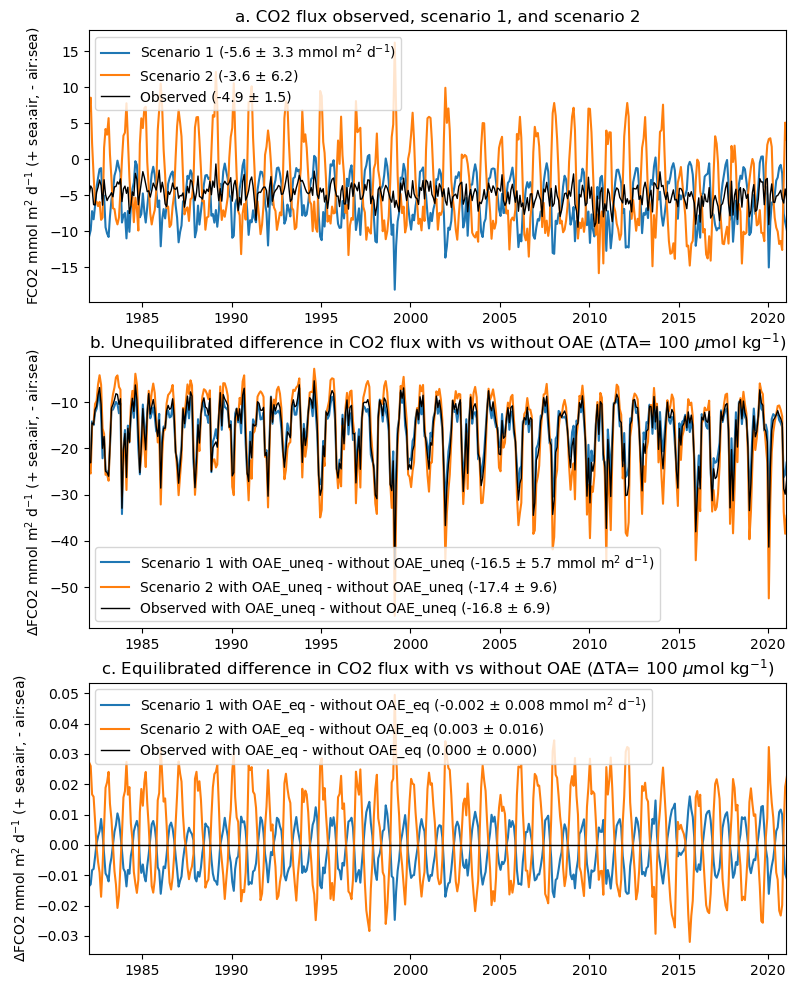

In [151]:
# Figure 1. Sea-air CO2 flux under observed conditions, scenario 1, and scenario 2.
# Columbia River location i,j coordinates
i=234
j=136
fig, ax = plt.subplot_mosaic(
    '''
    A
    B
    C
    ''',
    figsize = (9, 12)
    # constrained_layout = True
)

# Plot at ['A']
label_scen1 = ('Scenario 1 ('
        + f"{np.mean(ds_dict["FCO2_scen1"][:,j,i]):.1f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["FCO2_scen1"][:,j,i]):.1f}" + ' mmol m$^2$ d$^{-1}$)'
        )
label_scen2 = ('Scenario 2 ('
        + f"{np.mean(ds_dict["FCO2_scen2"][:,j,i]):.1f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["FCO2_scen2"][:,j,i]):.1f}" + ')'
        )
label_obs = ('Observed ('
        + f"{np.mean(ds_dict["FCO2_obs"][:,j,i]):.1f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["FCO2_obs"][:,j,i]):.1f}" + ')'
        )
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["FCO2_scen1"][:,j,i], 
             label=label_scen1, linestyle='-')
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["FCO2_scen2"][:,j,i], 
             label=label_scen2, linestyle='-')
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["FCO2_obs"][:,j,i], 
             label=label_obs, color='k', linestyle='-', marker='', linewidth=1)
# ax['A'].set_xlabel('year')
ax['A'].set_ylabel('FCO2 mmol m$^2$ d$^{-1}$ (+ sea:air, - air:sea)')
ax['A'].legend(loc='upper left')
# ax['A'].grid(True)
ax['A'].set_title('a. CO2 flux observed, scenario 1, and scenario 2')
# ax['A'].set_xlim(2010, 2021)
ax['A'].set_xlim(1982, 2021)

# Plot at ['B']
dif_scen1 = ds_dict["FCO2_scen1_oae_uneq"][:,j,i] - ds_dict["FCO2_scen1"][:,j,i]
dif_scen2 = ds_dict["FCO2_scen2_oae_uneq"][:,j,i] - ds_dict["FCO2_scen2"][:,j,i]
dif_obs = ds_dict["FCO2_obs_oae_uneq"][:,j,i] - ds_dict["FCO2_obs"][:,j,i]
label_scen1 = ('Scenario 1 with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_scen1):.1f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.1f}" + ' mmol m$^2$ d$^{-1}$)'
        )
label_scen2 = ('Scenario 2 with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_scen2):.1f}" + ' \u00b1 ' + f"{np.std(dif_scen2):.1f}" + ')'
        )
label_obs = ('Observed with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_obs):.1f}" + ' \u00b1 ' + f"{np.std(dif_obs):.1f}" + ')'
        )
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_scen1, label=label_scen1, linestyle='-')
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_scen2, label=label_scen2, linestyle='-')
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_obs, label=label_obs, 
             linestyle='-', color='k', marker='', linewidth=1)
# ax['B'].set_xlabel('year')
ax['B'].set_ylabel(r'$\Delta$FCO2 mmol m$^2$ d$^{-1}$ (+ sea:air, - air:sea)')
ax['B'].legend(loc='lower left')
# ax['B'].grid(True)
ax['B'].set_title(r'b. Unequilibrated difference in CO2 flux with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')
# ax['B'].set_xlim(2010, 2021)
ax['B'].set_xlim(1982, 2021)
# ax['B'].set_ylim(1850, 2085)
# ax['B'].axhline(y=0, color='k', linestyle=':')

# Plot at ['C']
dif_scen1 = ds_dict["FCO2_scen1_oae_eq"][:,j,i] - ds_dict["FCO2_scen1"][:,j,i]
dif_scen2 = ds_dict["FCO2_scen2_oae_eq"][:,j,i] - ds_dict["FCO2_scen2"][:,j,i]
dif_obs = ds_dict["FCO2_obs_oae_eq"][:,j,i] - ds_dict["FCO2_obs"][:,j,i]
label_scen1 = ('Scenario 1 with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_scen1):.3f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.3f}" + ' mmol m$^2$ d$^{-1}$)'
        )
label_scen2 = ('Scenario 2 with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_scen2):.3f}" + ' \u00b1 ' + f"{np.std(dif_scen2):.3f}" + ')'
        )
label_obs = ('Observed with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_obs):.3f}" + ' \u00b1 ' + f"{np.std(dif_obs):.3f}" + ')'
        )
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_scen1, label=label_scen1, linestyle='-')
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_scen2, label=label_scen2, linestyle='-')
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_obs, label=label_obs, 
             linestyle='-', color='k', marker='', linewidth=1)
# ax['C'].set_xlabel('year')
ax['C'].set_ylabel(r'$\Delta$FCO2 mmol m$^2$ d$^{-1}$ (+ sea:air, - air:sea)')
ax['C'].legend(loc='upper left')
# ax['C'].grid(True)
ax['C'].set_title(r'c. Equilibrated difference in CO2 flux with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')
# ax['C'].set_xlim(2010, 2021)
ax['C'].set_xlim(1982, 2021)
# ax['C'].set_ylim(1850, 2085)
# ax['C'].axhline(y=0, color='k', linestyle=':')

fig.savefig('Fig1_FCO2_at_ColumbiaRiver_1982_2020_v07.png', format='png', dpi=300);

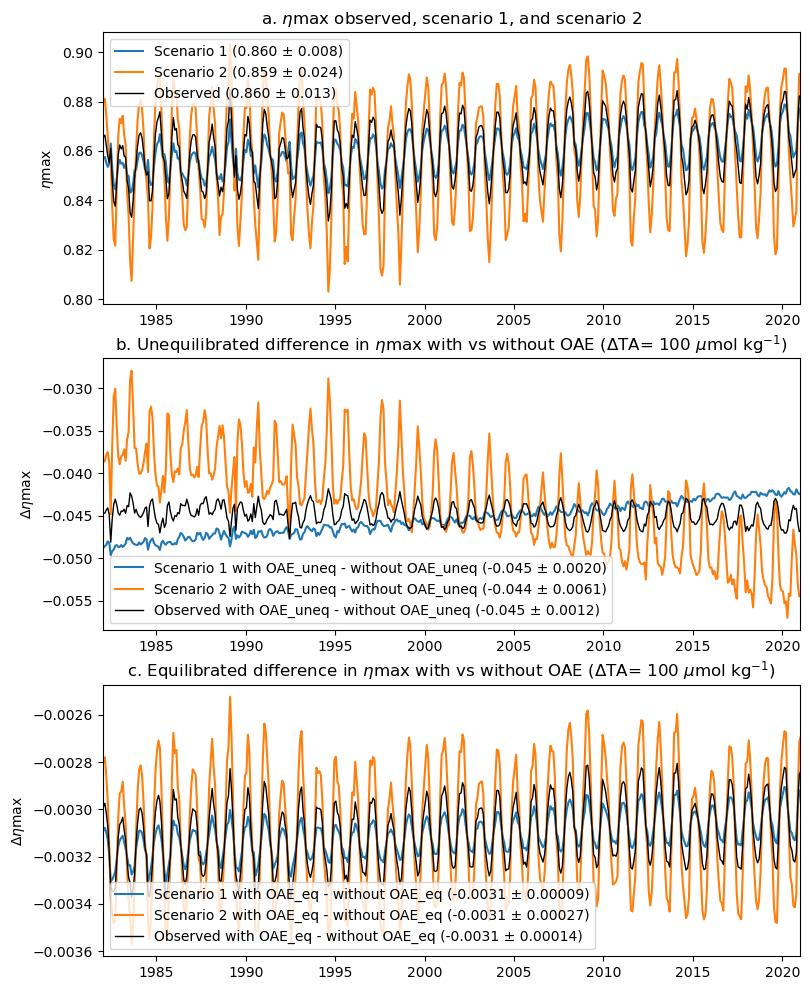

In [152]:
# Figure 2. etamax under observed conditions, scenario 1, and scenario 2.
# Columbia River location i,j coordinates
i=234
j=136
fig, ax = plt.subplot_mosaic(
    '''
    A
    B
    C
    ''',
    figsize = (9, 12)
    # constrained_layout = True
)

# Plot at ['A']
label_scen1 = ('Scenario 1 ('
        + f"{np.mean(ds_dict["etamax_scen1"][:,j,i]):.3f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["etamax_scen1"][:,j,i]):.3f}" + ')'
        )
label_scen2 = ('Scenario 2 ('
        + f"{np.mean(ds_dict["etamax_scen2"][:,j,i]):.3f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["etamax_scen2"][:,j,i]):.3f}" + ')'
        )
label_obs = ('Observed ('
        + f"{np.mean(ds_dict["etamax_obs"][:,j,i]):.3f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["etamax_obs"][:,j,i]):.3f}" + ')'
        )
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["etamax_scen1"][:,j,i], 
             label=label_scen1, linestyle='-')
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["etamax_scen2"][:,j,i], 
             label=label_scen2, linestyle='-')
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["etamax_obs"][:,j,i], 
             label=label_obs, color='k', linestyle='-', marker='', linewidth=1)
# ax['A'].set_xlabel('year')
ax['A'].set_ylabel(r'$\eta$max')
ax['A'].legend(loc='upper left')
# ax['A'].grid(True)
ax['A'].set_title(r'a. $\eta$max observed, scenario 1, and scenario 2')
# ax['A'].set_xlim(2010, 2021)
ax['A'].set_xlim(1982, 2021)

# Plot at ['B']
dif_scen1 = ds_dict["etamax_scen1_oae_uneq"][:,j,i] - ds_dict["etamax_scen1"][:,j,i]
dif_scen2 = ds_dict["etamax_scen2_oae_uneq"][:,j,i] - ds_dict["etamax_scen2"][:,j,i]
dif_obs = ds_dict["etamax_obs_oae_uneq"][:,j,i] - ds_dict["etamax_obs"][:,j,i]
label_scen1 = ('Scenario 1 with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_scen1):.3f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.4f}" + ')'
        )
label_scen2 = ('Scenario 2 with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_scen2):.3f}" + ' \u00b1 ' + f"{np.std(dif_scen2):.4f}" + ')'
        )
label_obs = ('Observed with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_obs):.3f}" + ' \u00b1 ' + f"{np.std(dif_obs):.4f}" + ')'
        )
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_scen1, label=label_scen1, linestyle='-')
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_scen2, label=label_scen2, linestyle='-')
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_obs, label=label_obs, 
             linestyle='-', color='k', marker='', linewidth=1)
# ax['B'].set_xlabel('year')
ax['B'].set_ylabel(r'$\Delta\eta$max')
ax['B'].legend(loc='lower left')
# ax['B'].grid(True)
ax['B'].set_title(r'b. Unequilibrated difference in $\eta$max with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')
# ax['B'].set_xlim(2010, 2021)
ax['B'].set_xlim(1982, 2021)
# ax['B'].set_ylim(1850, 2085)
# ax['B'].axhline(y=0, color='k', linestyle=':')

# Plot at ['C']
dif_scen1 = ds_dict["etamax_scen1_oae_eq"][:,j,i] - ds_dict["etamax_scen1"][:,j,i]
dif_scen2 = ds_dict["etamax_scen2_oae_eq"][:,j,i] - ds_dict["etamax_scen2"][:,j,i]
dif_obs = ds_dict["etamax_obs_oae_eq"][:,j,i] - ds_dict["etamax_obs"][:,j,i]
label_scen1 = ('Scenario 1 with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_scen1):.4f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.5f}" + ')'
        )
label_scen2 = ('Scenario 2 with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_scen2):.4f}" + ' \u00b1 ' + f"{np.std(dif_scen2):.5f}" + ')'
        )
label_obs = ('Observed with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_obs):.4f}" + ' \u00b1 ' + f"{np.std(dif_obs):.5f}" + ')'
        )
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_scen1, label=label_scen1, linestyle='-')
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_scen2, label=label_scen2, linestyle='-')
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_obs, label=label_obs, 
             linestyle='-', color='k', marker='', linewidth=1)
# ax['C'].set_xlabel('year')
ax['C'].set_ylabel(r'$\Delta\eta$max')
ax['C'].legend(loc='lower left')
# ax['C'].grid(True)
ax['C'].set_title(r'c. Equilibrated difference in $\eta$max with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')
# ax['C'].set_xlim(2010, 2021)
ax['C'].set_xlim(1982, 2021)
# ax['C'].set_ylim(1850, 2085)
# ax['C'].axhline(y=0, color='k', linestyle=':')

fig.savefig('Fig2_etamax_at_ColumbiaRiver_1982_2020_v07.png', format='png', dpi=300);

<>:18: SyntaxWarning: invalid escape sequence '\m'
<>:47: SyntaxWarning: invalid escape sequence '\m'
<>:75: SyntaxWarning: invalid escape sequence '\m'
<>:18: SyntaxWarning: invalid escape sequence '\m'
<>:47: SyntaxWarning: invalid escape sequence '\m'
<>:75: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_36656/2576304971.py:18: SyntaxWarning: invalid escape sequence '\m'
  + f"{np.std(ds_dict["co3_scen1"][:,j,i]):.1f}" + ' $\mu$mol kg$^{-1}$)'
/tmp/ipykernel_36656/2576304971.py:47: SyntaxWarning: invalid escape sequence '\m'
  + f"{np.mean(dif_scen1):.1f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.1f}" + ' $\mu$mol kg$^{-1}$)'
/tmp/ipykernel_36656/2576304971.py:75: SyntaxWarning: invalid escape sequence '\m'
  + f"{np.mean(dif_scen1):.1f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.1f}" + ' $\mu$mol kg$^{-1}$)'


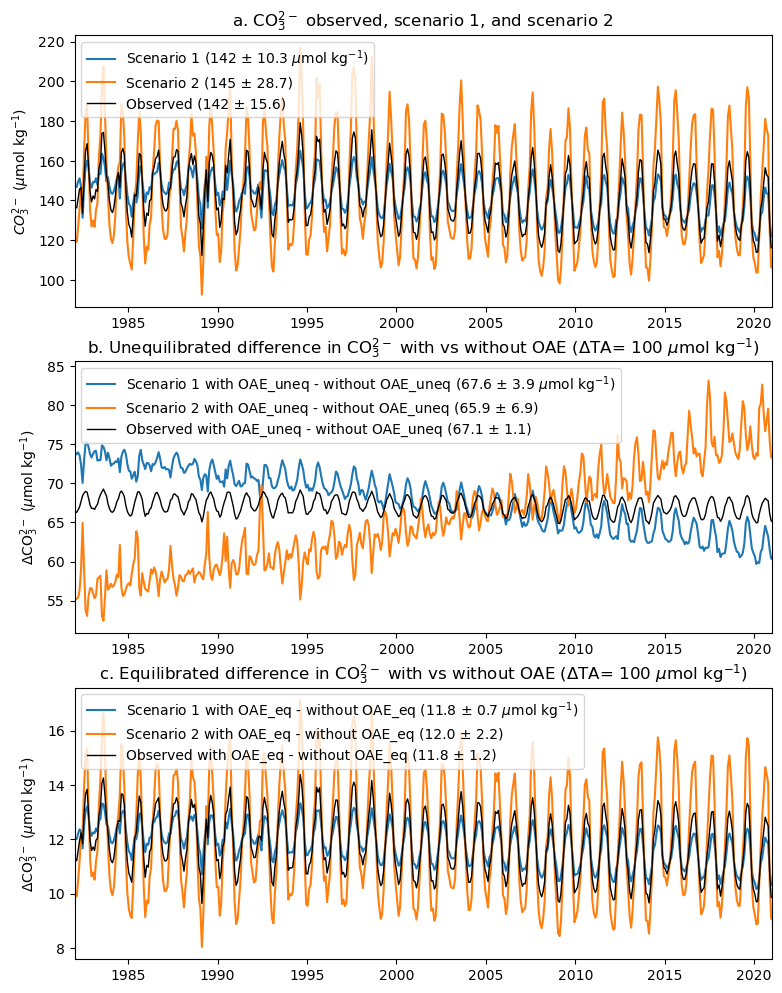

In [153]:
# Figure 3. CO3 under observed conditions, scenario 1, and scenario 2.
# Columbia River location i,j coordinates
i=234
j=136
fig, ax = plt.subplot_mosaic(
    '''
    A
    B
    C
    ''',
    figsize = (9, 12)
    # constrained_layout = True
)

# Plot at ['A']
label_scen1 = ('Scenario 1 ('
        + f"{np.mean(ds_dict["co3_scen1"][:,j,i]):.0f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["co3_scen1"][:,j,i]):.1f}" + ' $\mu$mol kg$^{-1}$)'
        )
label_scen2 = ('Scenario 2 ('
        + f"{np.mean(ds_dict["co3_scen2"][:,j,i]):.0f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["co3_scen2"][:,j,i]):.1f}" + ')'
        )
label_obs = ('Observed ('
        + f"{np.mean(ds_dict["co3_obs"][:,j,i]):.0f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["co3_obs"][:,j,i]):.1f}" + ')'
        )
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["co3_scen1"][:,j,i], 
             label=label_scen1, linestyle='-')
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["co3_scen2"][:,j,i], 
             label=label_scen2, linestyle='-')
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["co3_obs"][:,j,i], 
             label=label_obs, color='k', linestyle='-', marker='', linewidth=1)
# ax['A'].set_xlabel('year')
ax['A'].set_ylabel(r'$CO_3^{2-}$ ($\mu$mol kg$^{-1}$)')
ax['A'].legend(loc='upper left')
# ax['A'].grid(True)
ax['A'].set_title(r'a. CO$_3^{2-}$ observed, scenario 1, and scenario 2')
# ax['A'].set_xlim(2010, 2021)
ax['A'].set_xlim(1982, 2021)

# Plot at ['B']
dif_scen1 = ds_dict["co3_scen1_oae_uneq"][:,j,i] - ds_dict["co3_scen1"][:,j,i]
dif_scen2 = ds_dict["co3_scen2_oae_uneq"][:,j,i] - ds_dict["co3_scen2"][:,j,i]
dif_obs = ds_dict["co3_obs_oae_uneq"][:,j,i] - ds_dict["co3_obs"][:,j,i]
label_scen1 = ('Scenario 1 with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_scen1):.1f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.1f}" + ' $\mu$mol kg$^{-1}$)'
        )
label_scen2 = ('Scenario 2 with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_scen2):.1f}" + ' \u00b1 ' + f"{np.std(dif_scen2):.1f}" + ')'
        )
label_obs = ('Observed with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_obs):.1f}" + ' \u00b1 ' + f"{np.std(dif_obs):.1f}" + ')'
        )
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_scen1, label=label_scen1, linestyle='-')
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_scen2, label=label_scen2, linestyle='-')
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_obs, label=label_obs, 
             linestyle='-', color='k', marker='', linewidth=1)
# ax['B'].set_xlabel('year')
# ax['B'].set_ylabel(r'$\Delta\eta$max')
ax['B'].set_ylabel(r'$\Delta$CO$_3^{2-}$ ($\mu$mol kg$^{-1}$)')
ax['B'].legend(loc='upper left')
# ax['B'].grid(True)
ax['B'].set_title(r'b. Unequilibrated difference in CO$_3^{2-}$ with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')
# ax['B'].set_xlim(2010, 2021)
ax['B'].set_xlim(1982, 2021)
# ax['B'].set_ylim(1850, 2085)
# ax['B'].axhline(y=0, color='k', linestyle=':')

# Plot at ['C']
dif_scen1 = ds_dict["co3_scen1_oae_eq"][:,j,i] - ds_dict["co3_scen1"][:,j,i]
dif_scen2 = ds_dict["co3_scen2_oae_eq"][:,j,i] - ds_dict["co3_scen2"][:,j,i]
dif_obs = ds_dict["co3_obs_oae_eq"][:,j,i] - ds_dict["co3_obs"][:,j,i]
label_scen1 = ('Scenario 1 with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_scen1):.1f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.1f}" + ' $\mu$mol kg$^{-1}$)'
        )
label_scen2 = ('Scenario 2 with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_scen2):.1f}" + ' \u00b1 ' + f"{np.std(dif_scen2):.1f}" + ')'
        )
label_obs = ('Observed with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_obs):.1f}" + ' \u00b1 ' + f"{np.std(dif_obs):.1f}" + ')'
        )
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_scen1, label=label_scen1, linestyle='-')
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_scen2, label=label_scen2, linestyle='-')
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_obs, label=label_obs, 
             linestyle='-', color='k', marker='', linewidth=1)
# ax['C'].set_xlabel('year')
# ax['C'].set_ylabel(r'$\Delta\eta$max')
ax['C'].set_ylabel(r'$\Delta$CO$_3^{2-}$ ($\mu$mol kg$^{-1}$)')
ax['C'].legend(loc='upper left')
# ax['C'].grid(True)
ax['C'].set_title(r'c. Equilibrated difference in CO$_3^{2-}$ with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')
# ax['C'].set_xlim(2010, 2021)
ax['C'].set_xlim(1982, 2021)
# ax['C'].set_ylim(1850, 2085)
# ax['C'].axhline(y=0, color='k', linestyle=':')

fig.savefig('Fig3_CO3_at_ColumbiaRiver_1982_2020_v07.png', format='png', dpi=300);

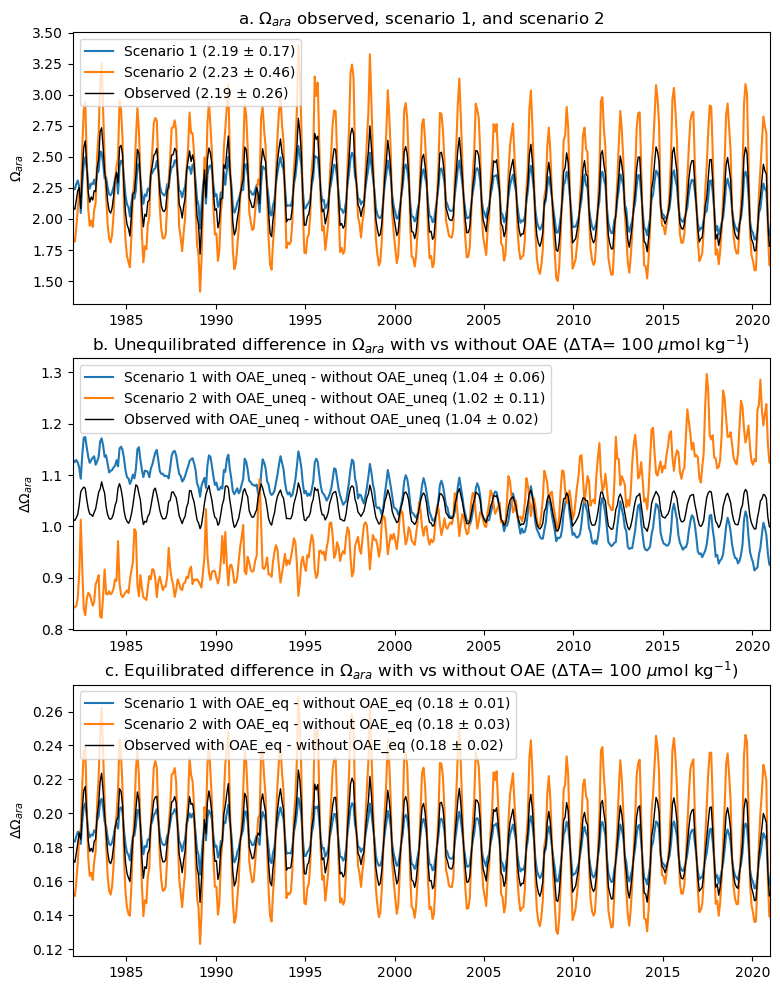

In [154]:
# Figure 4. Omega_ara under observed conditions, scenario 1, and scenario 2.
# Columbia River location i,j coordinates
i=234
j=136
fig, ax = plt.subplot_mosaic(
    '''
    A
    B
    C
    ''',
    figsize = (9, 12)
    # constrained_layout = True
)

# Plot at ['A']
label_scen1 = ('Scenario 1 ('
        + f"{np.mean(ds_dict["omara_scen1"][:,j,i]):.2f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["omara_scen1"][:,j,i]):.2f}" + ')'
        )
label_scen2 = ('Scenario 2 ('
        + f"{np.mean(ds_dict["omara_scen2"][:,j,i]):.2f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["omara_scen2"][:,j,i]):.2f}" + ')'
        )
label_obs = ('Observed ('
        + f"{np.mean(ds_dict["omara_obs"][:,j,i]):.2f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["omara_obs"][:,j,i]):.2f}" + ')'
        )
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["omara_scen1"][:,j,i], 
             label=label_scen1, linestyle='-')
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["omara_scen2"][:,j,i], 
             label=label_scen2, linestyle='-')
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["omara_obs"][:,j,i], 
             label=label_obs, color='k', linestyle='-', marker='', linewidth=1)
# ax['A'].set_xlabel('year')
ax['A'].set_ylabel(r'$\Omega_{ara}$')
ax['A'].legend(loc='upper left')
# ax['A'].grid(True)
ax['A'].set_title(r'a. $\Omega_{ara}$ observed, scenario 1, and scenario 2')
# ax['A'].set_xlim(2010, 2021)
ax['A'].set_xlim(1982, 2021)

# Plot at ['B']
dif_scen1 = ds_dict["omara_scen1_oae_uneq"][:,j,i] - ds_dict["omara_scen1"][:,j,i]
dif_scen2 = ds_dict["omara_scen2_oae_uneq"][:,j,i] - ds_dict["omara_scen2"][:,j,i]
dif_obs = ds_dict["omara_obs_oae_uneq"][:,j,i] - ds_dict["omara_obs"][:,j,i]
label_scen1 = ('Scenario 1 with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_scen1):.2f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.2f}" + ')'
        )
label_scen2 = ('Scenario 2 with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_scen2):.2f}" + ' \u00b1 ' + f"{np.std(dif_scen2):.2f}" + ')'
        )
label_obs = ('Observed with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_obs):.2f}" + ' \u00b1 ' + f"{np.std(dif_obs):.2f}" + ')'
        )
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_scen1, label=label_scen1, linestyle='-')
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_scen2, label=label_scen2, linestyle='-')
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_obs, label=label_obs, 
             linestyle='-', color='k', marker='', linewidth=1)
# ax['B'].set_xlabel('year')
# ax['B'].set_ylabel(r'$\Delta\eta$max')
ax['B'].set_ylabel(r'$\Delta\Omega_{ara}$')
ax['B'].legend(loc='upper left')
# ax['B'].grid(True)
ax['B'].set_title(r'b. Unequilibrated difference in $\Omega_{ara}$ with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')
# ax['B'].set_xlim(2010, 2021)
ax['B'].set_xlim(1982, 2021)
# ax['B'].set_ylim(1850, 2085)
# ax['B'].axhline(y=0, color='k', linestyle=':')

# Plot at ['C']
dif_scen1 = ds_dict["omara_scen1_oae_eq"][:,j,i] - ds_dict["omara_scen1"][:,j,i]
dif_scen2 = ds_dict["omara_scen2_oae_eq"][:,j,i] - ds_dict["omara_scen2"][:,j,i]
dif_obs = ds_dict["omara_obs_oae_eq"][:,j,i] - ds_dict["omara_obs"][:,j,i]
label_scen1 = ('Scenario 1 with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_scen1):.2f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.2f}" + ')'
        )
label_scen2 = ('Scenario 2 with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_scen2):.2f}" + ' \u00b1 ' + f"{np.std(dif_scen2):.2f}" + ')'
        )
label_obs = ('Observed with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_obs):.2f}" + ' \u00b1 ' + f"{np.std(dif_obs):.2f}" + ')'
        )
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_scen1, label=label_scen1, linestyle='-')
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_scen2, label=label_scen2, linestyle='-')
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_obs, label=label_obs, 
             linestyle='-', color='k', marker='', linewidth=1)
# ax['C'].set_xlabel('year')
# ax['C'].set_ylabel(r'$\Delta\eta$max')
ax['C'].set_ylabel(r'$\Delta\Omega_{ara}$')
ax['C'].legend(loc='upper left')
# ax['C'].grid(True)
ax['C'].set_title(r'c. Equilibrated difference in $\Omega_{ara}$ with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')
# ax['C'].set_xlim(2010, 2021)
ax['C'].set_xlim(1982, 2021)
# ax['C'].set_ylim(1850, 2085)
# ax['C'].axhline(y=0, color='k', linestyle=':')

fig.savefig('Fig4_OmegaAra_at_ColumbiaRiver_1982_2020_v07.png', format='png', dpi=300);

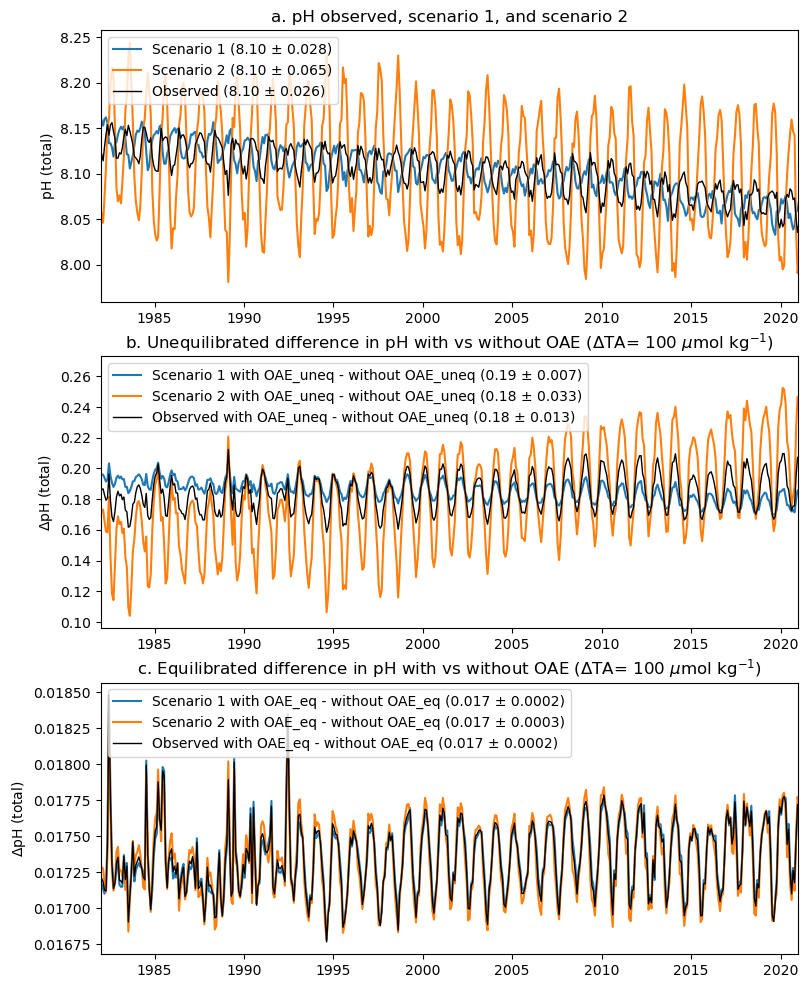

In [155]:
# Figure 5. pH under observed conditions, scenario 1, and scenario 2.
# Columbia River location i,j coordinates
i=234
j=136
fig, ax = plt.subplot_mosaic(
    '''
    A
    B
    C
    ''',
    figsize = (9, 12)
    # constrained_layout = True
)

# Plot at ['A']
label_scen1 = ('Scenario 1 ('
        + f"{np.mean(ds_dict["phtot_scen1"][:,j,i]):.2f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["phtot_scen1"][:,j,i]):.3f}" + ')'
        )
label_scen2 = ('Scenario 2 ('
        + f"{np.mean(ds_dict["phtot_scen2"][:,j,i]):.2f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["phtot_scen2"][:,j,i]):.3f}" + ')'
        )
label_obs = ('Observed ('
        + f"{np.mean(ds_dict["phtot_obs"][:,j,i]):.2f}" + ' \u00b1 ' 
        + f"{np.std(ds_dict["phtot_obs"][:,j,i]):.3f}" + ')'
        )
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["phtot_scen1"][:,j,i], 
             label=label_scen1, linestyle='-')
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["phtot_scen2"][:,j,i], 
             label=label_scen2, linestyle='-')
ax['A'].plot(ds_dict["yearfrac"].flatten(), ds_dict["phtot_obs"][:,j,i], 
             label=label_obs, color='k', linestyle='-', marker='', linewidth=1)
# ax['A'].set_xlabel('year')
ax['A'].set_ylabel('pH (total)')
ax['A'].legend(loc='upper left')
# ax['A'].grid(True)
ax['A'].set_title('a. pH observed, scenario 1, and scenario 2')
# ax['A'].set_xlim(2010, 2021)
ax['A'].set_xlim(1982, 2021)

# Plot at ['B']
dif_scen1 = ds_dict["phtot_scen1_oae_uneq"][:,j,i] - ds_dict["phtot_scen1"][:,j,i]
dif_scen2 = ds_dict["phtot_scen2_oae_uneq"][:,j,i] - ds_dict["phtot_scen2"][:,j,i]
dif_obs = ds_dict["phtot_obs_oae_uneq"][:,j,i] - ds_dict["phtot_obs"][:,j,i]
label_scen1 = ('Scenario 1 with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_scen1):.2f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.3f}" + ')'
        )
label_scen2 = ('Scenario 2 with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_scen2):.2f}" + ' \u00b1 ' + f"{np.std(dif_scen2):.3f}" + ')'
        )
label_obs = ('Observed with OAE_uneq - without OAE_uneq ('
        + f"{np.mean(dif_obs):.2f}" + ' \u00b1 ' + f"{np.std(dif_obs):.3f}" + ')'
        )
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_scen1, label=label_scen1, linestyle='-')
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_scen2, label=label_scen2, linestyle='-')
ax['B'].plot(ds_dict["yearfrac"].flatten(), dif_obs, label=label_obs, 
             linestyle='-', color='k', marker='', linewidth=1)
# ax['B'].set_xlabel('year')
# ax['B'].set_ylabel(r'$\Delta\eta$max')
ax['B'].set_ylabel(r'$\Delta$pH (total)')
ax['B'].legend(loc='upper left')
# ax['B'].grid(True)
ax['B'].set_title(r'b. Unequilibrated difference in pH with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')
# ax['B'].set_xlim(2010, 2021)
ax['B'].set_xlim(1982, 2021)
# ax['B'].set_ylim(1850, 2085)
# ax['B'].axhline(y=0, color='k', linestyle=':')

# Plot at ['C']
dif_scen1 = ds_dict["phtot_scen1_oae_eq"][:,j,i] - ds_dict["phtot_scen1"][:,j,i]
dif_scen2 = ds_dict["phtot_scen2_oae_eq"][:,j,i] - ds_dict["phtot_scen2"][:,j,i]
dif_obs = ds_dict["phtot_obs_oae_eq"][:,j,i] - ds_dict["phtot_obs"][:,j,i]
label_scen1 = ('Scenario 1 with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_scen1):.3f}" + ' \u00b1 ' + f"{np.std(dif_scen1):.4f}" + ')'
        )
label_scen2 = ('Scenario 2 with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_scen2):.3f}" + ' \u00b1 ' + f"{np.std(dif_scen2):.4f}" + ')'
        )
label_obs = ('Observed with OAE_eq - without OAE_eq ('
        + f"{np.mean(dif_obs):.3f}" + ' \u00b1 ' + f"{np.std(dif_obs):.4f}" + ')'
        )
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_scen1, label=label_scen1, linestyle='-')
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_scen2, label=label_scen2, linestyle='-')
ax['C'].plot(ds_dict["yearfrac"].flatten(), dif_obs, label=label_obs, 
             linestyle='-', color='k', marker='', linewidth=1)
# ax['C'].set_xlabel('year')
# ax['C'].set_ylabel(r'$\Delta\eta$max')
ax['C'].set_ylabel(r'$\Delta$pH (total)')
ax['C'].legend(loc='upper left')
# ax['C'].grid(True)
ax['C'].set_title(r'c. Equilibrated difference in pH with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')
# ax['C'].set_xlim(2010, 2021)
ax['C'].set_xlim(1982, 2021)
# ax['C'].set_ylim(1850, 2085)
# ax['C'].axhline(y=0, color='k', linestyle=':')

fig.savefig('Fig5_pHtot_at_ColumbiaRiver_1982_2020_v07.png', format='png', dpi=300);

# Maps of comparing with vs without OAE

## **Maps for CO2 flux**

Maps of the following outputs for sea-air CO2 flux in the global oceans:

- a) Mean of observed conditions without OAE
- b) Standard deviation of observed conditions without OAE
- Unequilibrated mean differences with vs without OAE addition of TA of 100 umol/kg, for the following:
    - c) observed
    - d) scenario 1
    - e) scenario 2
- Equilibrated mean differences with vs without OAE addition of TA of 100 umol/kg, for the following:
    - f) observed
    - g) scenario 1
    - h) scenario 2

In [273]:
# variables to use for stats
var_obs = ds_dict["FCO2_obs"]
var_scen1 = ds_dict["FCO2_scen1"]
var_scen2 = ds_dict["FCO2_scen2"]
var_obs_oae_uneq = ds_dict["FCO2_obs_oae_uneq"]
var_scen1_oae_uneq = ds_dict["FCO2_scen1_oae_uneq"]
var_scen2_oae_uneq = ds_dict["FCO2_scen2_oae_uneq"]
var_obs_oae_eq = ds_dict["FCO2_obs_oae_eq"]
var_scen1_oae_eq = ds_dict["FCO2_scen1_oae_eq"]
var_scen2_oae_eq = ds_dict["FCO2_scen2_oae_eq"]
# without oae
mean_obs = np.nanmean(var_obs,0)   # mean of obs across time dim
std_obs = np.nanstd(var_obs,0)   # std of obs across time dim
mean_scen1 = np.nanmean(var_scen1,0)
mean_scen2 = np.nanmean(var_scen2,0)
# with oae_uneq
mean_obs_oae_uneq = np.nanmean(var_obs_oae_uneq,0)
mean_scen1_oae_uneq = np.nanmean(var_scen1_oae_uneq,0)
mean_scen2_oae_uneq = np.nanmean(var_scen2_oae_uneq,0)
dif_obs_oae_uneq = var_obs_oae_uneq - var_obs
dif_scen1_oae_uneq = var_scen1_oae_uneq - var_scen1
dif_scen2_oae_uneq = var_scen2_oae_uneq - var_scen2
mean_dif_obs_oae_uneq = np.nanmean(dif_obs_oae_uneq,0)
mean_dif_scen1_oae_uneq = np.nanmean(dif_scen1_oae_uneq,0)
mean_dif_scen2_oae_uneq = np.nanmean(dif_scen2_oae_uneq,0)
# with oae_eq
mean_obs_oae_eq = np.nanmean(var_obs_oae_eq,0)
mean_scen1_oae_eq = np.nanmean(var_scen1_oae_eq,0)
mean_scen2_oae_eq = np.nanmean(var_scen2_oae_eq,0)
dif_obs_oae_eq = var_obs_oae_eq - var_obs
dif_scen1_oae_eq = var_scen1_oae_eq - var_scen1
dif_scen2_oae_eq = var_scen2_oae_eq - var_scen2
mean_dif_obs_oae_eq = np.nanmean(dif_obs_oae_eq,0)
mean_dif_scen1_oae_eq = np.nanmean(dif_scen1_oae_eq,0)
mean_dif_scen2_oae_eq = np.nanmean(dif_scen2_oae_eq,0)

/tmp/ipykernel_36656/2114996433.py:12: RuntimeWarning: Mean of empty slice
  mean_obs = np.nanmean(var_obs,0)   # mean of obs across time dim
/home/greg/miniconda3/envs/ipynb/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_36656/2114996433.py:14: RuntimeWarning: Mean of empty slice
  mean_scen1 = np.nanmean(var_scen1,0)
/tmp/ipykernel_36656/2114996433.py:15: RuntimeWarning: Mean of empty slice
  mean_scen2 = np.nanmean(var_scen2,0)
/tmp/ipykernel_36656/2114996433.py:17: RuntimeWarning: Mean of empty slice
  mean_obs_oae_uneq = np.nanmean(var_obs_oae_uneq,0)
/tmp/ipykernel_36656/2114996433.py:18: RuntimeWarning: Mean of empty slice
  mean_scen1_oae_uneq = np.nanmean(var_scen1_oae_uneq,0)
/tmp/ipykernel_36656/2114996433.py:19: RuntimeWarning: Mean of empty slice
  mean_scen2_oae_uneq = np.nanmean(var_scen2_oae_uneq,0)
/tmp/ipykernel_36656/2114

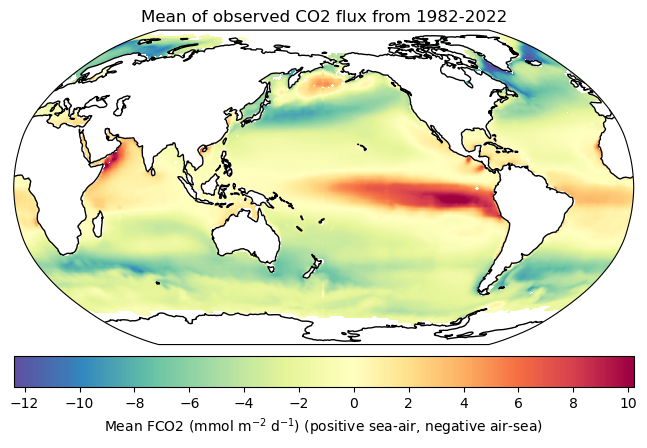

In [302]:
# Figure 6a: mean observed without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_obs
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Mean of observed CO2 flux from 1982-2022')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
    # plt.contourf(X,Y,Z,cmap='turbo',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());
    # plt.contourf(X,Y,Z,cmap='turbo',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'Mean FCO2 (mmol m$^{-2}$ d$^{-1}$) (positive sea-air, negative air-sea)',
             ticks=[-12,-10,-8,-6,-4,-2,0,2,4,6,8,10]);
plt.savefig('Fig6a_map_mean_obs_CO2_flux_without_OAE_v07.png', format='png', dpi=300)
plt.show()

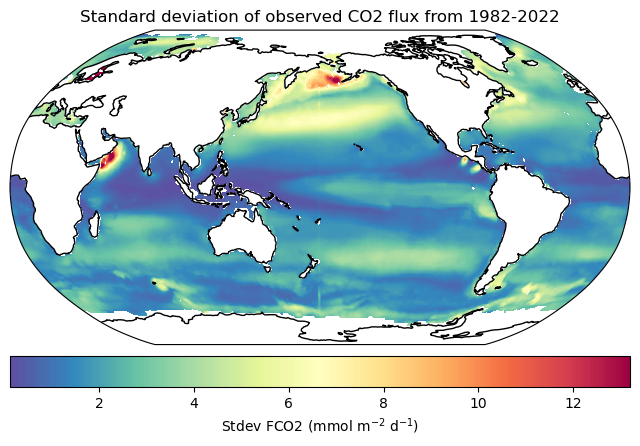

In [301]:
# Figure 6b: stdev observed without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = std_obs
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Standard deviation of observed CO2 flux from 1982-2022')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
    # plt.contourf(X,Y,Z,cmap='turbo',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());
    # plt.contourf(X,Y,Z,cmap='turbo',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'Stdev FCO2 (mmol m$^{-2}$ d$^{-1}$)',
             ticks=[0,2,4,6,8,10,12,14]);
plt.savefig('Fig6b_map_stdev_obs_CO2_flux_without_OAE_v07_turbo.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/2881832443.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Unequilibrated mean difference in 1982-2022 CO2 flux \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


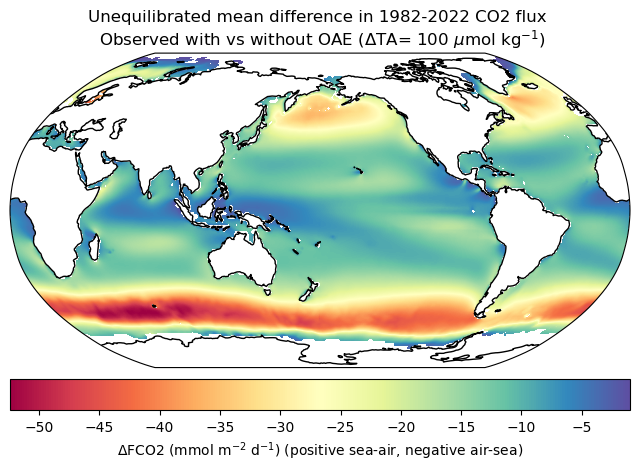

In [300]:
# Figure 6c: Unequilibrated mean differences for observed with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_obs_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 CO2 flux \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$FCO2 (mmol m$^{-2}$ d$^{-1}$) (positive sea-air, negative air-sea)',
             ticks=[-50,-45,-40,-35,-30,-25,-20,-15,-10,-5,0,5]);
plt.savefig('Fig6c_map_uneq_obs_CO2_flux_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/3532747673.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Unequilibrated mean difference in 1982-2022 CO2 flux \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


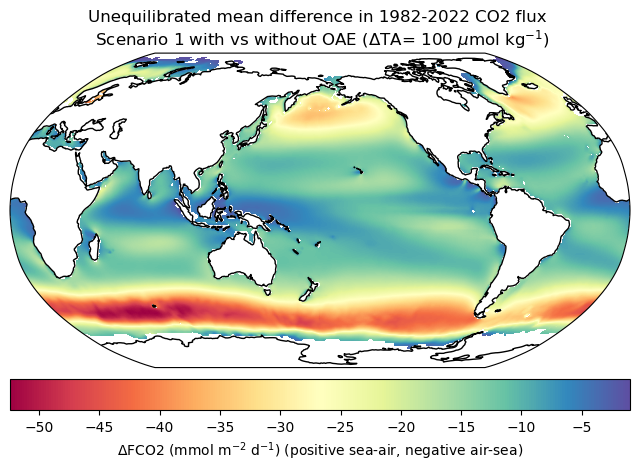

In [299]:
# Figure 6d: Unequilibrated mean differences for Scenario 1 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen1_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 CO2 flux \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$FCO2 (mmol m$^{-2}$ d$^{-1}$) (positive sea-air, negative air-sea)',
             ticks=[-50,-45,-40,-35,-30,-25,-20,-15,-10,-5,0,5]);
plt.savefig('Fig6d_map_uneq_scen1_CO2_flux_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/1145547709.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Unequilibrated mean difference in 1982-2022 CO2 flux \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


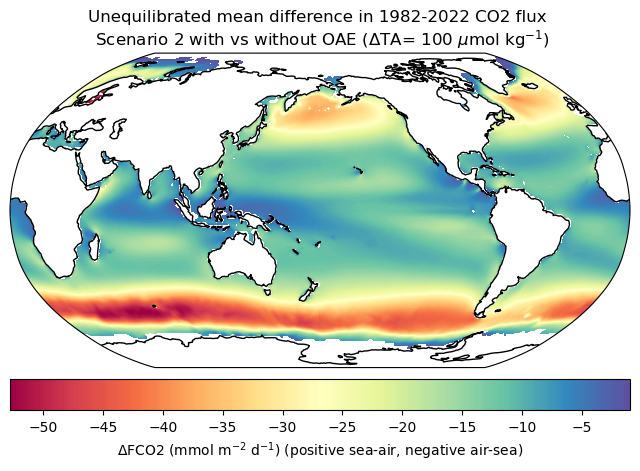

In [298]:
# Figure 6e: Unequilibrated mean differences for scenario 2 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen2_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 CO2 flux \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$FCO2 (mmol m$^{-2}$ d$^{-1}$) (positive sea-air, negative air-sea)',
             ticks=[-50,-45,-40,-35,-30,-25,-20,-15,-10,-5,0,5]);
plt.savefig('Fig6e_map_uneq_scen2_CO2_flux_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/4007447113.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Equilibrated mean difference in 1982-2022 CO2 flux \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


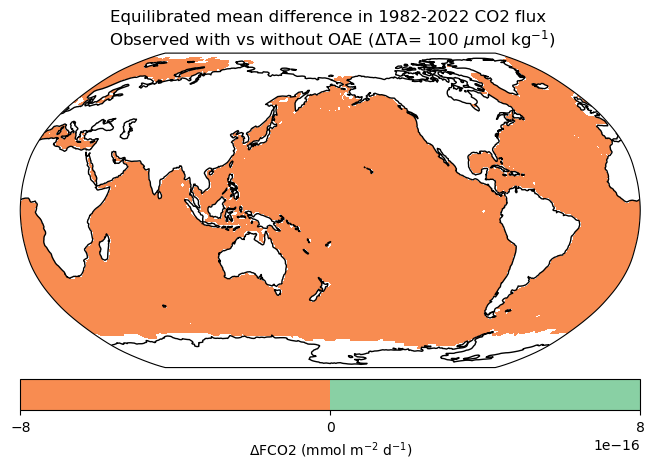

In [297]:
# Figure 6f: Equilibrated mean differences for observed with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_obs_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 CO2 flux \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$FCO2 (mmol m$^{-2}$ d$^{-1}$)',
             );
plt.savefig('Fig6f_map_eq_obs_CO2_flux_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/147234342.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Equilibrated mean difference in 1982-2022 CO2 flux \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


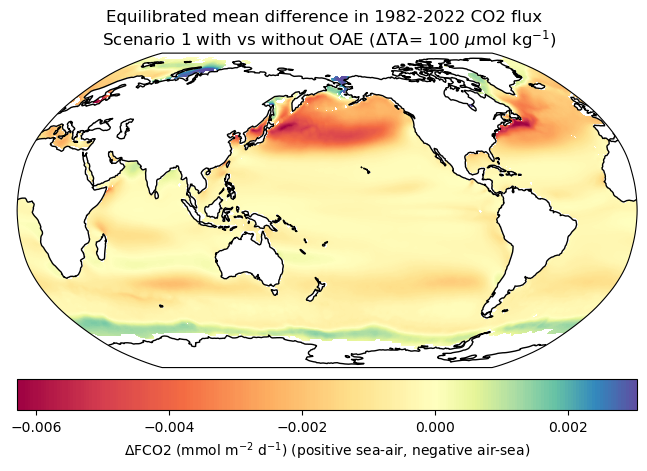

In [296]:
# Figure 6g: Equilibrated mean differences for scenario 1 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen1_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 CO2 flux \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$FCO2 (mmol m$^{-2}$ d$^{-1}$) (positive sea-air, negative air-sea)',
             ticks=[-.006,-.004,-.002,0,.002,.004]);
plt.savefig('Fig6g_map_eq_scen1_CO2_flux_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/436341041.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Equilibrated mean difference in 1982-2022 CO2 flux \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


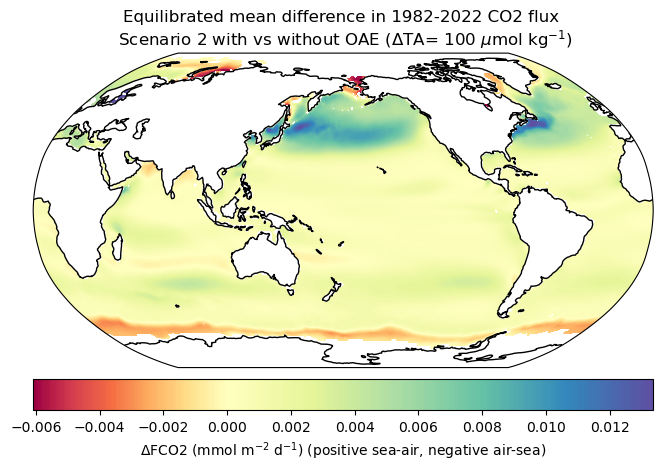

In [295]:
# Figure 6h: Equilibrated mean differences for scenario 2 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen2_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 CO2 flux \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());
    # plt.contourf(X,Y,Z,cmap='turbo_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$FCO2 (mmol m$^{-2}$ d$^{-1}$) (positive sea-air, negative air-sea)',
             ticks=[-.006,-.004,-.002,0,.002,.004,.006,.008,.01,.012]);
plt.savefig('Fig6h_map_eq_scen2_CO2_flux_mean_diff_v07.png', format='png', dpi=300)
plt.show()

## **Maps for ηmax**

Maps of the following outputs for ηmax in the global oceans:

- a) Mean of observed conditions without OAE
- b) Standard deviation of observed conditions without OAE
- Unequilibrated mean differences with vs without OAE addition of TA of 100 umol/kg, for the following:
    - c) observed
    - d) scenario 1
    - e) scenario 2
- Equilibrated mean differences with vs without OAE addition of TA of 100 umol/kg, for the following:
    - f) observed
    - g) scenario 1
    - h) scenario 2

In [269]:
# variables to use for stats
var_obs = ds_dict["etamax_obs"]
var_scen1 = ds_dict["etamax_scen1"]
var_scen2 = ds_dict["etamax_scen2"]
var_obs_oae_uneq = ds_dict["etamax_obs_oae_uneq"]
var_scen1_oae_uneq = ds_dict["etamax_scen1_oae_uneq"]
var_scen2_oae_uneq = ds_dict["etamax_scen2_oae_uneq"]
var_obs_oae_eq = ds_dict["etamax_obs_oae_eq"]
var_scen1_oae_eq = ds_dict["etamax_scen1_oae_eq"]
var_scen2_oae_eq = ds_dict["etamax_scen2_oae_eq"]
# without oae
mean_obs = np.nanmean(var_obs,0)   # mean of obs across time dim
std_obs = np.nanstd(var_obs,0)   # std of obs across time dim
mean_scen1 = np.nanmean(var_scen1,0)
mean_scen2 = np.nanmean(var_scen2,0)
# with oae_uneq
mean_obs_oae_uneq = np.nanmean(var_obs_oae_uneq,0)
mean_scen1_oae_uneq = np.nanmean(var_scen1_oae_uneq,0)
mean_scen2_oae_uneq = np.nanmean(var_scen2_oae_uneq,0)
dif_obs_oae_uneq = var_obs_oae_uneq - var_obs
dif_scen1_oae_uneq = var_scen1_oae_uneq - var_scen1
dif_scen2_oae_uneq = var_scen2_oae_uneq - var_scen2
mean_dif_obs_oae_uneq = np.nanmean(dif_obs_oae_uneq,0)
mean_dif_scen1_oae_uneq = np.nanmean(dif_scen1_oae_uneq,0)
mean_dif_scen2_oae_uneq = np.nanmean(dif_scen2_oae_uneq,0)
# with oae_eq
mean_obs_oae_eq = np.nanmean(var_obs_oae_eq,0)
mean_scen1_oae_eq = np.nanmean(var_scen1_oae_eq,0)
mean_scen2_oae_eq = np.nanmean(var_scen2_oae_eq,0)
dif_obs_oae_eq = var_obs_oae_eq - var_obs
dif_scen1_oae_eq = var_scen1_oae_eq - var_scen1
dif_scen2_oae_eq = var_scen2_oae_eq - var_scen2
mean_dif_obs_oae_eq = np.nanmean(dif_obs_oae_eq,0)
mean_dif_scen1_oae_eq = np.nanmean(dif_scen1_oae_eq,0)
mean_dif_scen2_oae_eq = np.nanmean(dif_scen2_oae_eq,0)

/tmp/ipykernel_36656/3855860494.py:12: RuntimeWarning: Mean of empty slice
  mean_obs = np.nanmean(var_obs,0)   # mean of obs across time dim
/home/greg/miniconda3/envs/ipynb/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_36656/3855860494.py:14: RuntimeWarning: Mean of empty slice
  mean_scen1 = np.nanmean(var_scen1,0)
/tmp/ipykernel_36656/3855860494.py:15: RuntimeWarning: Mean of empty slice
  mean_scen2 = np.nanmean(var_scen2,0)
/tmp/ipykernel_36656/3855860494.py:17: RuntimeWarning: Mean of empty slice
  mean_obs_oae_uneq = np.nanmean(var_obs_oae_uneq,0)
/tmp/ipykernel_36656/3855860494.py:18: RuntimeWarning: Mean of empty slice
  mean_scen1_oae_uneq = np.nanmean(var_scen1_oae_uneq,0)
/tmp/ipykernel_36656/3855860494.py:19: RuntimeWarning: Mean of empty slice
  mean_scen2_oae_uneq = np.nanmean(var_scen2_oae_uneq,0)
/tmp/ipykernel_36656/3855

<>:16: SyntaxWarning: invalid escape sequence '\e'
<>:16: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipykernel_36656/2648189653.py:16: SyntaxWarning: invalid escape sequence '\e'
  plt.title('Mean of observed $\eta$max from 1982-2022')


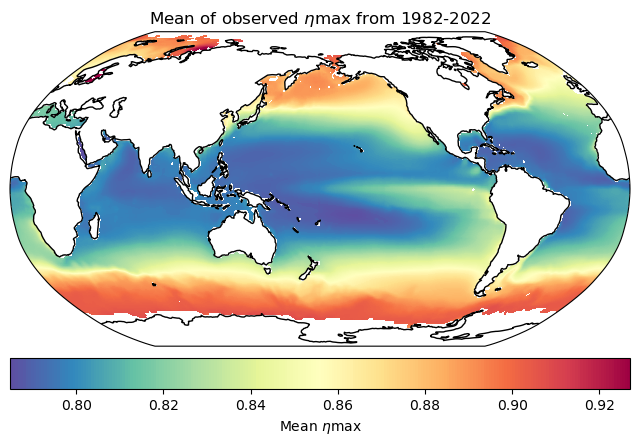

In [234]:
# Figure 7a: mean observed without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_obs
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Mean of observed $\eta$max from 1982-2022')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'Mean $\eta$max',
             ticks=[.78,.8,.82,.84,.86,.88,.9,.92,.94,.96]);
plt.savefig('Fig7a_map_mean_obs_etamax_without_OAE_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\e'
<>:16: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipykernel_36656/1536888049.py:16: SyntaxWarning: invalid escape sequence '\e'
  plt.title('Standard deviation of observed $\eta$max from 1982-2022')


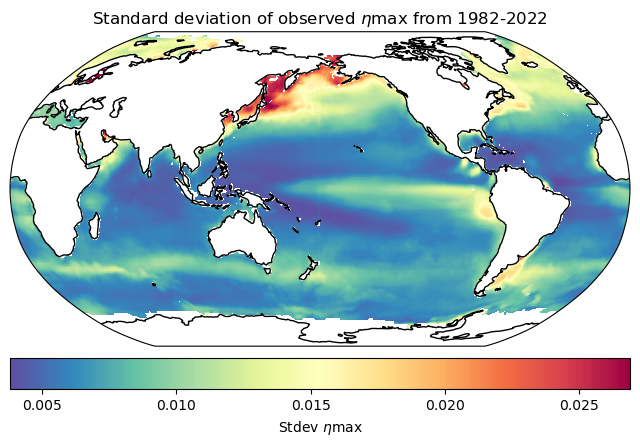

In [235]:
# Figure 7b: stdev bserved without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = std_obs
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Standard deviation of observed $\eta$max from 1982-2022')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'Stdev $\eta$max',
             ticks=[.005,.01,.015,.02,.025]);
plt.savefig('Fig7b_map_stdev_obs_etamax_without_OAE_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\e'
<>:16: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipykernel_36656/1709869824.py:16: SyntaxWarning: invalid escape sequence '\e'
  plt.title('Unequilibrated mean difference in 1982-2022 $\eta$max \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


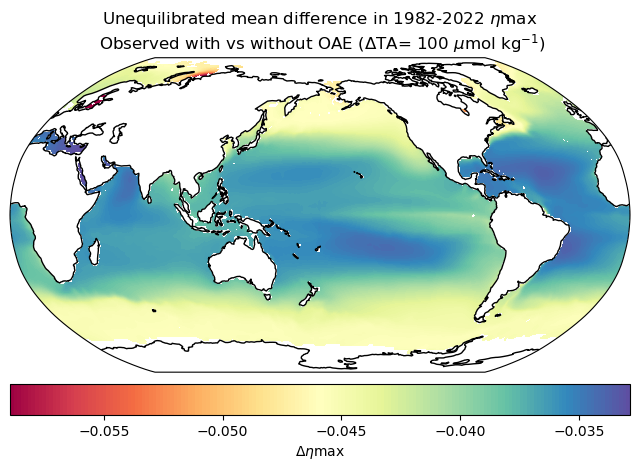

In [240]:
# Figure 7c: Unequilibrated mean differences for observed with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_obs_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 $\eta$max \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\eta$max',
             ticks=[-.06,-.055,-0.05,-.045,-.04,-.035,-.03]);
plt.savefig('Fig7c_map_uneq_obs_etamax_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\e'
<>:16: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipykernel_36656/2379515827.py:16: SyntaxWarning: invalid escape sequence '\e'
  plt.title('Unequilibrated mean difference in 1982-2022 $\eta$max \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


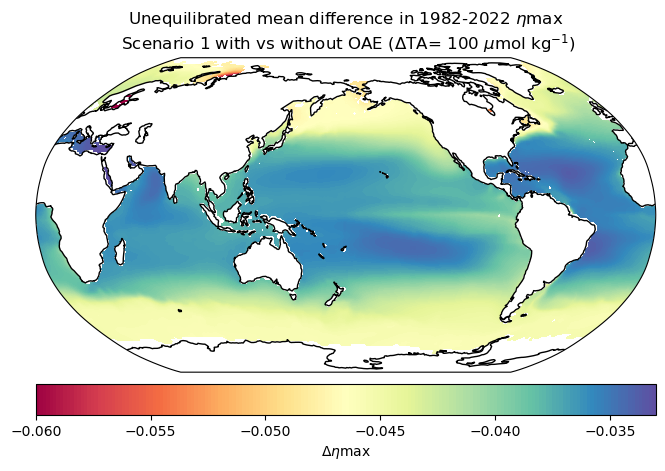

In [241]:
# Figure 7d: Unequilibrated mean differences for scen1 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen1_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 $\eta$max \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\eta$max',
             ticks=[-.06,-.055,-0.05,-.045,-.04,-.035,-.03]);
plt.savefig('Fig7d_map_uneq_scen1_etamax_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\e'
<>:16: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipykernel_36656/3590194900.py:16: SyntaxWarning: invalid escape sequence '\e'
  plt.title('Unequilibrated mean difference in 1982-2022 $\eta$max \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


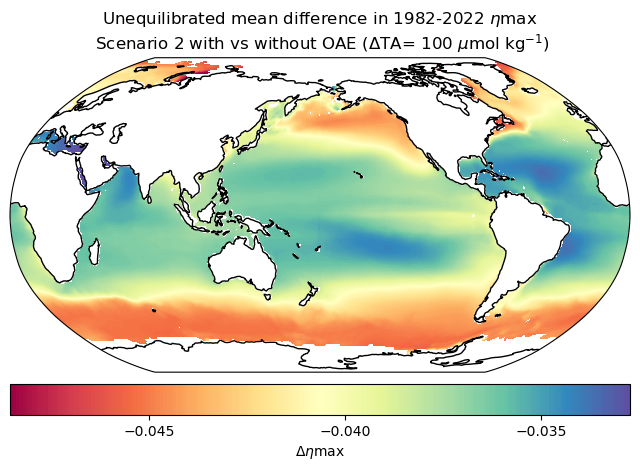

In [242]:
# Figure 7e: Unequilibrated mean differences for scen2 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen2_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 $\eta$max \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\eta$max',
             ticks=[-.06,-.055,-0.05,-.045,-.04,-.035,-.03]);
plt.savefig('Fig7e_map_uneq_scen2_etamax_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\e'
<>:16: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipykernel_36656/822741551.py:16: SyntaxWarning: invalid escape sequence '\e'
  plt.title('Equilibrated mean difference in 1982-2022 $\eta$max \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


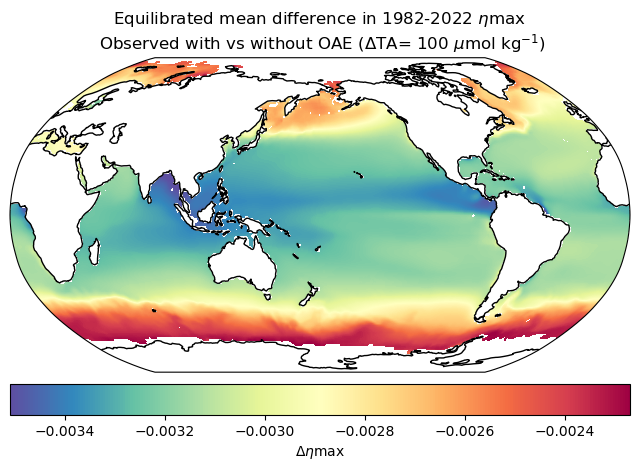

In [270]:
# Figure 7f: Equilibrated mean differences for observed with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_obs_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 $\eta$max \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\eta$max',
             ticks=[-.0036,-.0034,-.0032,-.003,-0.0028,-.0026,-0.0024,-.0022]);
plt.savefig('Fig7f_map_eq_obs_etamax_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\e'
<>:16: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipykernel_36656/403922001.py:16: SyntaxWarning: invalid escape sequence '\e'
  plt.title('Equilibrated mean difference in 1982-2022 $\eta$max \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


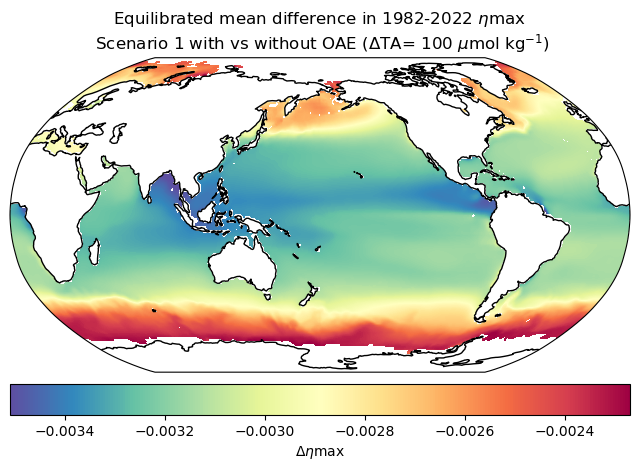

In [271]:
# Figure 7g: Equilibrated mean differences for scen1 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen1_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 $\eta$max \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\eta$max',
             ticks=[-.0036,-.0034,-.0032,-.003,-0.0028,-.0026,-0.0024,-.0022]);
plt.savefig('Fig7g_map_eq_scen1_etamax_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\e'
<>:16: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipykernel_36656/3103760163.py:16: SyntaxWarning: invalid escape sequence '\e'
  plt.title('Equilibrated mean difference in 1982-2022 $\eta$max \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


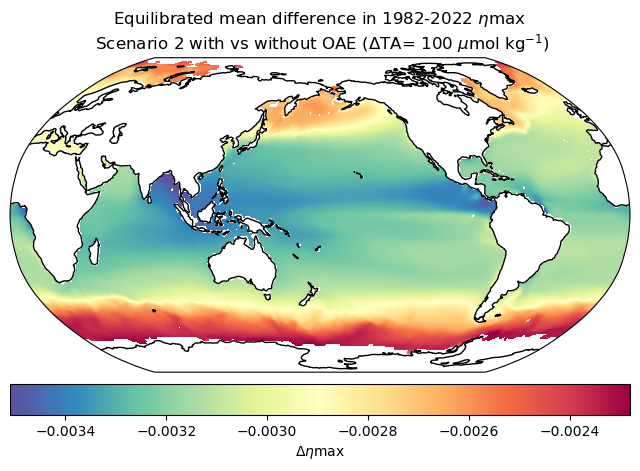

In [272]:
# Figure 7h: Equilibrated mean differences for scen2 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen2_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 $\eta$max \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\eta$max',
             ticks=[-.0036,-.0034,-.0032,-.003,-0.0028,-.0026,-0.0024,-.0022]);
plt.savefig('Fig7h_map_eq_scen2_etamax_mean_diff_v07.png', format='png', dpi=300)
plt.show()

## **Maps for CO3^2-**

Maps of the following outputs for CO3^2- in the global oceans:

- a) Mean of observed conditions without OAE
- b) Standard deviation of observed conditions without OAE
- Unequilibrated mean differences with vs without OAE addition of TA of 100 umol/kg, for the following:
    - c) observed
    - d) scenario 1
    - e) scenario 2
- Equilibrated mean differences with vs without OAE addition of TA of 100 umol/kg, for the following:
    - f) observed
    - g) scenario 1
    - h) scenario 2

In [250]:
# variables to use for stats
var_obs = ds_dict["co3_obs"]
var_scen1 = ds_dict["co3_scen1"]
var_scen2 = ds_dict["co3_scen2"]
var_obs_oae_uneq = ds_dict["co3_obs_oae_uneq"]
var_scen1_oae_uneq = ds_dict["co3_scen1_oae_uneq"]
var_scen2_oae_uneq = ds_dict["co3_scen2_oae_uneq"]
var_obs_oae_eq = ds_dict["co3_obs_oae_eq"]
var_scen1_oae_eq = ds_dict["co3_scen1_oae_eq"]
var_scen2_oae_eq = ds_dict["co3_scen2_oae_eq"]
# without oae
mean_obs = np.nanmean(var_obs,0)   # mean of obs across time dim
std_obs = np.nanstd(var_obs,0)   # std of obs across time dim
mean_scen1 = np.nanmean(var_scen1,0)
mean_scen2 = np.nanmean(var_scen2,0)
# with oae_uneq
mean_obs_oae_uneq = np.nanmean(var_obs_oae_uneq,0)
mean_scen1_oae_uneq = np.nanmean(var_scen1_oae_uneq,0)
mean_scen2_oae_uneq = np.nanmean(var_scen2_oae_uneq,0)
dif_obs_oae_uneq = var_obs_oae_uneq - var_obs
dif_scen1_oae_uneq = var_scen1_oae_uneq - var_scen1
dif_scen2_oae_uneq = var_scen2_oae_uneq - var_scen2
mean_dif_obs_oae_uneq = np.nanmean(dif_obs_oae_uneq,0)
mean_dif_scen1_oae_uneq = np.nanmean(dif_scen1_oae_uneq,0)
mean_dif_scen2_oae_uneq = np.nanmean(dif_scen2_oae_uneq,0)
# with oae_eq
mean_obs_oae_eq = np.nanmean(var_obs_oae_eq,0)
mean_scen1_oae_eq = np.nanmean(var_scen1_oae_eq,0)
mean_scen2_oae_eq = np.nanmean(var_scen2_oae_eq,0)
dif_obs_oae_eq = var_obs_oae_eq - var_obs
dif_scen1_oae_eq = var_scen1_oae_eq - var_scen1
dif_scen2_oae_eq = var_scen2_oae_eq - var_scen2
mean_dif_obs_oae_eq = np.nanmean(dif_obs_oae_eq,0)
mean_dif_scen1_oae_eq = np.nanmean(dif_scen1_oae_eq,0)
mean_dif_scen2_oae_eq = np.nanmean(dif_scen2_oae_eq,0)

/tmp/ipykernel_36656/2129204594.py:12: RuntimeWarning: Mean of empty slice
  mean_obs = np.nanmean(var_obs,0)   # mean of obs across time dim
/home/greg/miniconda3/envs/ipynb/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_36656/2129204594.py:14: RuntimeWarning: Mean of empty slice
  mean_scen1 = np.nanmean(var_scen1,0)
/tmp/ipykernel_36656/2129204594.py:15: RuntimeWarning: Mean of empty slice
  mean_scen2 = np.nanmean(var_scen2,0)
/tmp/ipykernel_36656/2129204594.py:17: RuntimeWarning: Mean of empty slice
  mean_obs_oae_uneq = np.nanmean(var_obs_oae_uneq,0)
/tmp/ipykernel_36656/2129204594.py:18: RuntimeWarning: Mean of empty slice
  mean_scen1_oae_uneq = np.nanmean(var_scen1_oae_uneq,0)
/tmp/ipykernel_36656/2129204594.py:19: RuntimeWarning: Mean of empty slice
  mean_scen2_oae_uneq = np.nanmean(var_scen2_oae_uneq,0)
/tmp/ipykernel_36656/2129

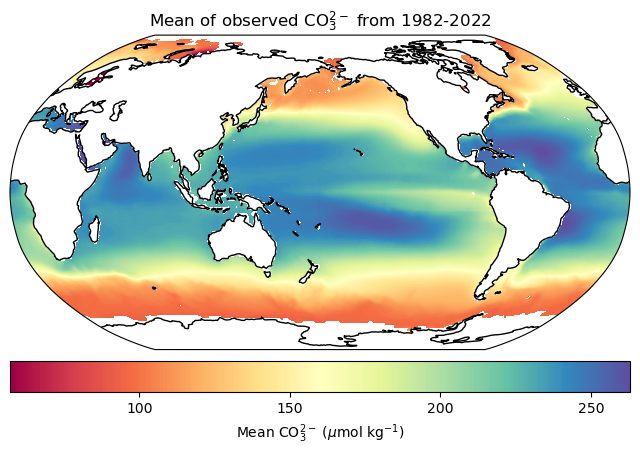

In [257]:
# Figure 8a: mean observed without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_obs
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Mean of observed CO$_3^{2-}$ from 1982-2022')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'Mean CO$_3^{2-}$ ($\mu$mol kg$^{-1}$)',
             ticks=[50,100,150,200,250]);
plt.savefig('Fig8a_map_mean_obs_co3_without_OAE_v07.png', format='png', dpi=300)
plt.show()

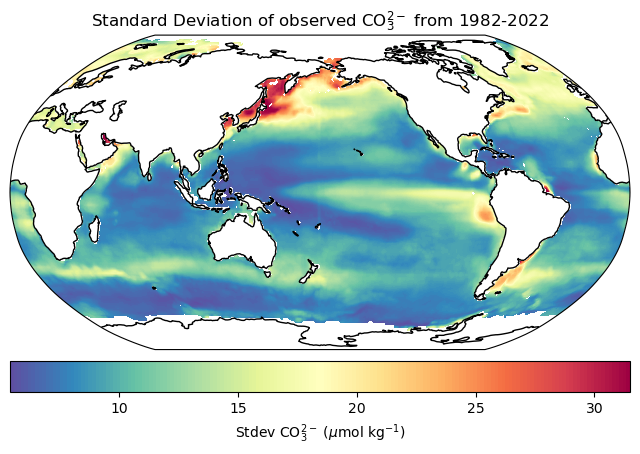

In [256]:
# Figure 8b: stdev observed without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = std_obs
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Standard Deviation of observed CO$_3^{2-}$ from 1982-2022')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'Stdev CO$_3^{2-}$ ($\mu$mol kg$^{-1}$)',
             ticks=[5,10,15,20,25,30]);
plt.savefig('Fig8b_map_stdev_obs_co3_without_OAE_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/2789716672.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Unequilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


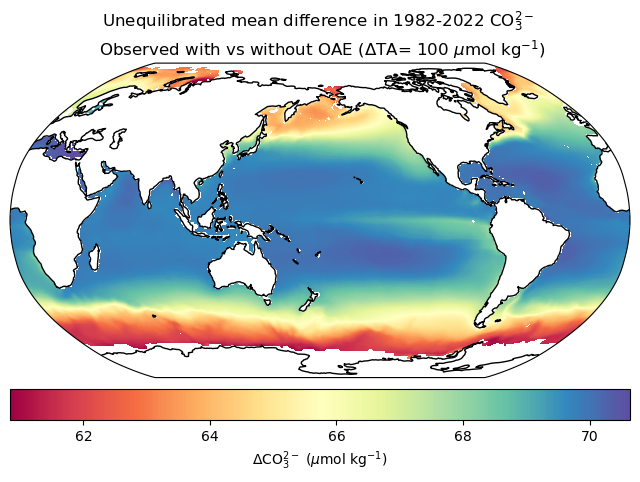

In [260]:
# Figure 8c: Unequilibrated mean differences for observed with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_obs_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$CO$_3^{2-}$ ($\mu$mol kg$^{-1}$)',
             ticks=[60,62,64,66,68,70]);

plt.savefig('Fig8c_map_uneq_obs_co3_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/1942032868.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Unequilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


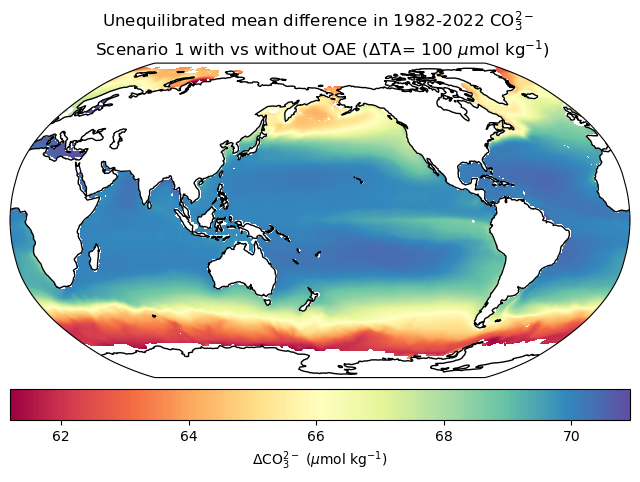

In [261]:
# Figure 8d: Unequilibrated mean differences for scen1 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen1_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$CO$_3^{2-}$ ($\mu$mol kg$^{-1}$)',
             ticks=[60,62,64,66,68,70]);

plt.savefig('Fig8d_map_uneq_scen1_co3_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/900830170.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Unequilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


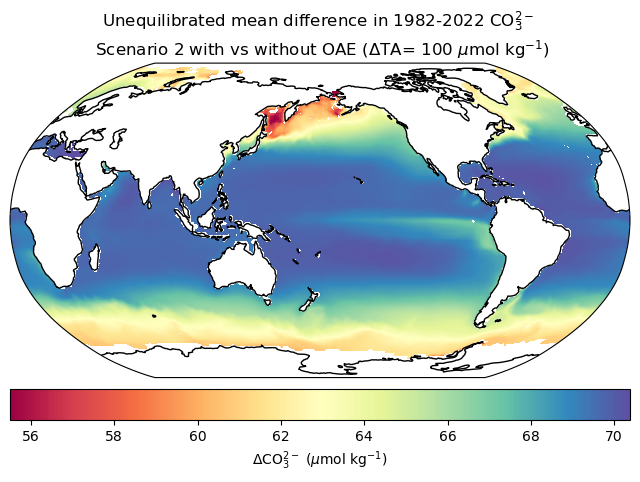

In [263]:
# Figure 8e: Unequilibrated mean differences for scen2 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen2_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$CO$_3^{2-}$ ($\mu$mol kg$^{-1}$)',
             ticks=[52,54,56,58,60,62,64,66,68,70]);

plt.savefig('Fig8e_map_uneq_scen2_co3_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/3734288145.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Equilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


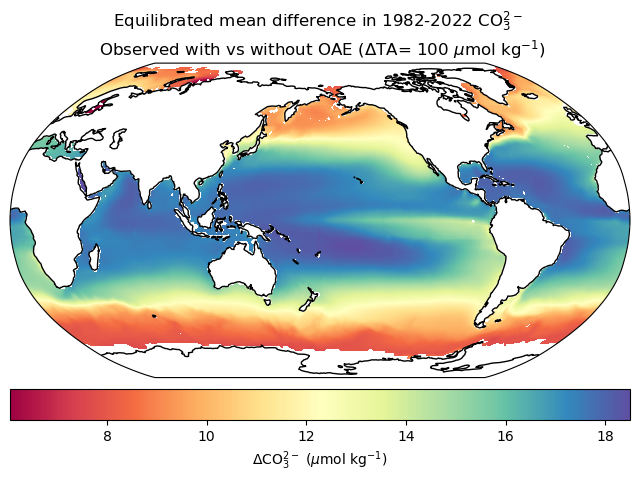

In [265]:
# Figure 8f: Equilibrated mean differences for observed with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_obs_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$CO$_3^{2-}$ ($\mu$mol kg$^{-1}$)',
             ticks=[6,8,10,12,14,16,18]);

plt.savefig('Fig8f_map_eq_obs_co3_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/1492228625.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Equilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


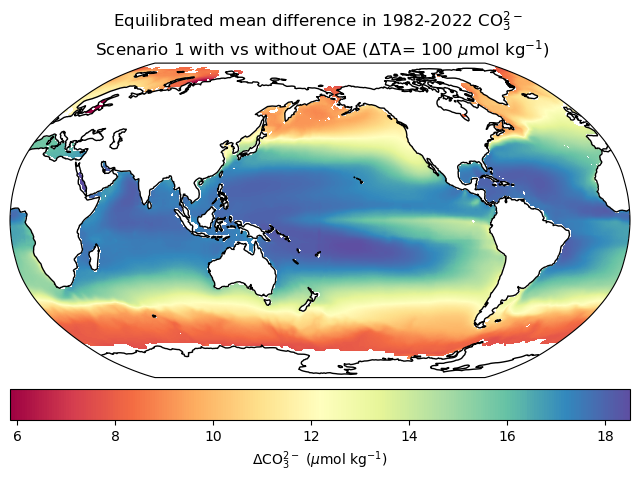

In [266]:
# Figure 8g: Equilibrated mean differences for scen1 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen1_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$CO$_3^{2-}$ ($\mu$mol kg$^{-1}$)',
             ticks=[6,8,10,12,14,16,18]);

plt.savefig('Fig8g_map_eq_scen1_co3_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/3862477044.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Equilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


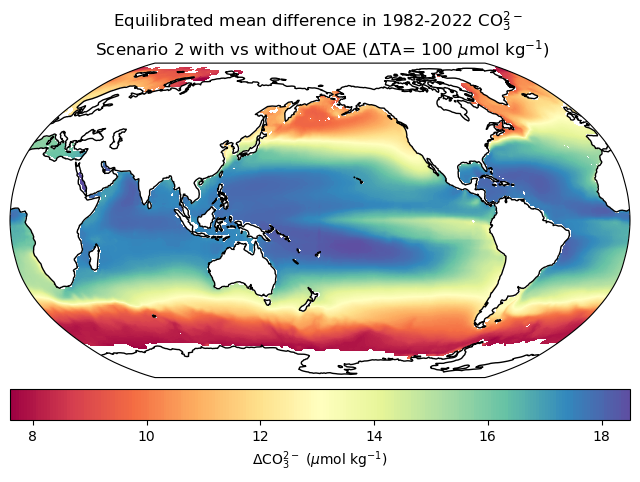

In [267]:
# Figure 8h: Equilibrated mean differences for scen2 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen2_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 CO$_3^{2-}$ \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$CO$_3^{2-}$ ($\mu$mol kg$^{-1}$)',
             ticks=[6,8,10,12,14,16,18]);

plt.savefig('Fig8h_map_eq_scen2_co3_mean_diff_v07.png', format='png', dpi=300)
plt.show()

## **Maps for Ωara**

Maps of the following outputs for Ωara in the global oceans:

- a) Mean of observed conditions without OAE
- b) Standard deviation of observed conditions without OAE
- Unequilibrated mean differences with vs without OAE addition of TA of 100 umol/kg, for the following:
    - c) observed
    - d) scenario 1
    - e) scenario 2
- Equilibrated mean differences with vs without OAE addition of TA of 100 umol/kg, for the following:
    - f) observed
    - g) scenario 1
    - h) scenario 2

In [303]:
# variables to use for stats
var_obs = ds_dict["omara_obs"]
var_scen1 = ds_dict["omara_scen1"]
var_scen2 = ds_dict["omara_scen2"]
var_obs_oae_uneq = ds_dict["omara_obs_oae_uneq"]
var_scen1_oae_uneq = ds_dict["omara_scen1_oae_uneq"]
var_scen2_oae_uneq = ds_dict["omara_scen2_oae_uneq"]
var_obs_oae_eq = ds_dict["omara_obs_oae_eq"]
var_scen1_oae_eq = ds_dict["omara_scen1_oae_eq"]
var_scen2_oae_eq = ds_dict["omara_scen2_oae_eq"]
# without oae
mean_obs = np.nanmean(var_obs,0)   # mean of obs across time dim
std_obs = np.nanstd(var_obs,0)   # std of obs across time dim
mean_scen1 = np.nanmean(var_scen1,0)
mean_scen2 = np.nanmean(var_scen2,0)
# with oae_uneq
mean_obs_oae_uneq = np.nanmean(var_obs_oae_uneq,0)
mean_scen1_oae_uneq = np.nanmean(var_scen1_oae_uneq,0)
mean_scen2_oae_uneq = np.nanmean(var_scen2_oae_uneq,0)
dif_obs_oae_uneq = var_obs_oae_uneq - var_obs
dif_scen1_oae_uneq = var_scen1_oae_uneq - var_scen1
dif_scen2_oae_uneq = var_scen2_oae_uneq - var_scen2
mean_dif_obs_oae_uneq = np.nanmean(dif_obs_oae_uneq,0)
mean_dif_scen1_oae_uneq = np.nanmean(dif_scen1_oae_uneq,0)
mean_dif_scen2_oae_uneq = np.nanmean(dif_scen2_oae_uneq,0)
# with oae_eq
mean_obs_oae_eq = np.nanmean(var_obs_oae_eq,0)
mean_scen1_oae_eq = np.nanmean(var_scen1_oae_eq,0)
mean_scen2_oae_eq = np.nanmean(var_scen2_oae_eq,0)
dif_obs_oae_eq = var_obs_oae_eq - var_obs
dif_scen1_oae_eq = var_scen1_oae_eq - var_scen1
dif_scen2_oae_eq = var_scen2_oae_eq - var_scen2
mean_dif_obs_oae_eq = np.nanmean(dif_obs_oae_eq,0)
mean_dif_scen1_oae_eq = np.nanmean(dif_scen1_oae_eq,0)
mean_dif_scen2_oae_eq = np.nanmean(dif_scen2_oae_eq,0)

/tmp/ipykernel_36656/1320493932.py:12: RuntimeWarning: Mean of empty slice
  mean_obs = np.nanmean(var_obs,0)   # mean of obs across time dim
/home/greg/miniconda3/envs/ipynb/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_36656/1320493932.py:14: RuntimeWarning: Mean of empty slice
  mean_scen1 = np.nanmean(var_scen1,0)
/tmp/ipykernel_36656/1320493932.py:15: RuntimeWarning: Mean of empty slice
  mean_scen2 = np.nanmean(var_scen2,0)
/tmp/ipykernel_36656/1320493932.py:17: RuntimeWarning: Mean of empty slice
  mean_obs_oae_uneq = np.nanmean(var_obs_oae_uneq,0)
/tmp/ipykernel_36656/1320493932.py:18: RuntimeWarning: Mean of empty slice
  mean_scen1_oae_uneq = np.nanmean(var_scen1_oae_uneq,0)
/tmp/ipykernel_36656/1320493932.py:19: RuntimeWarning: Mean of empty slice
  mean_scen2_oae_uneq = np.nanmean(var_scen2_oae_uneq,0)
/tmp/ipykernel_36656/1320

<>:16: SyntaxWarning: invalid escape sequence '\O'
<>:16: SyntaxWarning: invalid escape sequence '\O'
/tmp/ipykernel_36656/1544821776.py:16: SyntaxWarning: invalid escape sequence '\O'
  plt.title('Mean of observed $\Omega_{ara}$ from 1982-2022')


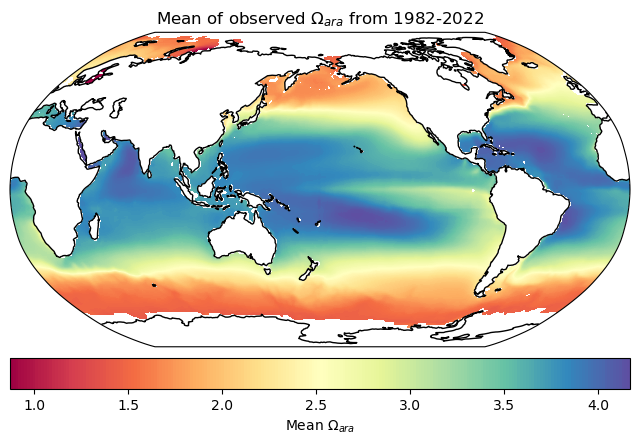

In [306]:
# Figure 9a: mean observed without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_obs
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Mean of observed $\Omega_{ara}$ from 1982-2022')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'Mean $\Omega_{ara}$',
             ticks=[.5,1,1.5,2,2.5,3,3.5,4]);
plt.savefig('Fig9a_map_mean_obs_omara_without_OAE_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\O'
<>:16: SyntaxWarning: invalid escape sequence '\O'
/tmp/ipykernel_36656/2362873034.py:16: SyntaxWarning: invalid escape sequence '\O'
  plt.title('Standard deviation of observed $\Omega_{ara}$ from 1982-2022')


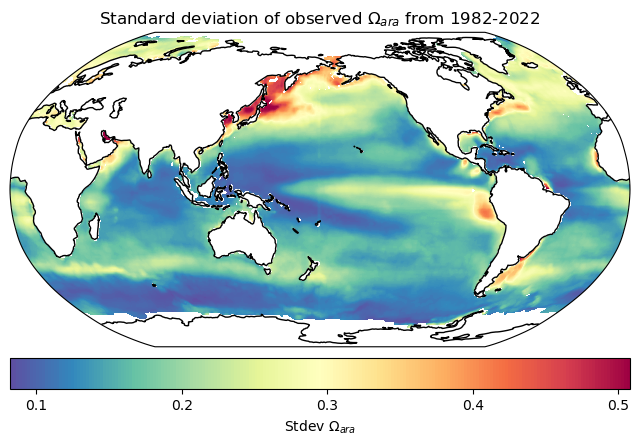

In [310]:
# Figure 9b: stdev observed without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = std_obs
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Standard deviation of observed $\Omega_{ara}$ from 1982-2022')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'Stdev $\Omega_{ara}$',
             ticks=[.1,.2,.3,.4,.5]);
plt.savefig('Fig9b_map_stdev_obs_omara_without_OAE_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\O'
<>:16: SyntaxWarning: invalid escape sequence '\O'
/tmp/ipykernel_36656/146535612.py:16: SyntaxWarning: invalid escape sequence '\O'
  plt.title('Unequilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


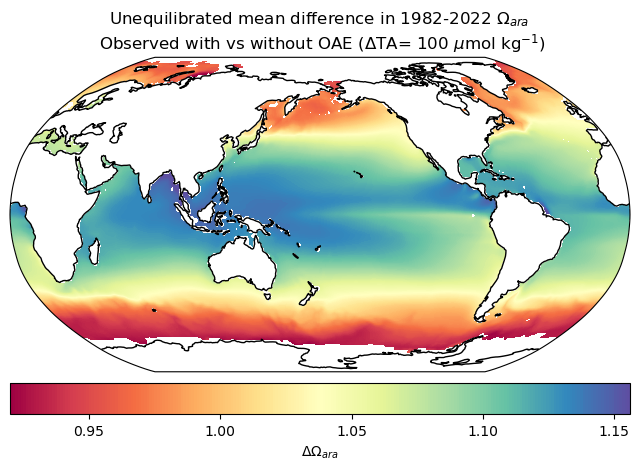

In [313]:
# Figure 9c: Unequilibrated mean differences for observed with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_obs_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\Omega_{ara}$',
             ticks=[.9,.95,1,1.05,1.1,1.15]);

plt.savefig('Fig9c_map_uneq_obs_omara_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\O'
<>:16: SyntaxWarning: invalid escape sequence '\O'
/tmp/ipykernel_36656/1121303509.py:16: SyntaxWarning: invalid escape sequence '\O'
  plt.title('Unequilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


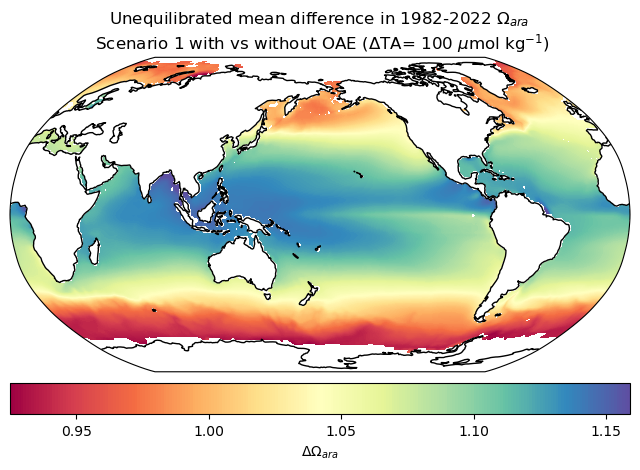

In [314]:
# Figure 9d: Unequilibrated mean differences for scen1 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen1_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\Omega_{ara}$',
             ticks=[.9,.95,1,1.05,1.1,1.15]);

plt.savefig('Fig9d_map_uneq_scen1_omara_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\O'
<>:16: SyntaxWarning: invalid escape sequence '\O'
/tmp/ipykernel_36656/2328103628.py:16: SyntaxWarning: invalid escape sequence '\O'
  plt.title('Unequilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


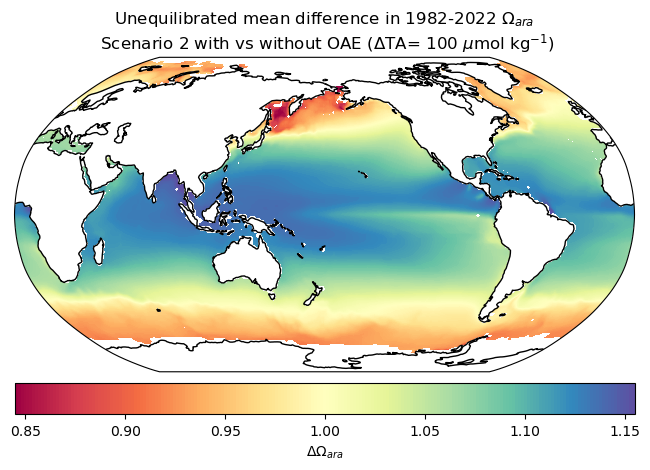

In [316]:
# Figure 9e: Unequilibrated mean differences for scen2 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen2_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\Omega_{ara}$',
             ticks=[.85,.9,.95,1,1.05,1.1,1.15]);

plt.savefig('Fig9e_map_uneq_scen2_omara_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\O'
<>:16: SyntaxWarning: invalid escape sequence '\O'
/tmp/ipykernel_36656/1621208985.py:16: SyntaxWarning: invalid escape sequence '\O'
  plt.title('Equilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


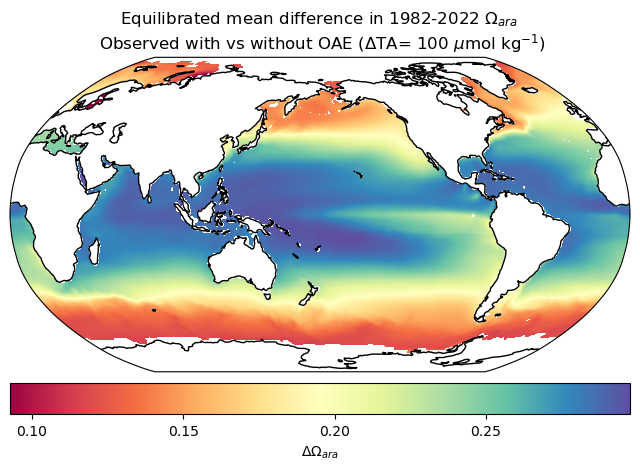

In [320]:
# Figure 9f: Equilibrated mean differences for observed with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_obs_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\Omega_{ara}$',
             ticks=[.05,.1,.15,.2,.25,.3,.35]);

plt.savefig('Fig9f_map_eq_obs_omara_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\O'
<>:16: SyntaxWarning: invalid escape sequence '\O'
/tmp/ipykernel_36656/1022280615.py:16: SyntaxWarning: invalid escape sequence '\O'
  plt.title('Equilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


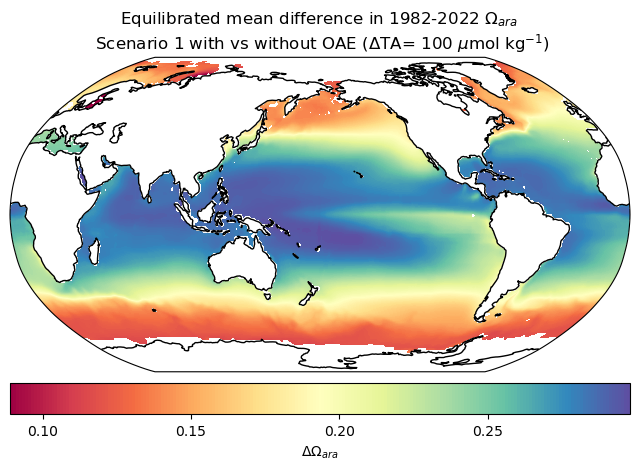

In [321]:
# Figure 9g: Equilibrated mean differences for scen1 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen1_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\Omega_{ara}$',
             ticks=[.05,.1,.15,.2,.25,.3,.35]);

plt.savefig('Fig9g_map_eq_scen1_omara_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\O'
<>:16: SyntaxWarning: invalid escape sequence '\O'
/tmp/ipykernel_36656/1994995266.py:16: SyntaxWarning: invalid escape sequence '\O'
  plt.title('Equilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


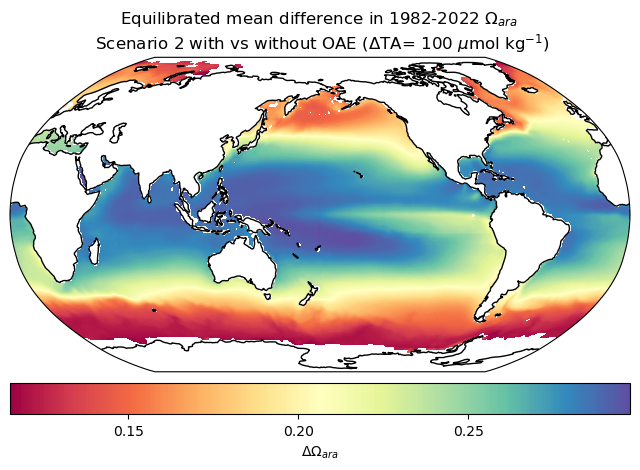

In [322]:
# Figure 9h: Equilibrated mean differences for scen2 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen2_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 $\Omega_{ara}$ \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta\Omega_{ara}$',
             ticks=[.05,.1,.15,.2,.25,.3,.35]);

plt.savefig('Fig9h_map_eq_scen2_omara_mean_diff_v07.png', format='png', dpi=300)
plt.show()

## **Maps for pH**

Maps of the following outputs for pH in the global oceans:

- a) Mean of observed conditions without OAE
- b) Standard deviation of observed conditions without OAE
- Unequilibrated mean differences with vs without OAE addition of TA of 100 umol/kg, for the following:
    - c) observed
    - d) scenario 1
    - e) scenario 2
- Equilibrated mean differences with vs without OAE addition of TA of 100 umol/kg, for the following:
    - f) observed
    - g) scenario 1
    - h) scenario 2

In [323]:
# variables to use for stats
var_obs = ds_dict["phtot_obs"]
var_scen1 = ds_dict["phtot_scen1"]
var_scen2 = ds_dict["phtot_scen2"]
var_obs_oae_uneq = ds_dict["phtot_obs_oae_uneq"]
var_scen1_oae_uneq = ds_dict["phtot_scen1_oae_uneq"]
var_scen2_oae_uneq = ds_dict["phtot_scen2_oae_uneq"]
var_obs_oae_eq = ds_dict["phtot_obs_oae_eq"]
var_scen1_oae_eq = ds_dict["phtot_scen1_oae_eq"]
var_scen2_oae_eq = ds_dict["phtot_scen2_oae_eq"]
# without oae
mean_obs = np.nanmean(var_obs,0)   # mean of obs across time dim
std_obs = np.nanstd(var_obs,0)   # std of obs across time dim
mean_scen1 = np.nanmean(var_scen1,0)
mean_scen2 = np.nanmean(var_scen2,0)
# with oae_uneq
mean_obs_oae_uneq = np.nanmean(var_obs_oae_uneq,0)
mean_scen1_oae_uneq = np.nanmean(var_scen1_oae_uneq,0)
mean_scen2_oae_uneq = np.nanmean(var_scen2_oae_uneq,0)
dif_obs_oae_uneq = var_obs_oae_uneq - var_obs
dif_scen1_oae_uneq = var_scen1_oae_uneq - var_scen1
dif_scen2_oae_uneq = var_scen2_oae_uneq - var_scen2
mean_dif_obs_oae_uneq = np.nanmean(dif_obs_oae_uneq,0)
mean_dif_scen1_oae_uneq = np.nanmean(dif_scen1_oae_uneq,0)
mean_dif_scen2_oae_uneq = np.nanmean(dif_scen2_oae_uneq,0)
# with oae_eq
mean_obs_oae_eq = np.nanmean(var_obs_oae_eq,0)
mean_scen1_oae_eq = np.nanmean(var_scen1_oae_eq,0)
mean_scen2_oae_eq = np.nanmean(var_scen2_oae_eq,0)
dif_obs_oae_eq = var_obs_oae_eq - var_obs
dif_scen1_oae_eq = var_scen1_oae_eq - var_scen1
dif_scen2_oae_eq = var_scen2_oae_eq - var_scen2
mean_dif_obs_oae_eq = np.nanmean(dif_obs_oae_eq,0)
mean_dif_scen1_oae_eq = np.nanmean(dif_scen1_oae_eq,0)
mean_dif_scen2_oae_eq = np.nanmean(dif_scen2_oae_eq,0)

/tmp/ipykernel_36656/2708583593.py:12: RuntimeWarning: Mean of empty slice
  mean_obs = np.nanmean(var_obs,0)   # mean of obs across time dim
/home/greg/miniconda3/envs/ipynb/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_36656/2708583593.py:14: RuntimeWarning: Mean of empty slice
  mean_scen1 = np.nanmean(var_scen1,0)
/tmp/ipykernel_36656/2708583593.py:15: RuntimeWarning: Mean of empty slice
  mean_scen2 = np.nanmean(var_scen2,0)
/tmp/ipykernel_36656/2708583593.py:17: RuntimeWarning: Mean of empty slice
  mean_obs_oae_uneq = np.nanmean(var_obs_oae_uneq,0)
/tmp/ipykernel_36656/2708583593.py:18: RuntimeWarning: Mean of empty slice
  mean_scen1_oae_uneq = np.nanmean(var_scen1_oae_uneq,0)
/tmp/ipykernel_36656/2708583593.py:19: RuntimeWarning: Mean of empty slice
  mean_scen2_oae_uneq = np.nanmean(var_scen2_oae_uneq,0)
/tmp/ipykernel_36656/2708

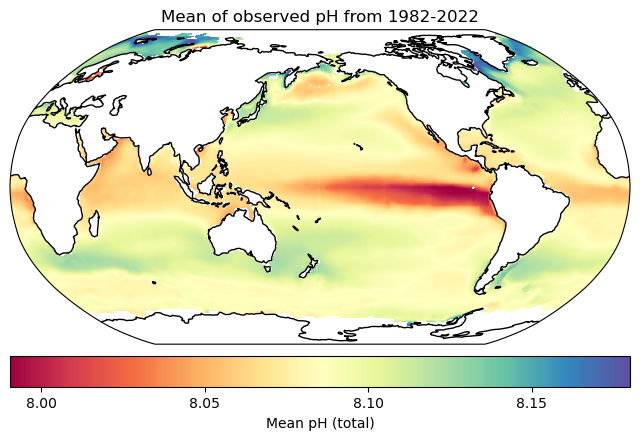

In [325]:
# Figure 10a: mean observed without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_obs
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Mean of observed pH from 1982-2022')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'Mean pH (total)',
             ticks=[7.95,8,8.05,8.1,8.15,8.2]);
plt.savefig('Fig10a_map_mean_obs_phtot_without_OAE_v07.png', format='png', dpi=300)
plt.show()

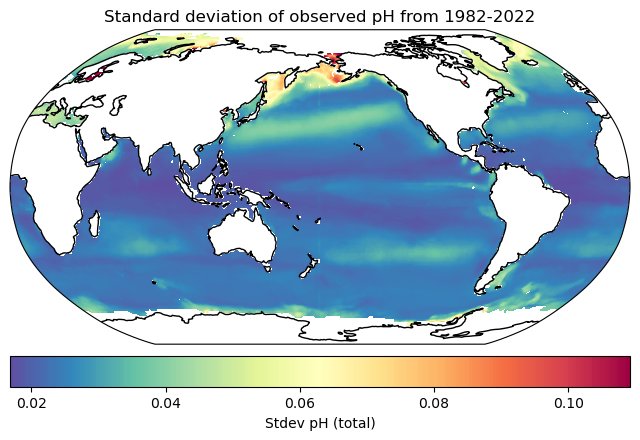

In [328]:
# Figure 10b: stdev observed without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = std_obs
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Standard deviation of observed pH from 1982-2022')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'Stdev pH (total)',
             ticks=[.02,.04,.06,.08,.1,.12]);
plt.savefig('Fig10b_map_stdev_obs_phtot_without_OAE_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/1636337059.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Unequilibrated mean difference in 1982-2022 pH \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


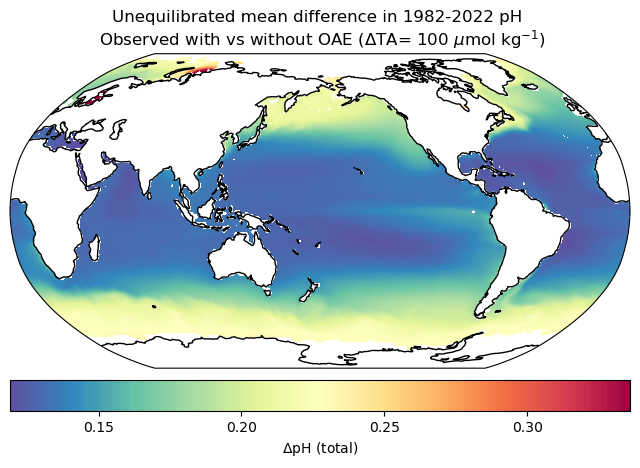

In [332]:
# Figure 10c: Unequilibrated mean differences for observed with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_obs_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 pH \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$pH (total)',
             ticks=[.1,.15,.2,.25,.3,.35]);

plt.savefig('Fig10c_map_uneq_obs_phtot_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/1771346737.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Unequilibrated mean difference in 1982-2022 pH \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


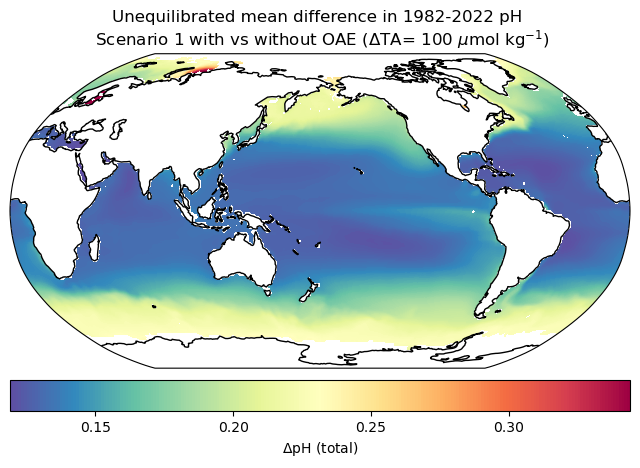

In [333]:
# Figure 10d: Unequilibrated mean differences for scen1 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen1_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 pH \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$pH (total)',
             ticks=[.1,.15,.2,.25,.3,.35]);

plt.savefig('Fig10d_map_uneq_scen1_phtot_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/80830869.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Unequilibrated mean difference in 1982-2022 pH \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


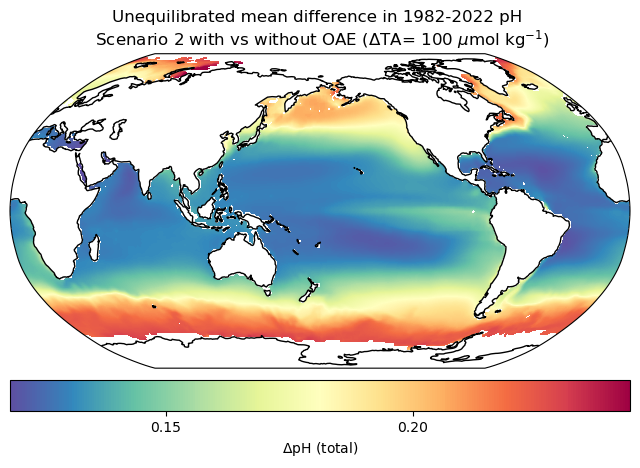

In [334]:
# Figure 10e: Unequilibrated mean differences for scen2 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen2_oae_uneq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Unequilibrated mean difference in 1982-2022 pH \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$pH (total)',
             ticks=[.1,.15,.2,.25,.3,.35]);

plt.savefig('Fig10e_map_uneq_scen2_phtot_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/363809233.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Equilibrated mean difference in 1982-2022 pH \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


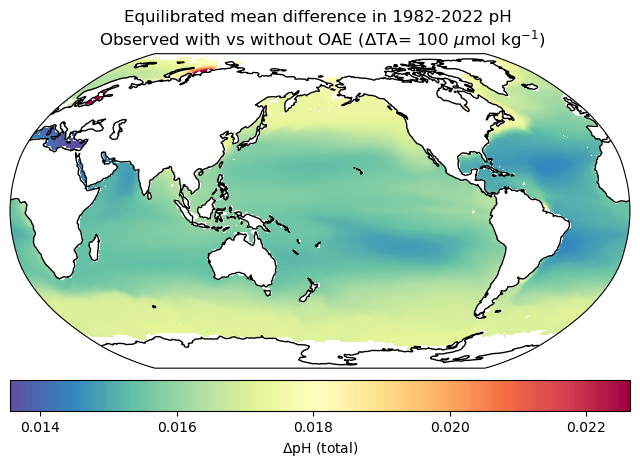

In [336]:
# Figure 10f: Equilibrated mean differences for observed with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_obs_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 pH \n Observed with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$pH (total)',
             ticks=[.01,.012,.014,.016,.018,.02,.022,.024]);

plt.savefig('Fig10f_map_eq_obs_phtot_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/2979419496.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Equilibrated mean difference in 1982-2022 pH \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


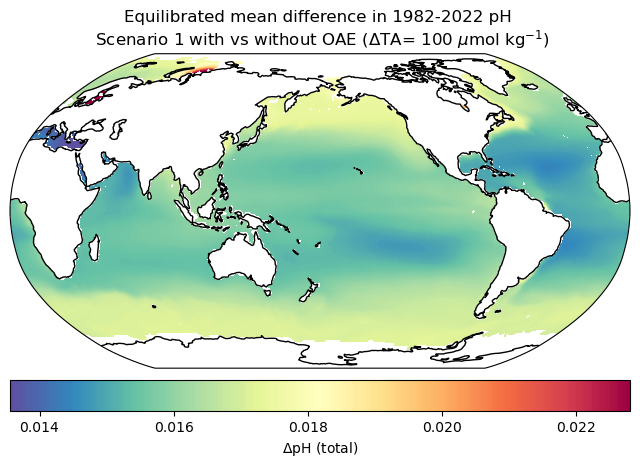

In [337]:
# Figure 10g: Equilibrated mean differences for scen1 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen1_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 pH \n Scenario 1 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$pH (total)',
             ticks=[.01,.012,.014,.016,.018,.02,.022,.024]);

plt.savefig('Fig10g_map_eq_scen1_phtot_mean_diff_v07.png', format='png', dpi=300)
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_36656/2373324726.py:16: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Equilibrated mean difference in 1982-2022 pH \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')


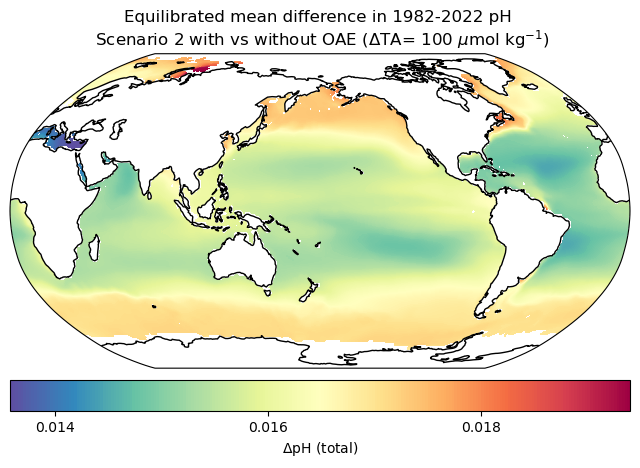

In [338]:
# Figure 10h: Equilibrated mean differences for scen2 with vs without OAE

import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
plt.figure(figsize=(8, 5))
X = np.squeeze(ds_dict['x'])
Y = np.squeeze(ds_dict['y'])
Z = mean_dif_scen2_oae_eq
vmin = np.nanpercentile(Z,.1)
vmax = np.nanpercentile(Z,99.9)
Z[Z<vmin] = vmin
Z[Z>vmax] = vmax
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.set_global()
ax.coastlines()
plt.title('Equilibrated mean difference in 1982-2022 pH \n Scenario 2 with vs without OAE ($\Delta$TA= 100 $\mu$mol kg$^{-1}$)')

if vmin<0 and vmax>0:
    vcenter = 0.0
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree(), norm=norm);
else:
    plt.contourf(X,Y,Z,cmap='Spectral_r',levels=256,transform=ccrs.PlateCarree());

plt.colorbar(orientation="horizontal", pad=0.03,label=r'$\Delta$pH (total)',
             ticks=[.01,.012,.014,.016,.018,.02,.022,.024]);

plt.savefig('Fig10h_map_eq_scen2_phtot_mean_diff_v07.png', format='png', dpi=300)
plt.show()